In [10]:
import os
import scanpy as sc
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
from gprofiler import GProfiler

import re

In [2]:
plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
#sc.set_figure_params(dpi=200, dpi_save=300)
sc.logging.print_versions()

scanpy==1.4.4.post1 anndata==0.6.22.post1 umap==0.3.9 numpy==1.17.4 scipy==1.3.0 pandas==0.25.3 scikit-learn==0.21.2 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


In [152]:
import datetime

today = datetime.date.today().strftime('%y%m%d')

# Introduction

In this notebook, we annotate early life stress data from the Chen lab. The full dataset consists of 12 samples from 4 conditions.
We performed pairwise differential testing of the different conditions with limma in R (on local MacBookPro). The output of limma is a set of tables of differentially expressed genes, which we are going to analyse further in this notebook.

We perform the following steps:
1. Load data (anndata file and tables)
2. Run Gene Set Enrichment Analysis with GProfiler
3. Plot differential expression results in volcano plots
4. Summarise the test results of the different conditions per condition

In particular, we want to know how many genes have changed in each test, how the changes distribute in each cell type (*i.e.* gene overlap for each cell type). 

# Read data

In [3]:
adata = sc.read('./../data/cellxgene.h5ad')

Read in limma result tables.

In [4]:
limma_tmp = pd.read_csv('./../table/limma_191129_BL_Stress_vs_Ctrl_Astrocytes.csv', index_col=0)

In [5]:
limma_tmp[limma_tmp['logFC']>0]

,logFC,AveExpr,t,P.Value,adj.P.Val,B
Ttr,0.838111,0.311394,24.514814,3.038045e-129,1.805814e-125,283.300437
Htra1,1.243958,1.782790,18.483289,3.901734e-75,1.159595e-71,159.915562
Gjb6,0.849853,1.156784,15.018150,1.776650e-50,3.520136e-47,103.757132
Mfsd2a,0.561622,0.372514,14.634238,4.828350e-48,7.174928e-45,98.218385
Msmo1,0.835948,1.149315,14.580586,1.045192e-47,1.242524e-44,97.455324
...,...,...,...,...,...,...
Fbf1,0.077158,0.053831,4.751301,2.046843e-06,9.893037e-06,4.139410
Rps24,0.266423,0.936057,4.759140,2.057898e-06,9.936754e-06,4.139328
Auh,0.106094,0.107147,4.751268,2.047180e-06,9.893037e-06,4.139254
Oat,0.214888,0.613007,4.749859,2.061462e-06,9.945883e-06,4.132624


Read in all limma tables.

In [144]:
allfiles = np.asarray(os.listdir('./../table/'))
file_idx = np.asarray([file.startswith('limma') for file in allfiles])

In [145]:
files_all = allfiles[file_idx]

# Examine data with joint size factor normalisation

## Check BL samples

Read all files from the test 'BL Stress vs BL Ctrl'.

In [147]:
r = re.compile(".*191216_BL_Stress_vs_Ctrl")
files = list(filter(r.match, files_all)) # Read Note
print(files)

['limma_191216_BL_Stress_vs_Ctrl_Neurons_GABA.csv', 'limma_191216_BL_Stress_vs_Ctrl_13.csv', 'limma_191216_BL_Stress_vs_Ctrl_Neurons_Glutamatergic.csv', 'limma_191216_BL_Stress_vs_Ctrl_Pericytes.csv', 'limma_191216_BL_Stress_vs_Ctrl_28.csv', 'limma_191216_BL_Stress_vs_Ctrl_Neurons_Cajal–Retzius.csv', 'limma_191216_BL_Stress_vs_Ctrl_4.csv', 'limma_191216_BL_Stress_vs_Ctrl_Neural Progenitor Cells (NPCs).csv', 'limma_191216_BL_Stress_vs_Ctrl_12.csv', 'limma_191216_BL_Stress_vs_Ctrl_Oligodendrocytes.csv', 'limma_191216_BL_Stress_vs_Ctrl_2.csv', 'limma_191216_BL_Stress_vs_Ctrl_Meningeal Cells.csv', 'limma_191216_BL_Stress_vs_Ctrl_Endothelial Cells.csv', 'limma_191216_BL_Stress_vs_Ctrl_6.csv', 'limma_191216_BL_Stress_vs_Ctrl_Microglia.csv', 'limma_191216_BL_Stress_vs_Ctrl_Ependymal Cells.csv', 'limma_191216_BL_Stress_vs_Ctrl_Vascular Cells.csv', 'limma_191216_BL_Stress_vs_Ctrl_Committed Oligodendrocyte Progenitors (COPs).csv', 'limma_191216_BL_Stress_vs_Ctrl_Neurons_Cck.csv', 'limma_191216_B

In [148]:
test_results = dict()
for file in files: 
    title = (file.split('limma_')[1]).split('.csv')[0]
    print(file)
    test_results[title] = pd.read_csv('./../table/' + file , index_col=0)

limma_191216_BL_Stress_vs_Ctrl_Neurons_GABA.csv
limma_191216_BL_Stress_vs_Ctrl_13.csv
limma_191216_BL_Stress_vs_Ctrl_Neurons_Glutamatergic.csv
limma_191216_BL_Stress_vs_Ctrl_Pericytes.csv
limma_191216_BL_Stress_vs_Ctrl_28.csv
limma_191216_BL_Stress_vs_Ctrl_Neurons_Cajal–Retzius.csv
limma_191216_BL_Stress_vs_Ctrl_4.csv
limma_191216_BL_Stress_vs_Ctrl_Neural Progenitor Cells (NPCs).csv
limma_191216_BL_Stress_vs_Ctrl_12.csv
limma_191216_BL_Stress_vs_Ctrl_Oligodendrocytes.csv
limma_191216_BL_Stress_vs_Ctrl_2.csv
limma_191216_BL_Stress_vs_Ctrl_Meningeal Cells.csv
limma_191216_BL_Stress_vs_Ctrl_Endothelial Cells.csv
limma_191216_BL_Stress_vs_Ctrl_6.csv
limma_191216_BL_Stress_vs_Ctrl_Microglia.csv
limma_191216_BL_Stress_vs_Ctrl_Ependymal Cells.csv
limma_191216_BL_Stress_vs_Ctrl_Vascular Cells.csv
limma_191216_BL_Stress_vs_Ctrl_Committed Oligodendrocyte Progenitors (COPs).csv
limma_191216_BL_Stress_vs_Ctrl_Neurons_Cck.csv
limma_191216_BL_Stress_vs_Ctrl_Oligodendrocyte Progenitor Cells (OPCs).cs

In [149]:
high_stress = [sum(test_results[table]['logFC']>0) for table in test_results]
high_ctrl = [sum(test_results[table]['logFC']<0) for table in test_results]
labels = [table.split('_')[-1] for table in test_results]

In [150]:
high_ctrl

[0, 0, 1, 0, 0, 0, 7, 0, 0, 4, 6, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 3, 1]

In [151]:
high_stress

[2,
 0,
 6120,
 0,
 0,
 4,
 462,
 0,
 0,
 2994,
 3164,
 0,
 72,
 6,
 7,
 0,
 0,
 0,
 2,
 1,
 706,
 2378,
 1,
 0,
 375]

Visualise the number of expressed genes per cell type as barplot.

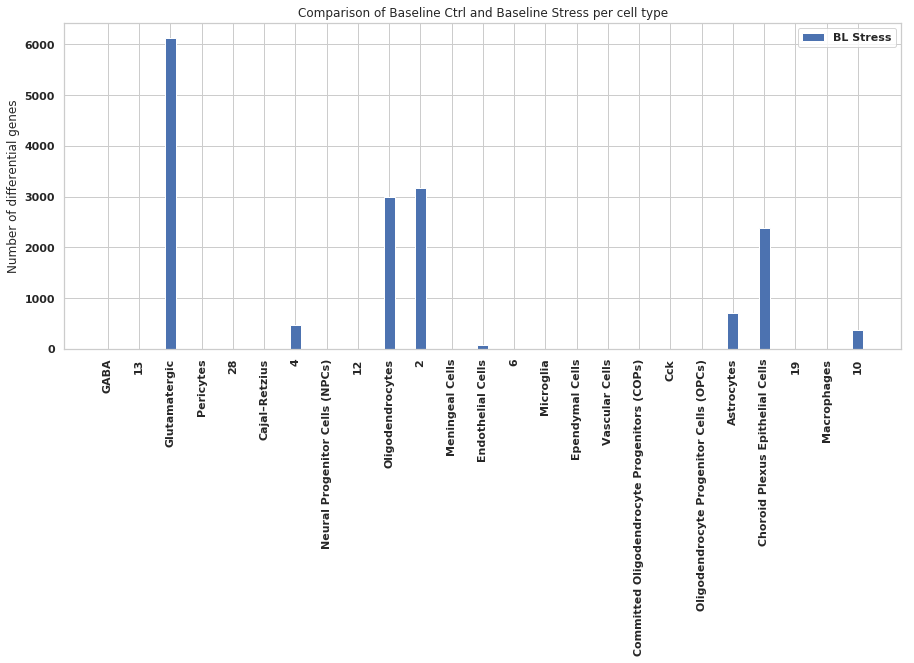

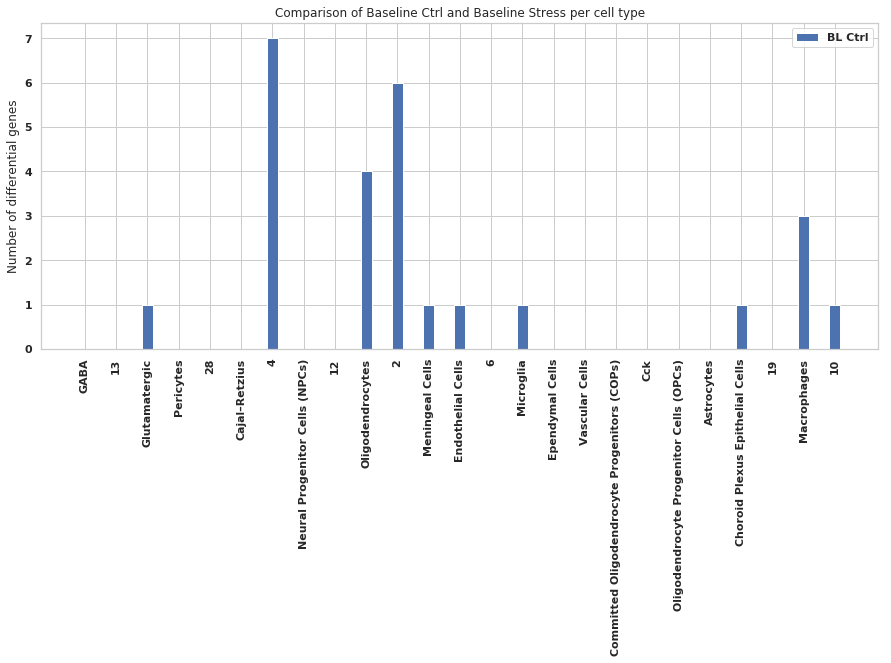

In [153]:
rcParams['figure.figsize']=(15,6)
N = len(high_stress)
ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence

p1 = plt.bar(ind, high_stress, width)
#p2 = plt.bar(ind, high_ctrl, width,
#             bottom=high_stress)

plt.ylabel('Number of differential genes')
plt.title('Comparison of Baseline Ctrl and Baseline Stress per cell type')
plt.xticks(ind, (labels), rotation='vertical')
#plt.yticks(np.arange(0, 81, 10))
plt.legend(['BL Stress'])
plt.savefig(today+ '_BL_stress_vs_ctrl_per_cell_type_BL_stress_high_genes.png', bbox_inches='tight')
plt.show()


rcParams['figure.figsize']=(15,6)
N = len(high_stress)
ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence

#p1 = plt.bar(ind, high_stress, width)
p2 = plt.bar(ind, high_ctrl, width)

plt.ylabel('Number of differential genes')
plt.title('Comparison of Baseline Ctrl and Baseline Stress per cell type')
plt.xticks(ind, (labels), rotation='vertical')
#plt.yticks(np.arange(0, 81, 10))
plt.legend(['BL Ctrl'])
plt.savefig(today + '_BL_stress_vs_ctrl_per_cell_type_BL_ctrl_high_genes.png', bbox_inches='tight')
plt.show()

## Check ELS samples

Read all files from the test 'ELS Stress vs BL Ctrl'.

In [154]:
r = re.compile(".*191216_ELS_Stress_vs_Ctrl")
files = list(filter(r.match, files_all)) # Read Note
print(files)

['limma_191216_ELS_Stress_vs_Ctrl_10.csv', 'limma_191216_ELS_Stress_vs_Ctrl_19.csv', 'limma_191216_ELS_Stress_vs_Ctrl_2.csv', 'limma_191216_ELS_Stress_vs_Ctrl_Endothelial Cells.csv', 'limma_191216_ELS_Stress_vs_Ctrl_Meningeal Cells.csv', 'limma_191216_ELS_Stress_vs_Ctrl_Neurons_Cajal–Retzius.csv', 'limma_191216_ELS_Stress_vs_Ctrl_Neurons_GABA.csv', 'limma_191216_ELS_Stress_vs_Ctrl_Neurons_Glutamatergic.csv', 'limma_191216_ELS_Stress_vs_Ctrl_Committed Oligodendrocyte Progenitors (COPs).csv', 'limma_191216_ELS_Stress_vs_Ctrl_4.csv', 'limma_191216_ELS_Stress_vs_Ctrl_Oligodendrocyte Progenitor Cells (OPCs).csv', 'limma_191216_ELS_Stress_vs_Ctrl_Pericytes.csv', 'limma_191216_ELS_Stress_vs_Ctrl_Choroid Plexus Epithelial Cells.csv', 'limma_191216_ELS_Stress_vs_Ctrl_Oligodendrocytes.csv', 'limma_191216_ELS_Stress_vs_Ctrl_Astrocytes.csv', 'limma_191216_ELS_Stress_vs_Ctrl_Vascular Cells.csv', 'limma_191216_ELS_Stress_vs_Ctrl_12.csv', 'limma_191216_ELS_Stress_vs_Ctrl_Macrophages.csv', 'limma_1912

In [155]:
test_results = dict()
for file in files: 
    title = (file.split('limma_')[1]).split('.csv')[0]
    print(file)
    test_results[title] = pd.read_csv('./../table/' + file , index_col=0)

limma_191216_ELS_Stress_vs_Ctrl_10.csv
limma_191216_ELS_Stress_vs_Ctrl_19.csv
limma_191216_ELS_Stress_vs_Ctrl_2.csv
limma_191216_ELS_Stress_vs_Ctrl_Endothelial Cells.csv
limma_191216_ELS_Stress_vs_Ctrl_Meningeal Cells.csv
limma_191216_ELS_Stress_vs_Ctrl_Neurons_Cajal–Retzius.csv
limma_191216_ELS_Stress_vs_Ctrl_Neurons_GABA.csv
limma_191216_ELS_Stress_vs_Ctrl_Neurons_Glutamatergic.csv
limma_191216_ELS_Stress_vs_Ctrl_Committed Oligodendrocyte Progenitors (COPs).csv
limma_191216_ELS_Stress_vs_Ctrl_4.csv
limma_191216_ELS_Stress_vs_Ctrl_Oligodendrocyte Progenitor Cells (OPCs).csv
limma_191216_ELS_Stress_vs_Ctrl_Pericytes.csv
limma_191216_ELS_Stress_vs_Ctrl_Choroid Plexus Epithelial Cells.csv
limma_191216_ELS_Stress_vs_Ctrl_Oligodendrocytes.csv
limma_191216_ELS_Stress_vs_Ctrl_Astrocytes.csv
limma_191216_ELS_Stress_vs_Ctrl_Vascular Cells.csv
limma_191216_ELS_Stress_vs_Ctrl_12.csv
limma_191216_ELS_Stress_vs_Ctrl_Macrophages.csv
limma_191216_ELS_Stress_vs_Ctrl_Microglia.csv
limma_191216_ELS_Str

In [156]:
high_stress = [sum(test_results[table]['logFC']>0) for table in test_results]
high_ctrl = [sum(test_results[table]['logFC']<0) for table in test_results]
labels = [table.split('_')[-1] for table in test_results]

Visualise the number of expressed genes per cell type as barplot.

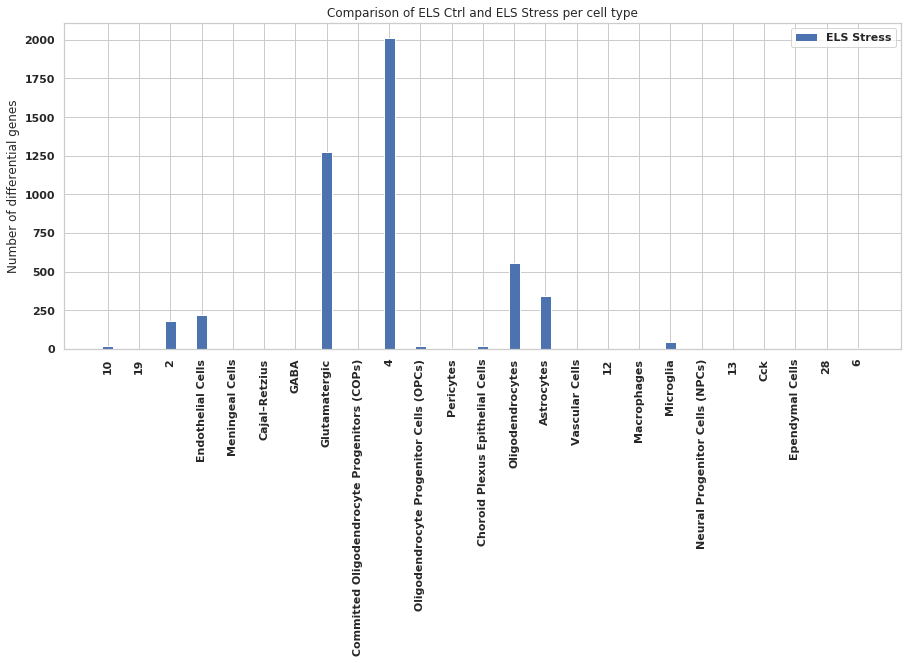

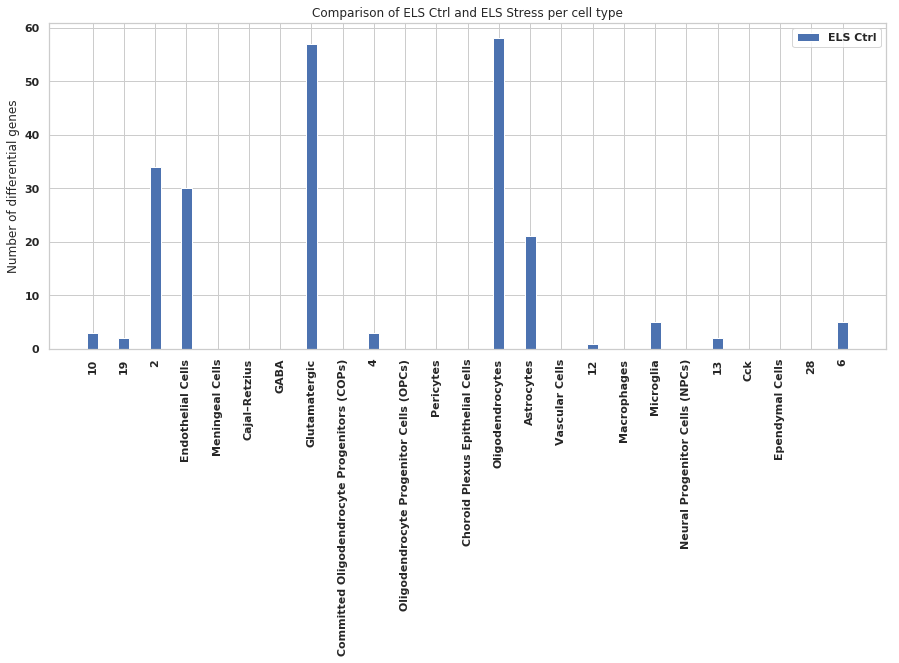

In [157]:
rcParams['figure.figsize']=(15,6)
N = len(high_stress)
ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence

p1 = plt.bar(ind, high_stress, width)
#p2 = plt.bar(ind, high_ctrl, width,
#             bottom=high_stress)

plt.ylabel('Number of differential genes')
plt.title('Comparison of ELS Ctrl and ELS Stress per cell type')
plt.xticks(ind, (labels), rotation='vertical')
#plt.yticks(np.arange(0, 81, 10))
plt.legend(['ELS Stress'])
plt.savefig(today+ '_ELS_ctrl_vs_stress_per_cell_type_ELS_stress_high_genes.png', bbox_inches='tight')
plt.show()


rcParams['figure.figsize']=(15,6)
N = len(high_stress)
ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence

#p1 = plt.bar(ind, high_stress, width)
p2 = plt.bar(ind, high_ctrl, width)

plt.ylabel('Number of differential genes')
plt.title('Comparison of ELS Ctrl and ELS Stress per cell type')
plt.xticks(ind, (labels), rotation='vertical')
#plt.yticks(np.arange(0, 81, 10))
plt.legend(['ELS Ctrl'])
plt.savefig(today + '_ELS_ctrl_vs_stress_per_cell_type_ELS_ctrl_high_genes.png', bbox_inches='tight')
plt.show()

## Check ctrl samples

Read all files from the test 'Ctrl ELS vs BL'.

In [158]:
r = re.compile(".*191216_Ctrl_ELS_vs_BL")
files = list(filter(r.match, files_all)) # Read Note
print(files)

['limma_191216_Ctrl_ELS_vs_BL_12.csv', 'limma_191216_Ctrl_ELS_vs_BL_Macrophages.csv', 'limma_191216_Ctrl_ELS_vs_BL_Neurons_Cck.csv', 'limma_191216_Ctrl_ELS_vs_BL_Neurons_Glutamatergic.csv', 'limma_191216_Ctrl_ELS_vs_BL_13.csv', 'limma_191216_Ctrl_ELS_vs_BL_Neurons_GABA.csv', 'limma_191216_Ctrl_ELS_vs_BL_6.csv', 'limma_191216_Ctrl_ELS_vs_BL_Pericytes.csv', 'limma_191216_Ctrl_ELS_vs_BL_28.csv', 'limma_191216_Ctrl_ELS_vs_BL_Ependymal Cells.csv', 'limma_191216_Ctrl_ELS_vs_BL_Vascular Cells.csv', 'limma_191216_Ctrl_ELS_vs_BL_Committed Oligodendrocyte Progenitors (COPs).csv', 'limma_191216_Ctrl_ELS_vs_BL_Choroid Plexus Epithelial Cells.csv', 'limma_191216_Ctrl_ELS_vs_BL_Oligodendrocytes.csv', 'limma_191216_Ctrl_ELS_vs_BL_19.csv', 'limma_191216_Ctrl_ELS_vs_BL_Oligodendrocyte Progenitor Cells (OPCs).csv', 'limma_191216_Ctrl_ELS_vs_BL_Meningeal Cells.csv', 'limma_191216_Ctrl_ELS_vs_BL_10.csv', 'limma_191216_Ctrl_ELS_vs_BL_2.csv', 'limma_191216_Ctrl_ELS_vs_BL_Endothelial Cells.csv', 'limma_19121

In [159]:
test_results = dict()
for file in files: 
    title = (file.split('limma_')[1]).split('.csv')[0]
    print(file)
    test_results[title] = pd.read_csv('./../table/' + file , index_col=0)

limma_191216_Ctrl_ELS_vs_BL_12.csv
limma_191216_Ctrl_ELS_vs_BL_Macrophages.csv
limma_191216_Ctrl_ELS_vs_BL_Neurons_Cck.csv
limma_191216_Ctrl_ELS_vs_BL_Neurons_Glutamatergic.csv
limma_191216_Ctrl_ELS_vs_BL_13.csv
limma_191216_Ctrl_ELS_vs_BL_Neurons_GABA.csv
limma_191216_Ctrl_ELS_vs_BL_6.csv
limma_191216_Ctrl_ELS_vs_BL_Pericytes.csv
limma_191216_Ctrl_ELS_vs_BL_28.csv
limma_191216_Ctrl_ELS_vs_BL_Ependymal Cells.csv
limma_191216_Ctrl_ELS_vs_BL_Vascular Cells.csv
limma_191216_Ctrl_ELS_vs_BL_Committed Oligodendrocyte Progenitors (COPs).csv
limma_191216_Ctrl_ELS_vs_BL_Choroid Plexus Epithelial Cells.csv
limma_191216_Ctrl_ELS_vs_BL_Oligodendrocytes.csv
limma_191216_Ctrl_ELS_vs_BL_19.csv
limma_191216_Ctrl_ELS_vs_BL_Oligodendrocyte Progenitor Cells (OPCs).csv
limma_191216_Ctrl_ELS_vs_BL_Meningeal Cells.csv
limma_191216_Ctrl_ELS_vs_BL_10.csv
limma_191216_Ctrl_ELS_vs_BL_2.csv
limma_191216_Ctrl_ELS_vs_BL_Endothelial Cells.csv
limma_191216_Ctrl_ELS_vs_BL_Neurons_Cajal–Retzius.csv
limma_191216_Ctrl_E

In [160]:
high_ELS = [sum(test_results[table]['logFC']>0) for table in test_results]
high_BL = [sum(test_results[table]['logFC']<0) for table in test_results]
labels = [table.split('_')[-1] for table in test_results]

Visualise the number of expressed genes per cell type as barplot.

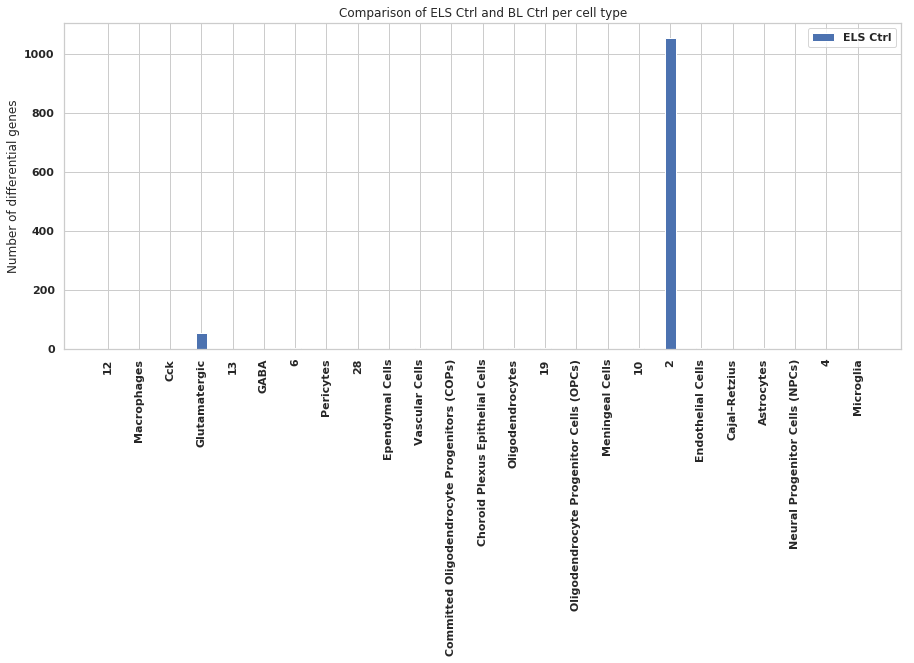

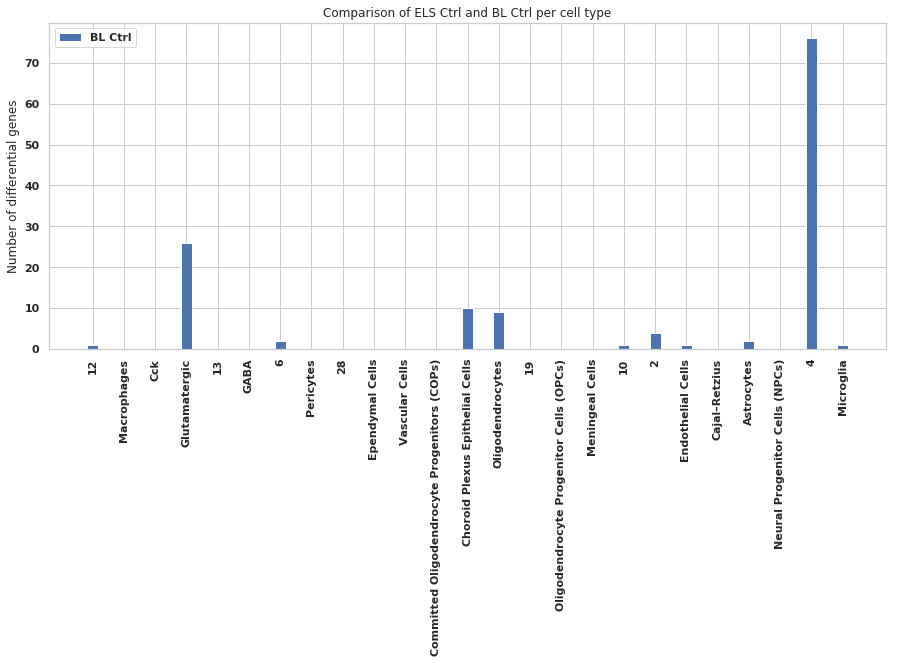

In [161]:
rcParams['figure.figsize']=(15,6)
N = len(high_ELS)
ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence

p1 = plt.bar(ind, high_ELS, width)
#p2 = plt.bar(ind, high_ctrl, width,
#             bottom=high_stress)

plt.ylabel('Number of differential genes')
plt.title('Comparison of ELS Ctrl and BL Ctrl per cell type')
plt.xticks(ind, (labels), rotation='vertical')
#plt.yticks(np.arange(0, 81, 10))
plt.legend(['ELS Ctrl'])
plt.savefig(today+ '_Ctrl_ELS_vs_BL_per_cell_type_ELS_ctrl_high_genes.png', bbox_inches='tight')
plt.show()


rcParams['figure.figsize']=(15,6)
N = len(high_ELS)
ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence

#p1 = plt.bar(ind, high_stress, width)
p2 = plt.bar(ind, high_BL, width)

plt.ylabel('Number of differential genes')
plt.title('Comparison of ELS Ctrl and BL Ctrl per cell type')
plt.xticks(ind, (labels), rotation='vertical')
#plt.yticks(np.arange(0, 81, 10))
plt.legend(['BL Ctrl'])
plt.savefig(today+'_Ctrl_ELS_vs_BL_per_cell_type_BL_ctrl_high_genes.png', bbox_inches='tight')
plt.show()

## Check Stress samples

Read all files from the test 'Stress ELS vs BL'.

In [163]:
r = re.compile(".*191216_Stress_ELS_vs_BL")
files = list(filter(r.match, files_all)) # Read Note
print(files)

['limma_191216_Stress_ELS_vs_BL_Neurons_Cck.csv', 'limma_191216_Stress_ELS_vs_BL_Pericytes.csv', 'limma_191216_Stress_ELS_vs_BL_4.csv', 'limma_191216_Stress_ELS_vs_BL_Choroid Plexus Epithelial Cells.csv', 'limma_191216_Stress_ELS_vs_BL_Endothelial Cells.csv', 'limma_191216_Stress_ELS_vs_BL_Macrophages.csv', 'limma_191216_Stress_ELS_vs_BL_Oligodendrocyte Progenitor Cells (OPCs).csv', 'limma_191216_Stress_ELS_vs_BL_10.csv', 'limma_191216_Stress_ELS_vs_BL_2.csv', 'limma_191216_Stress_ELS_vs_BL_19.csv', 'limma_191216_Stress_ELS_vs_BL_Neurons_GABA.csv', 'limma_191216_Stress_ELS_vs_BL_Ependymal Cells.csv', 'limma_191216_Stress_ELS_vs_BL_Vascular Cells.csv', 'limma_191216_Stress_ELS_vs_BL_Neurons_Glutamatergic.csv', 'limma_191216_Stress_ELS_vs_BL_28.csv', 'limma_191216_Stress_ELS_vs_BL_Committed Oligodendrocyte Progenitors (COPs).csv', 'limma_191216_Stress_ELS_vs_BL_Microglia.csv', 'limma_191216_Stress_ELS_vs_BL_Meningeal Cells.csv', 'limma_191216_Stress_ELS_vs_BL_Neurons_Cajal–Retzius.csv', 

In [164]:
test_results = dict()
for file in files: 
    title = (file.split('limma_')[1]).split('.csv')[0]
    print(file)
    test_results[title] = pd.read_csv('./../table/' + file , index_col=0)

limma_191216_Stress_ELS_vs_BL_Neurons_Cck.csv
limma_191216_Stress_ELS_vs_BL_Pericytes.csv
limma_191216_Stress_ELS_vs_BL_4.csv
limma_191216_Stress_ELS_vs_BL_Choroid Plexus Epithelial Cells.csv
limma_191216_Stress_ELS_vs_BL_Endothelial Cells.csv
limma_191216_Stress_ELS_vs_BL_Macrophages.csv
limma_191216_Stress_ELS_vs_BL_Oligodendrocyte Progenitor Cells (OPCs).csv
limma_191216_Stress_ELS_vs_BL_10.csv
limma_191216_Stress_ELS_vs_BL_2.csv
limma_191216_Stress_ELS_vs_BL_19.csv
limma_191216_Stress_ELS_vs_BL_Neurons_GABA.csv
limma_191216_Stress_ELS_vs_BL_Ependymal Cells.csv
limma_191216_Stress_ELS_vs_BL_Vascular Cells.csv
limma_191216_Stress_ELS_vs_BL_Neurons_Glutamatergic.csv
limma_191216_Stress_ELS_vs_BL_28.csv
limma_191216_Stress_ELS_vs_BL_Committed Oligodendrocyte Progenitors (COPs).csv
limma_191216_Stress_ELS_vs_BL_Microglia.csv
limma_191216_Stress_ELS_vs_BL_Meningeal Cells.csv
limma_191216_Stress_ELS_vs_BL_Neurons_Cajal–Retzius.csv
limma_191216_Stress_ELS_vs_BL_13.csv
limma_191216_Stress_E

In [165]:
high_ELS = [sum(test_results[table]['logFC']>0) for table in test_results]
high_BL = [sum(test_results[table]['logFC']<0) for table in test_results]
labels = [table.split('_')[-1] for table in test_results]

Visualise the number of expressed genes per cell type as barplot.

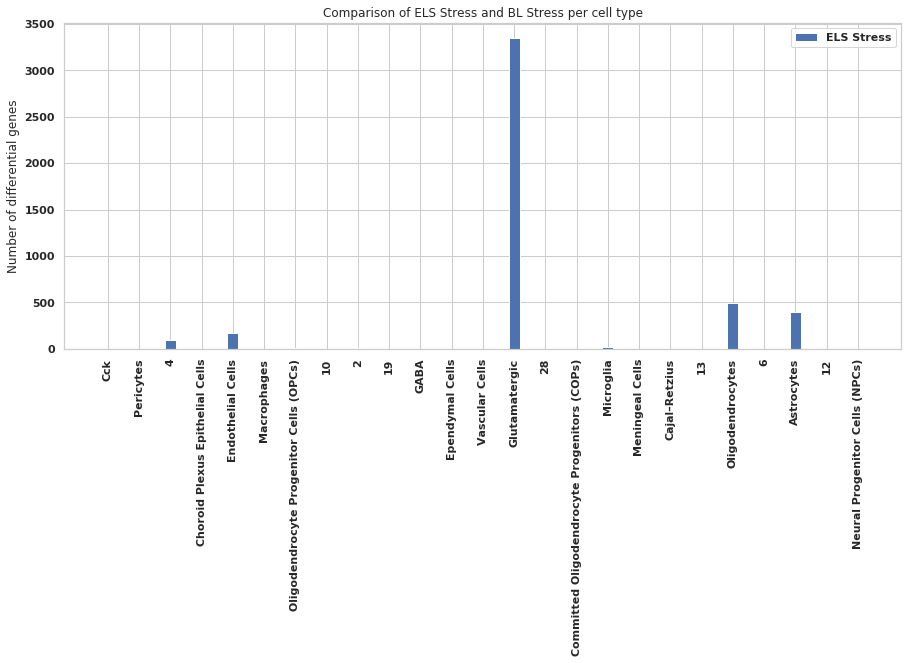

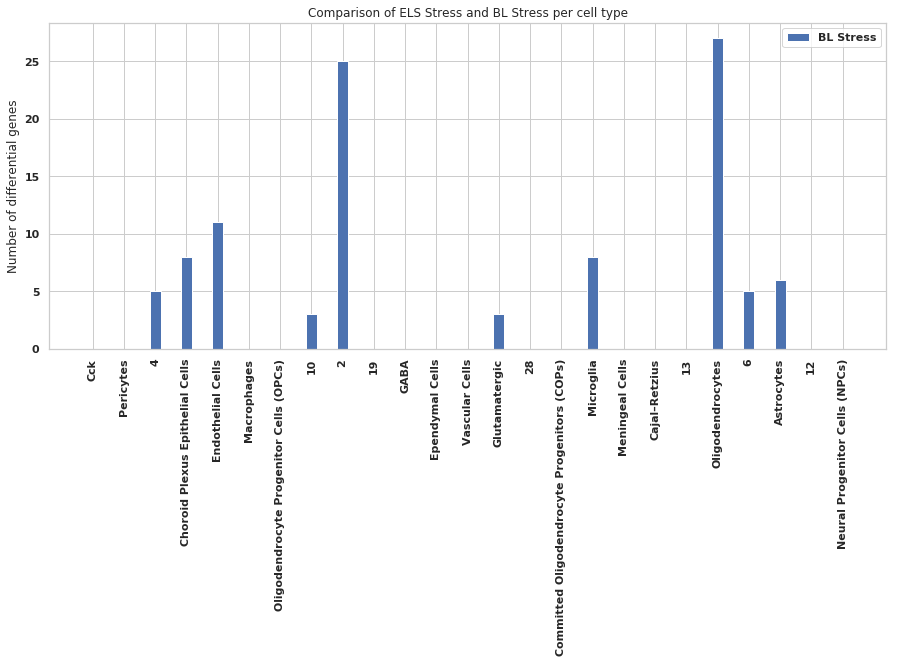

In [166]:
rcParams['figure.figsize']=(15,6)
N = len(high_ELS)
ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence

p1 = plt.bar(ind, high_ELS, width)
#p2 = plt.bar(ind, high_ctrl, width,
#             bottom=high_stress)

plt.ylabel('Number of differential genes')
plt.title('Comparison of ELS Stress and BL Stress per cell type')
plt.xticks(ind, (labels), rotation='vertical')
#plt.yticks(np.arange(0, 81, 10))
plt.legend(['ELS Stress'])
plt.savefig(today+'_Stress_ELS_vs_BL_per_cell_type_ELS_stress_high_genes.png', bbox_inches='tight')
plt.show()


rcParams['figure.figsize']=(15,6)
N = len(high_ELS)
ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence

#p1 = plt.bar(ind, high_stress, width)
p2 = plt.bar(ind, high_BL, width)

plt.ylabel('Number of differential genes')
plt.title('Comparison of ELS Stress and BL Stress per cell type')
plt.xticks(ind, (labels), rotation='vertical')
#plt.yticks(np.arange(0, 81, 10))
plt.legend(['BL Stress'])
plt.savefig(today + '_Stress_ELS_vs_BL_per_cell_type_BL_stress_high_genes.png', bbox_inches='tight')
plt.show()

## Run GSEA for each file

In [134]:
# Plotting functions - 'GProfiler-official version'
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from matplotlib import colors
from matplotlib import rcParams


def scale_data_5_75(data):
    mind = np.min(data)
    maxd = np.max(data)
    
    if maxd == mind:
        maxd=maxd+1
        mind=mind-1
        
    drange = maxd - mind
    return ((((data - mind)/drange*0.70)+0.05)*100)


def plot_enrich(data, n_terms=20, save=False):
    # Test data input
    if not isinstance(data, pd.DataFrame):
        raise ValueError('Please input a Pandas Dataframe output by gprofiler.')
        
    if not np.all([term in data.columns for term in ['p_value', 'name', 'intersection_size']]):
        raise TypeError('The data frame {} does not contain enrichment results from gprofiler.'.format(data))
    
    data_to_plot = data.iloc[:n_terms,:].copy()
    data_to_plot['go.id'] = data_to_plot.index

    min_pval = data_to_plot['p_value'].min()
    max_pval = data_to_plot['p_value'].max()
    
    # Scale intersection_size to be between 5 and 75 for plotting
    #Note: this is done as calibration was done for values between 5 and 75
    data_to_plot['scaled.overlap'] = scale_data_5_75(data_to_plot['intersection_size'])
    
    norm = colors.LogNorm(min_pval, max_pval)
    sm = plt.cm.ScalarMappable(cmap="cool", norm=norm)
    sm.set_array([])

    rcParams.update({'font.size': 14, 'font.weight': 'bold'})

    sb.set(style="whitegrid")

    path = plt.scatter(x='recall', y="name", c='p_value', cmap='cool', 
                       norm=colors.LogNorm(min_pval, max_pval), 
                       data=data_to_plot, linewidth=1, edgecolor="grey", 
                       s=[(i+10)**1.5 for i in data_to_plot['scaled.overlap']])
    ax = plt.gca()
    ax.invert_yaxis()

    ax.set_ylabel('')
    ax.set_xlabel('Gene ratio', fontsize=14, fontweight='bold')
    ax.xaxis.grid(False)
    ax.yaxis.grid(True)

    # Shrink current axis by 20%
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

    # Get tick marks for this plot
    #Note: 6 ticks maximum
    min_tick = np.floor(np.log10(min_pval)).astype(int)
    max_tick = np.ceil(np.log10(max_pval)).astype(int)
    tick_step = np.ceil((max_tick - min_tick)/6).astype(int)
    
    # Ensure no 0 values
    if tick_step == 0:
        tick_step = 1
        min_tick = max_tick-1
    
    ticks_vals = [10**i for i in range(max_tick, min_tick-1, -tick_step)]
    ticks_labs = ['$10^{'+str(i)+'}$' for i in range(max_tick, min_tick-1, -tick_step)]

    #Colorbar
    fig = plt.gcf()
    cbaxes = fig.add_axes([0.8, 0.15, 0.03, 0.4])
    cbar = ax.figure.colorbar(sm, ticks=ticks_vals, shrink=0.5, anchor=(0,0.1), cax=cbaxes)
    cbar.ax.set_yticklabels(ticks_labs)
    cbar.set_label("Adjusted p-value", fontsize=14, fontweight='bold')

    #Size legend
    min_olap = data_to_plot['intersection_size'].min()
    max_olap = data_to_plot['intersection_size'].max()
    olap_range = max_olap - min_olap
    
    #Note: approximate scaled 5, 25, 50, 75 values are calculated
    #      and then rounded to nearest number divisible by 5
    size_leg_vals = [np.ceil(i/5)*5 for i in 
                          [min_olap, min_olap+(20/70)*olap_range, min_olap+(45/70)*olap_range, max_olap]]
    size_leg_scaled_vals = scale_data_5_75(size_leg_vals)

    
    l1 = plt.scatter([],[], s=(size_leg_scaled_vals[0]+10)**1.5, edgecolors='none', color='black')
    l2 = plt.scatter([],[], s=(size_leg_scaled_vals[1]+10)**1.5, edgecolors='none', color='black')
    l3 = plt.scatter([],[], s=(size_leg_scaled_vals[2]+10)**1.5, edgecolors='none', color='black')
    l4 = plt.scatter([],[], s=(size_leg_scaled_vals[3]+10)**1.5, edgecolors='none', color='black')

    labels = [str(int(i)) for i in size_leg_vals]

    leg = plt.legend([l1, l2, l3, l4], labels, ncol=1, frameon=False, fontsize=12,
                     handlelength=1, loc = 'center left', borderpad = 1, labelspacing = 1.4,
                     handletextpad=2, title='Gene overlap', scatterpoints = 1,  bbox_to_anchor=(-2, 1.5), 
                     facecolor='black')

    if save:
        plt.savefig(save, dpi=300, format='pdf')

    plt.show()

### Biological Process GO term enrichment

In [111]:
gp = GProfiler(return_dataframe=True, user_agent='g:GOSt')

In [168]:
r = re.compile(".*191216")
files = list(filter(r.match, files_all))

In [169]:
test_results = dict()
for file in files: 
    title = (file.split('limma_')[1]).split('.csv')[0]
    print(file)
    test_results[title] = pd.read_csv('./../table/' + file , index_col=0)

limma_191216_BL_Stress_vs_Ctrl_Neurons_GABA.csv
limma_191216_ELS_Stress_vs_Ctrl_10.csv
limma_191216_Stress_ELS_vs_BL_Neurons_Cck.csv
limma_191216_Stress_ELS_vs_BL_Pericytes.csv
limma_191216_BL_Stress_vs_Ctrl_13.csv
limma_191216_ELS_Stress_vs_Ctrl_19.csv
limma_191216_BL_Stress_vs_Ctrl_Neurons_Glutamatergic.csv
limma_191216_BL_Stress_vs_Ctrl_Pericytes.csv
limma_191216_Stress_ELS_vs_BL_4.csv
limma_191216_rest_vs_10_neuron_glu.csv
limma_191216_ELS_Stress_vs_Ctrl_2.csv
limma_191216_ELS_Stress_vs_Ctrl_Endothelial Cells.csv
limma_191216_Ctrl_ELS_vs_BL_12.csv
limma_191216_Ctrl_ELS_vs_BL_Macrophages.csv
limma_191216_BL_Stress_vs_Ctrl_28.csv
limma_191216_Stress_ELS_vs_BL_Choroid Plexus Epithelial Cells.csv
limma_191216_BL_Stress_vs_Ctrl_Neurons_Cajal–Retzius.csv
limma_191216_Stress_ELS_vs_BL_Endothelial Cells.csv
limma_191216_ELS_Stress_vs_Ctrl_Meningeal Cells.csv
limma_191216_rest_vs_19_neuron_glu.csv
limma_191216_Stress_ELS_vs_BL_Macrophages.csv
limma_191216_ELS_Stress_vs_Ctrl_Neurons_Cajal–Re

In [170]:
de_signif = test_results

In [171]:
de_gobp_enrich = dict()

for clust in test_results.keys(): 
    if sum(de_signif[clust]['logFC']>0)>0:
        tmp = gp.profile(organism='mmusculus', sources=['GO:BP'], user_threshold=0.05,
                     significance_threshold_method='fdr', 
                     background=adata.var_names.tolist(),
                     query=de_signif[clust][de_signif[clust]['logFC']>0].index.values.tolist())
    
        if tmp is not None:
            tmp.set_index('native', inplace=True)
            de_gobp_enrich[clust] = tmp.sort_values('p_value').iloc[:,[2,5,7,10,1]]
        else:
            de_gobp_enrich[clust] = pd.DataFrame()
    
        # Print some results
        print(f'Cluster {clust}:')
        de_gobp_enrich[clust].iloc[:50,:]

Cluster 191216_BL_Stress_vs_Ctrl_Neurons_GABA:
Cluster 191216_ELS_Stress_vs_Ctrl_10:
Cluster 191216_BL_Stress_vs_Ctrl_Neurons_Glutamatergic:
Cluster 191216_Stress_ELS_vs_BL_4:
Cluster 191216_rest_vs_10_neuron_glu:
Cluster 191216_ELS_Stress_vs_Ctrl_2:
Cluster 191216_ELS_Stress_vs_Ctrl_Endothelial Cells:
Cluster 191216_BL_Stress_vs_Ctrl_Neurons_Cajal–Retzius:
Cluster 191216_Stress_ELS_vs_BL_Endothelial Cells:
Cluster 191216_ELS_Stress_vs_Ctrl_Meningeal Cells:
Cluster 191216_rest_vs_19_neuron_glu:
Cluster 191216_BL_Stress_vs_Ctrl_4:
Cluster 191216_rest_vs_6_neuron_glu:
Cluster 191216_Stress_ELS_vs_BL_Oligodendrocyte Progenitor Cells (OPCs):
Cluster 191216_Ctrl_ELS_vs_BL_Neurons_Glutamatergic:
Cluster 191216_rest_vs_12_neuron_glu:
Cluster 191216_ELS_Stress_vs_Ctrl_Neurons_Glutamatergic:
Cluster 191216_Ctrl_ELS_vs_BL_13:
Cluster 191216_ELS_Stress_vs_Ctrl_4:
Cluster 191216_Stress_ELS_vs_BL_10:
Cluster 191216_Ctrl_ELS_vs_BL_6:
Cluster 191216_Stress_ELS_vs_BL_2:
Cluster 191216_BL_Stress_vs_Ctr

Cluster: 191216_BL_Stress_vs_Ctrl_Neurons_GABA


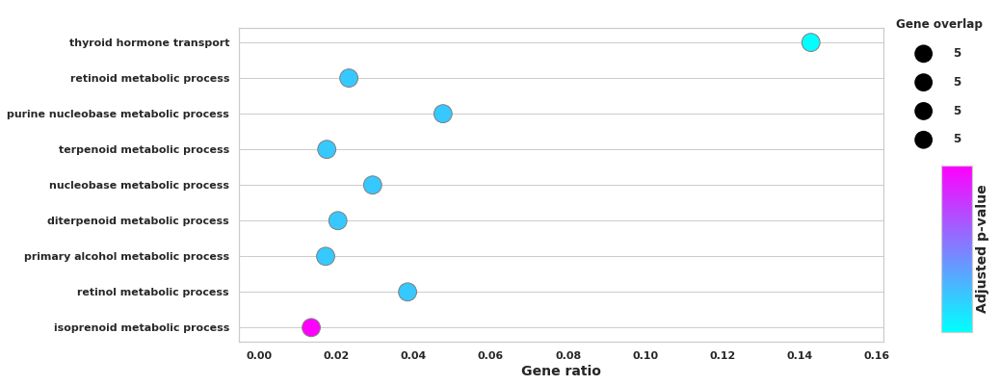

Cluster: 191216_ELS_Stress_vs_Ctrl_10
Cluster: 191216_BL_Stress_vs_Ctrl_Neurons_Glutamatergic


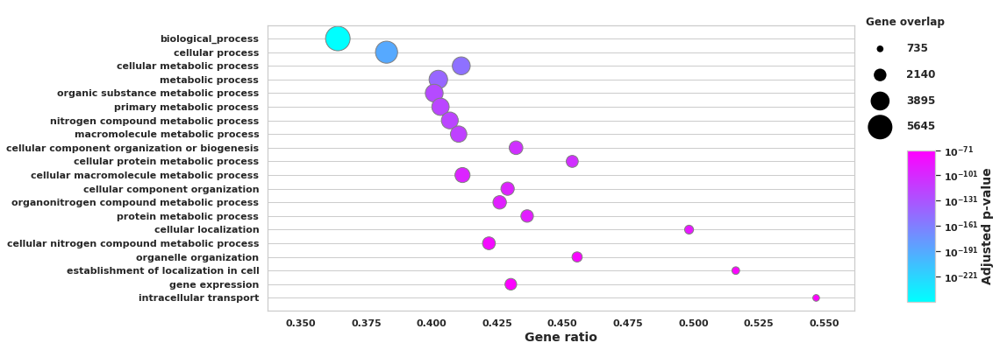

Cluster: 191216_Stress_ELS_vs_BL_4


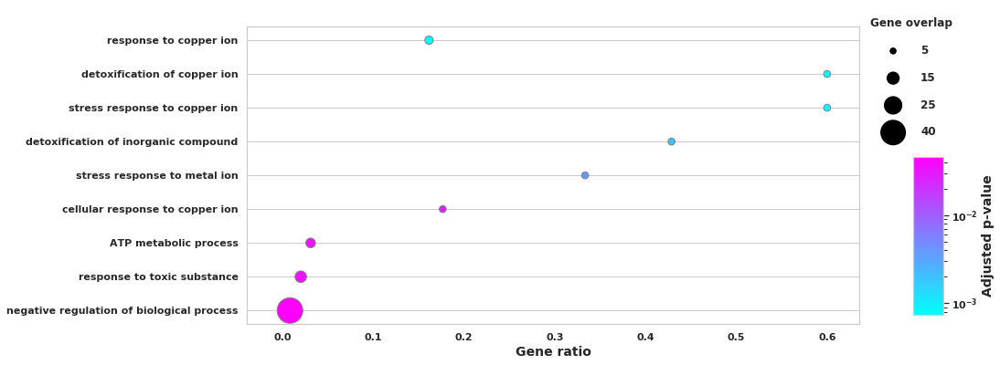

Cluster: 191216_rest_vs_10_neuron_glu


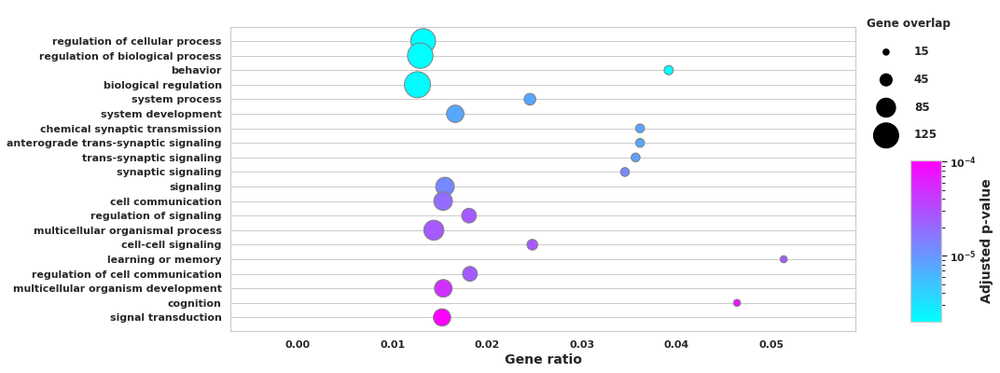

Cluster: 191216_ELS_Stress_vs_Ctrl_2


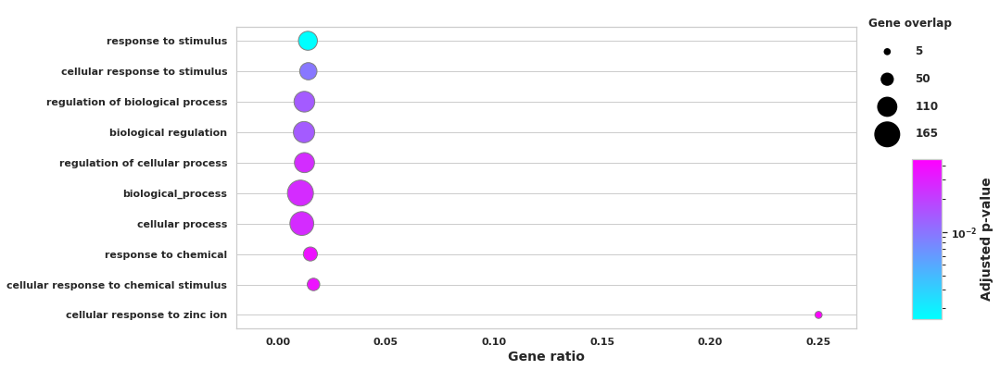

Cluster: 191216_ELS_Stress_vs_Ctrl_Endothelial Cells


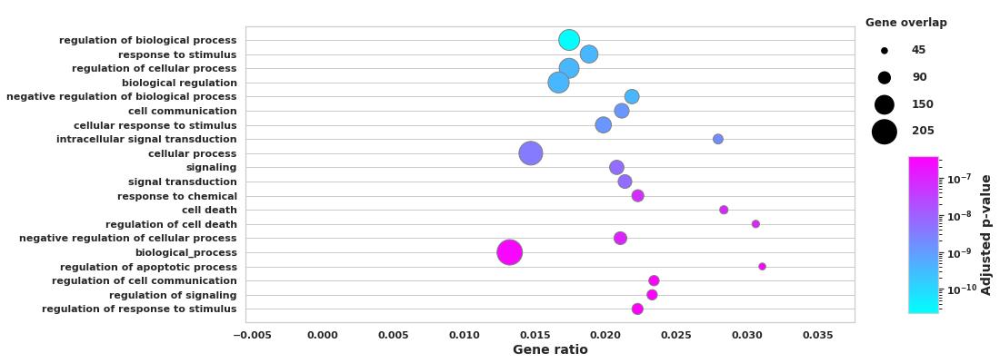

Cluster: 191216_BL_Stress_vs_Ctrl_Neurons_Cajal–Retzius


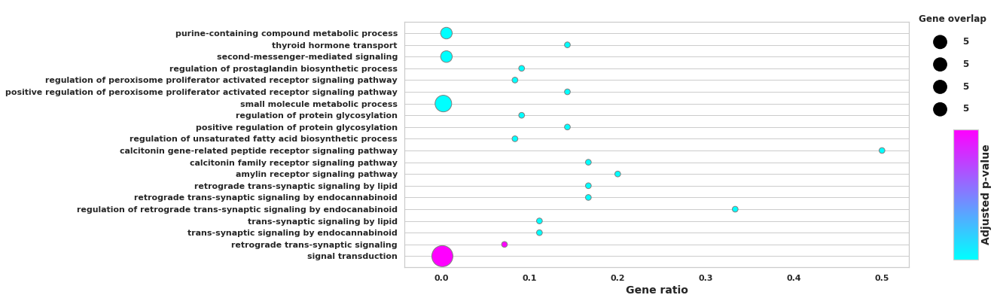

Cluster: 191216_Stress_ELS_vs_BL_Endothelial Cells


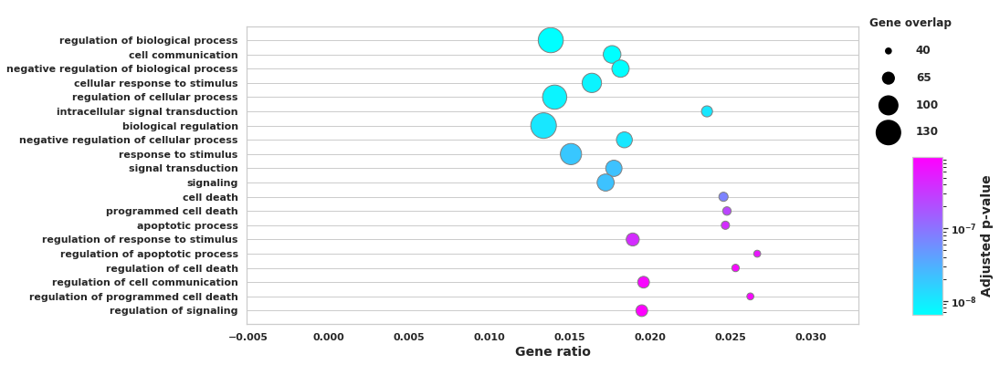

Cluster: 191216_ELS_Stress_vs_Ctrl_Meningeal Cells


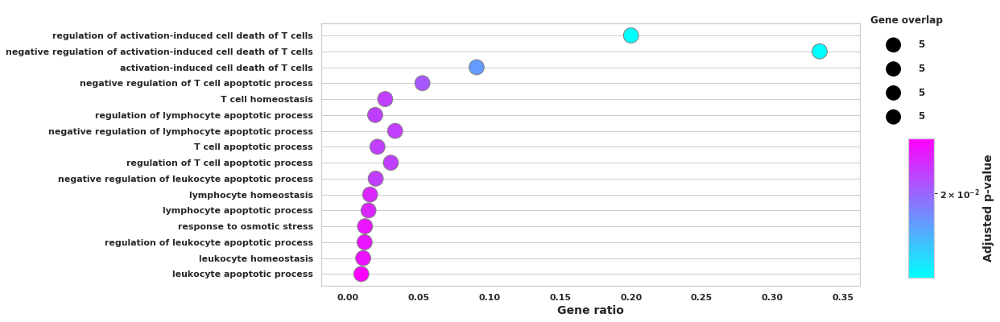

Cluster: 191216_rest_vs_19_neuron_glu


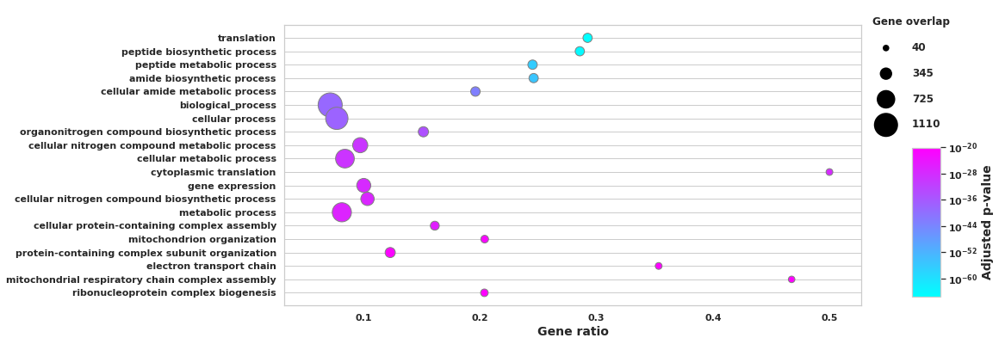

Cluster: 191216_BL_Stress_vs_Ctrl_4


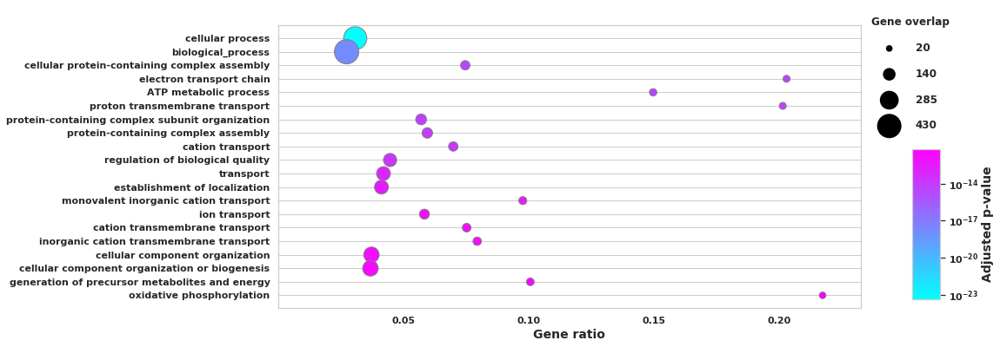

Cluster: 191216_rest_vs_6_neuron_glu


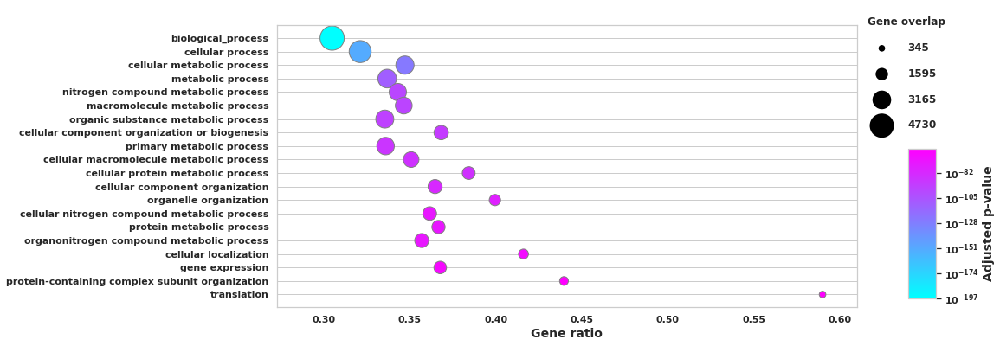

Cluster: 191216_Stress_ELS_vs_BL_Oligodendrocyte Progenitor Cells (OPCs)
Cluster: 191216_Ctrl_ELS_vs_BL_Neurons_Glutamatergic


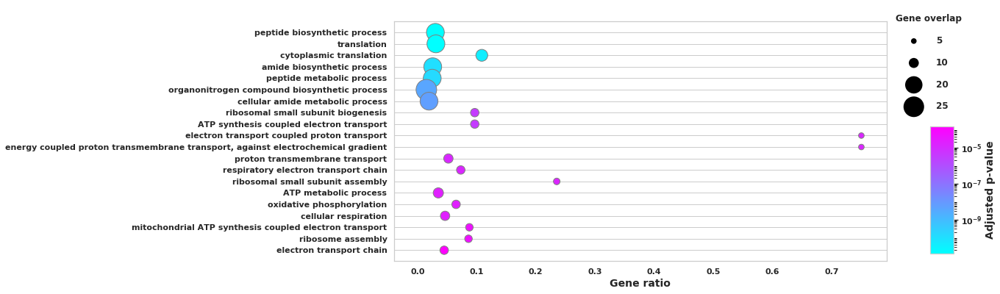

Cluster: 191216_rest_vs_12_neuron_glu


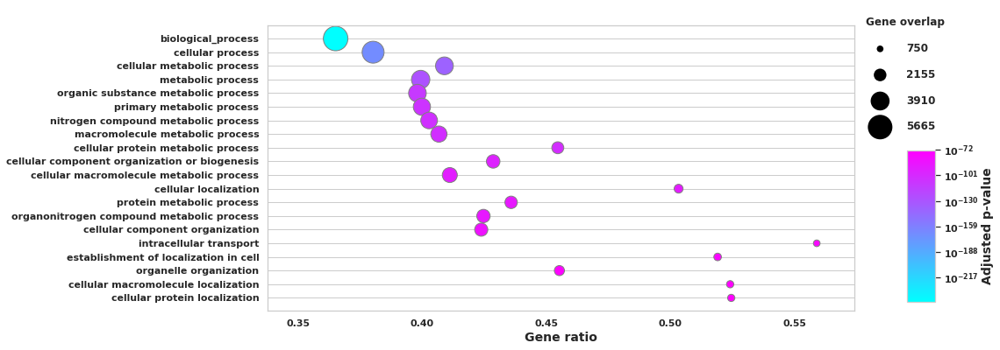

Cluster: 191216_ELS_Stress_vs_Ctrl_Neurons_Glutamatergic


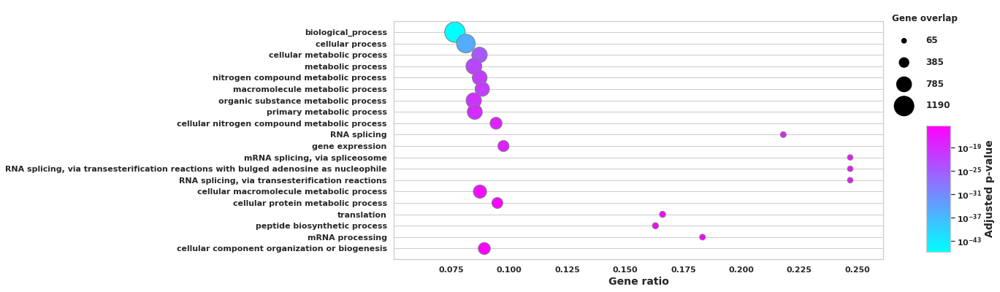

Cluster: 191216_Ctrl_ELS_vs_BL_13


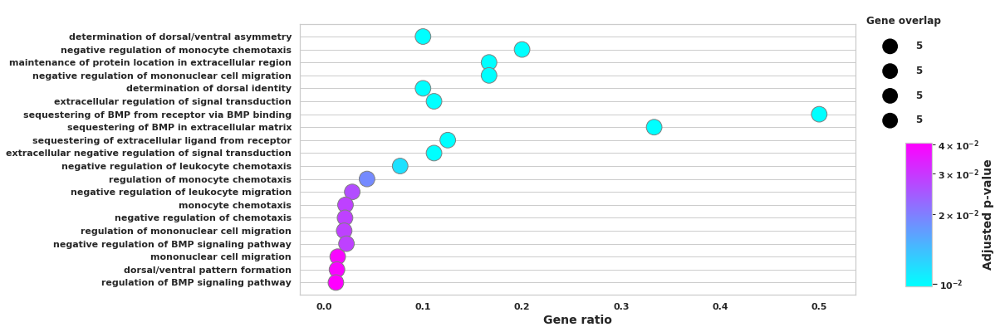

Cluster: 191216_ELS_Stress_vs_Ctrl_4


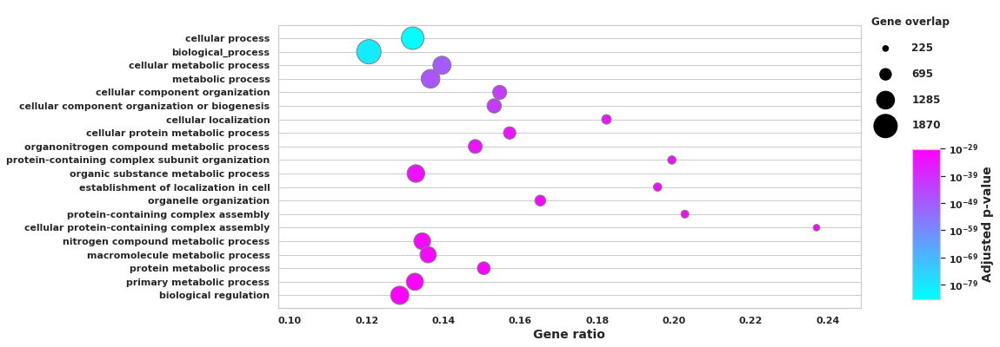

Cluster: 191216_Stress_ELS_vs_BL_10
Cluster: 191216_Ctrl_ELS_vs_BL_6
Cluster: 191216_Stress_ELS_vs_BL_2


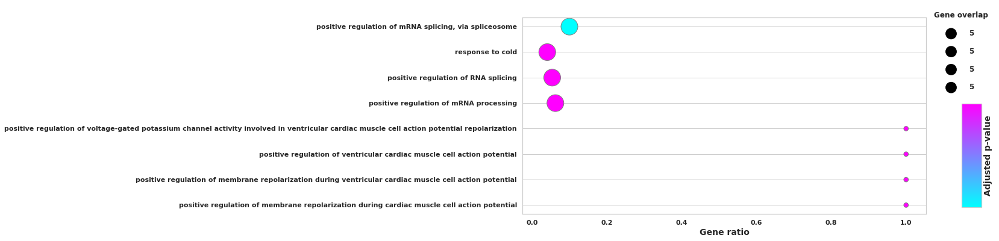

Cluster: 191216_BL_Stress_vs_Ctrl_Oligodendrocytes


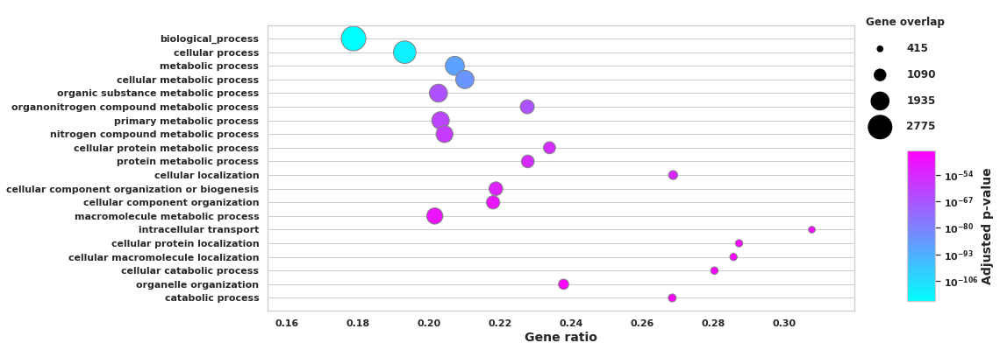

Cluster: 191216_ELS_Stress_vs_Ctrl_Oligodendrocyte Progenitor Cells (OPCs)
Cluster: 191216_ELS_Stress_vs_Ctrl_Pericytes


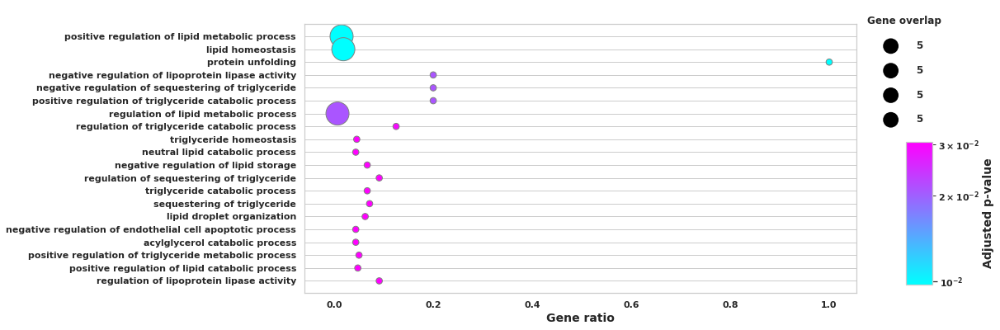

Cluster: 191216_rest_vs_4_neuron_glu


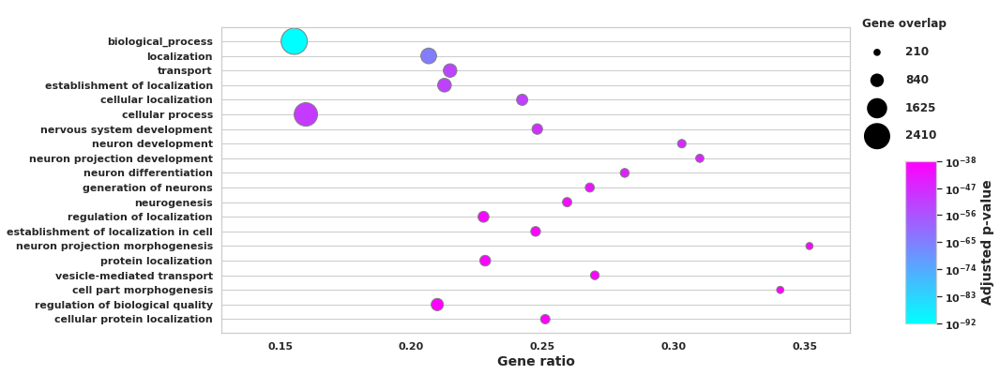

Cluster: 191216_BL_Stress_vs_Ctrl_2


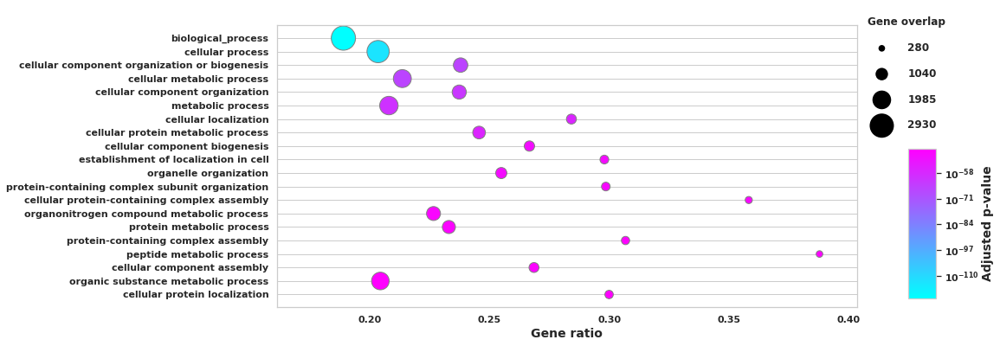

Cluster: 191216_Stress_ELS_vs_BL_Ependymal Cells


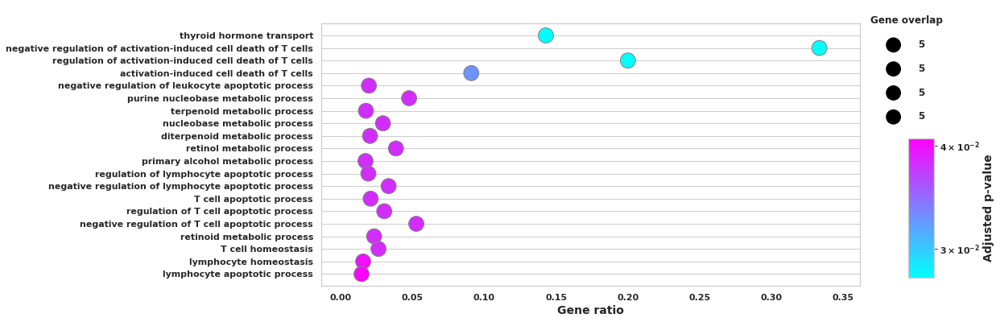

Cluster: 191216_Ctrl_ELS_vs_BL_Vascular Cells
Cluster: 191216_Stress_ELS_vs_BL_Neurons_Glutamatergic


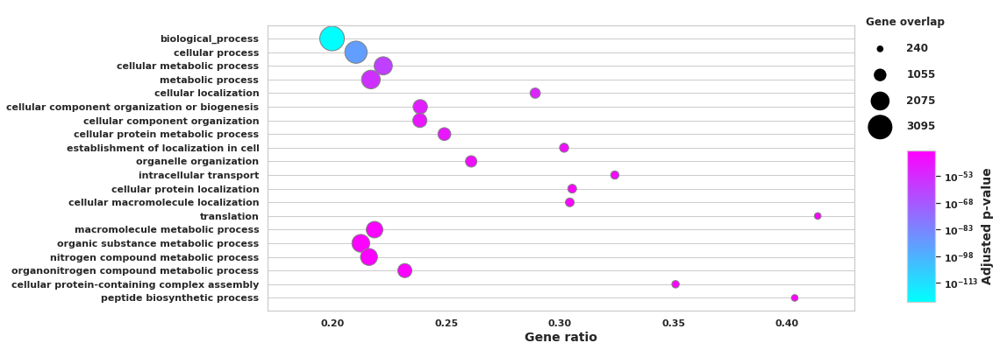

Cluster: 191216_BL_Stress_vs_Ctrl_Endothelial Cells


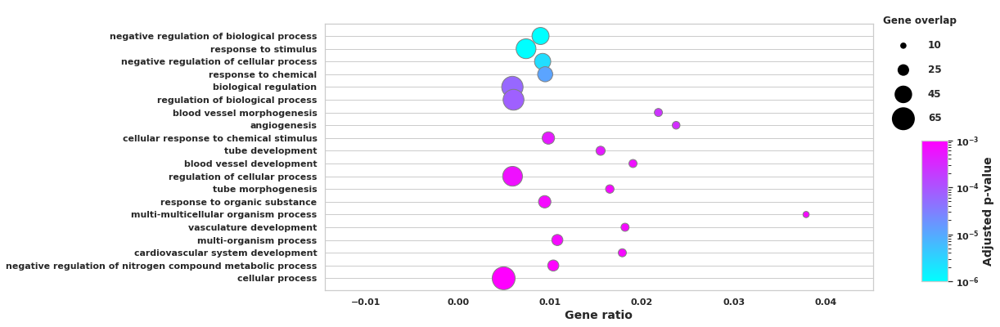

Cluster: 191216_ELS_Stress_vs_Ctrl_Choroid Plexus Epithelial Cells
Cluster: 191216_BL_Stress_vs_Ctrl_6
Cluster: 191216_rest_vs_2_neuron_glu


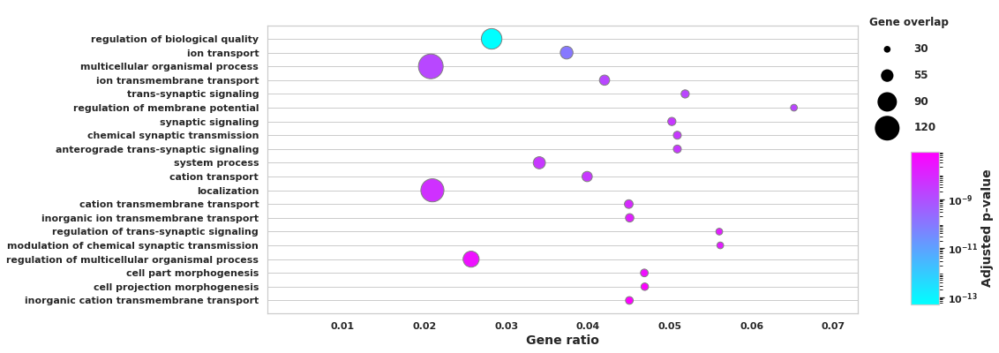

Cluster: 191216_ELS_Stress_vs_Ctrl_Oligodendrocytes


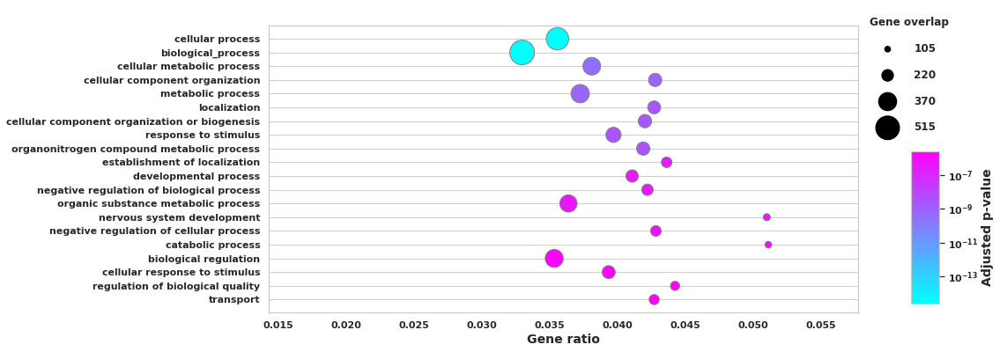

Cluster: 191216_ELS_Stress_vs_Ctrl_Astrocytes


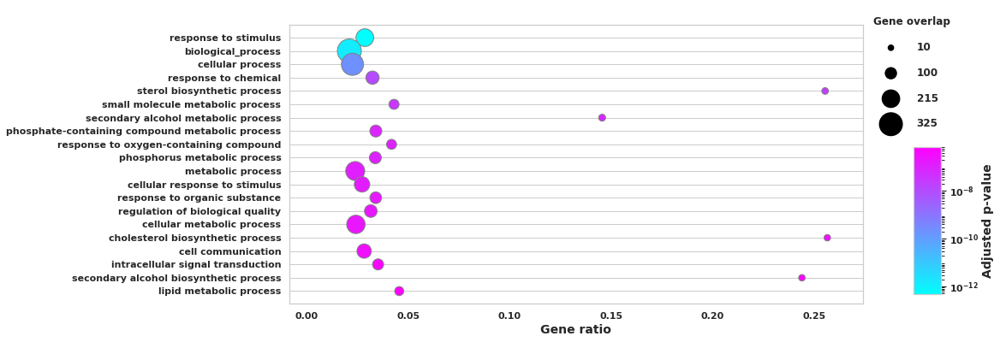

Cluster: 191216_BL_Stress_vs_Ctrl_Microglia


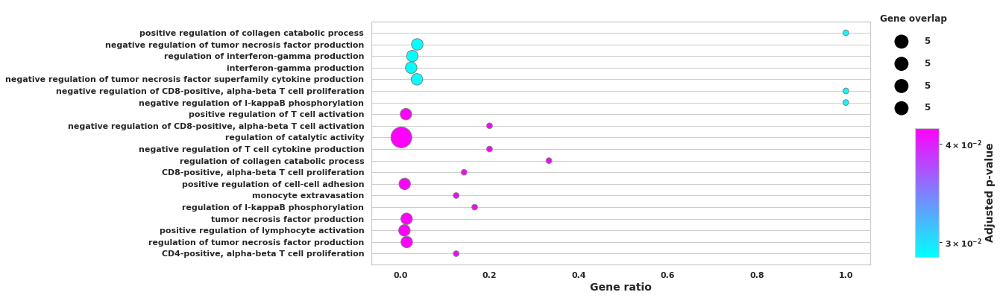

Cluster: 191216_rest_vs_13_neuron_glu


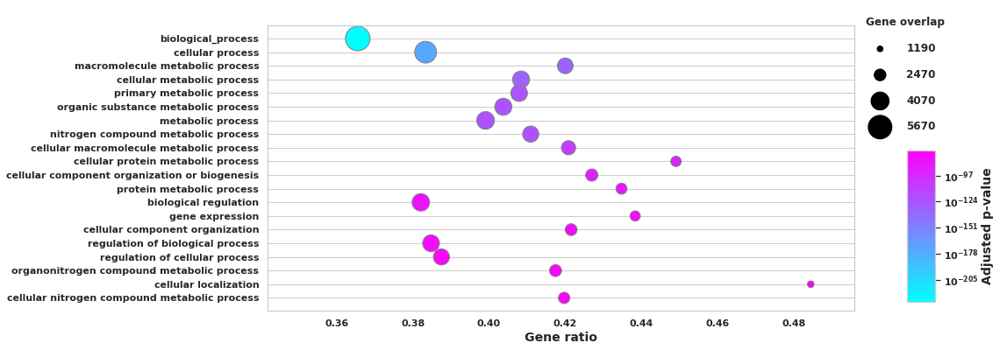

Cluster: 191216_Ctrl_ELS_vs_BL_Oligodendrocytes


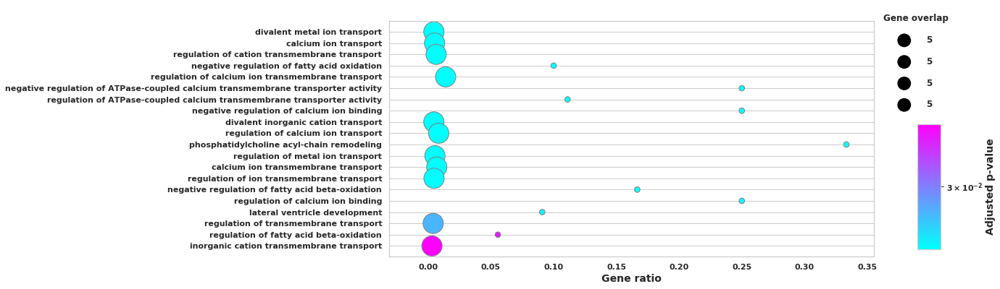

Cluster: 191216_Ctrl_ELS_vs_BL_19
Cluster: 191216_Stress_ELS_vs_BL_Microglia
Cluster: 191216_Ctrl_ELS_vs_BL_Meningeal Cells


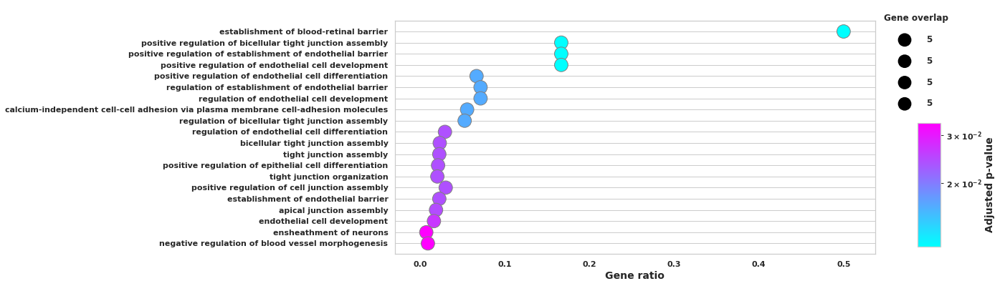

Cluster: 191216_Ctrl_ELS_vs_BL_10


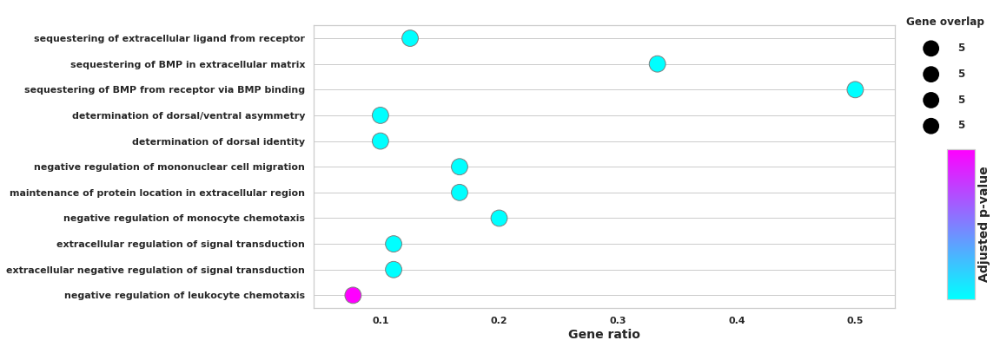

Cluster: 191216_Ctrl_ELS_vs_BL_2


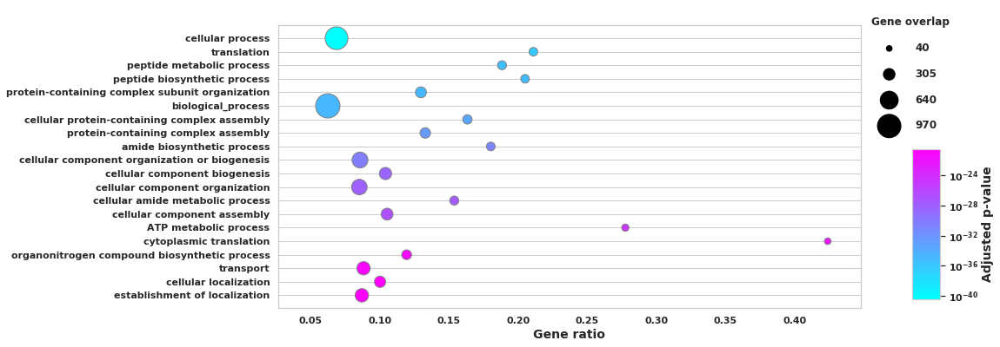

Cluster: 191216_Stress_ELS_vs_BL_Oligodendrocytes


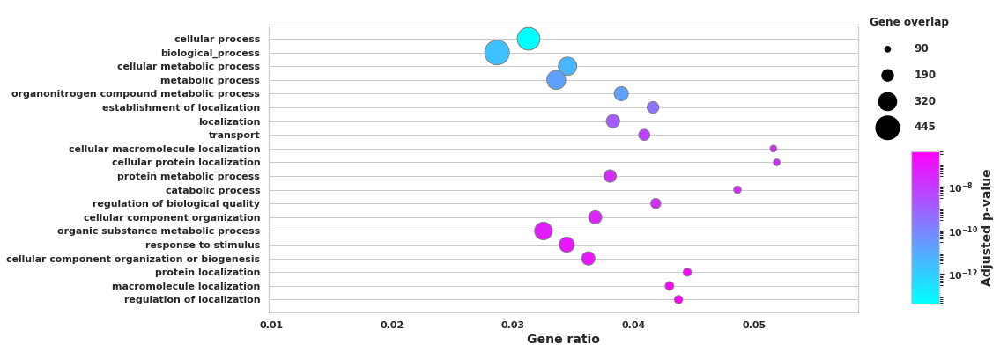

Cluster: 191216_Stress_ELS_vs_BL_6
Cluster: 191216_Stress_ELS_vs_BL_Astrocytes


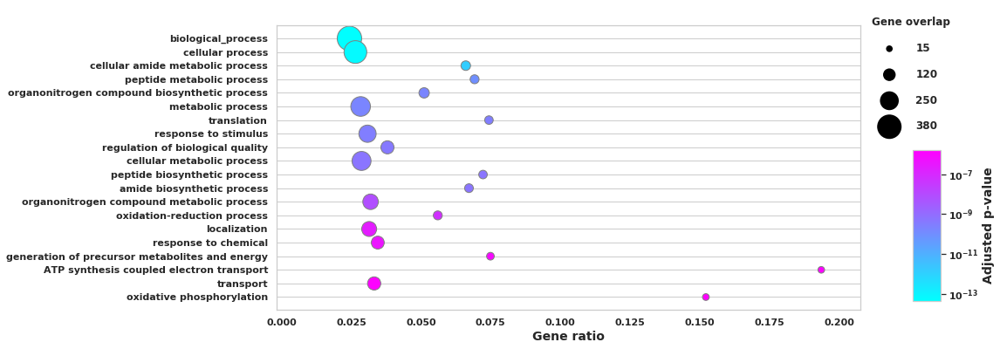

Cluster: 191216_Ctrl_ELS_vs_BL_Endothelial Cells


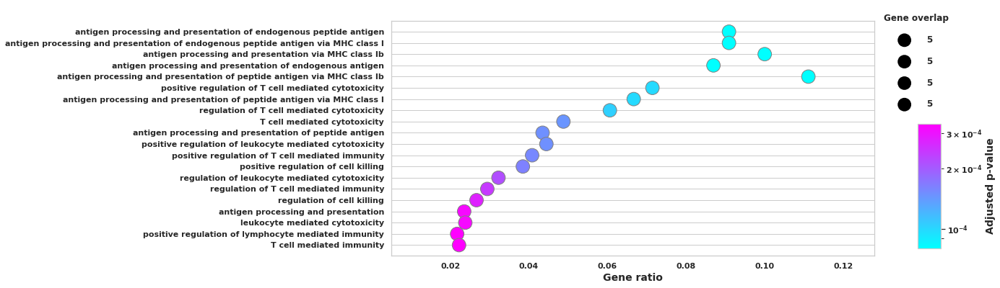

Cluster: 191216_rest_vs_28_neuron_glu


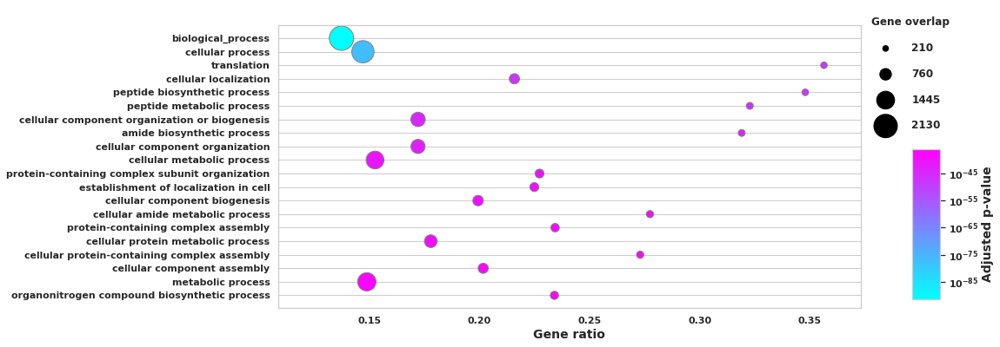

Cluster: 191216_ELS_Stress_vs_Ctrl_12


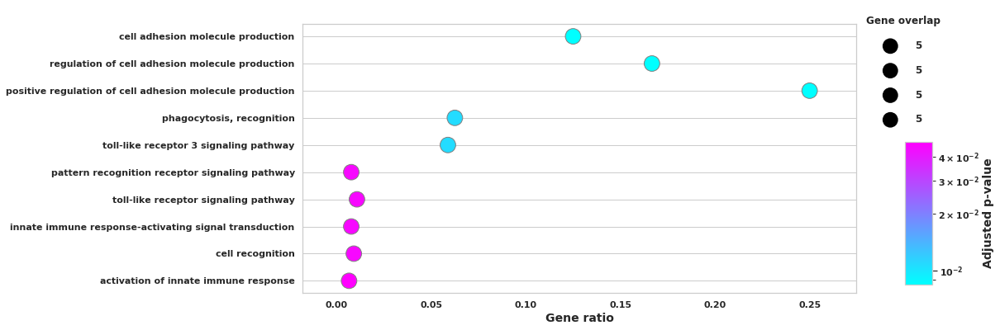

Cluster: 191216_ELS_Stress_vs_Ctrl_Macrophages


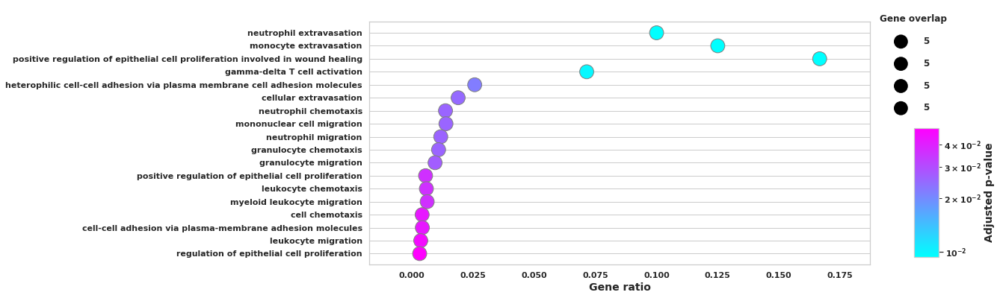

Cluster: 191216_ELS_Stress_vs_Ctrl_Microglia


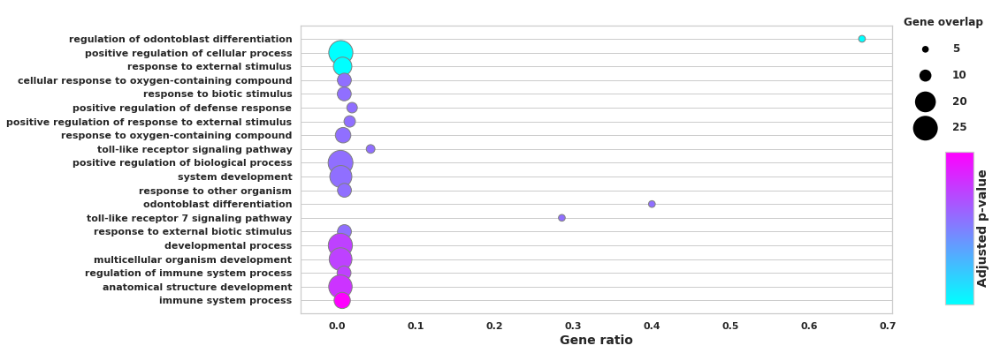

Cluster: 191216_BL_Stress_vs_Ctrl_Neurons_Cck


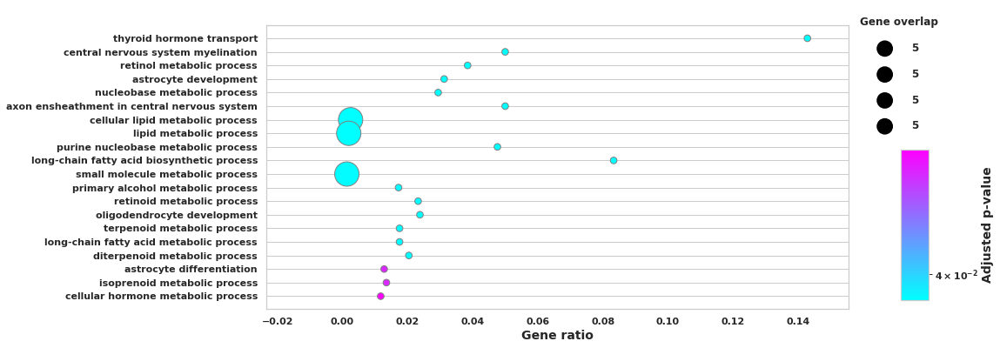

Cluster: 191216_BL_Stress_vs_Ctrl_Oligodendrocyte Progenitor Cells (OPCs)


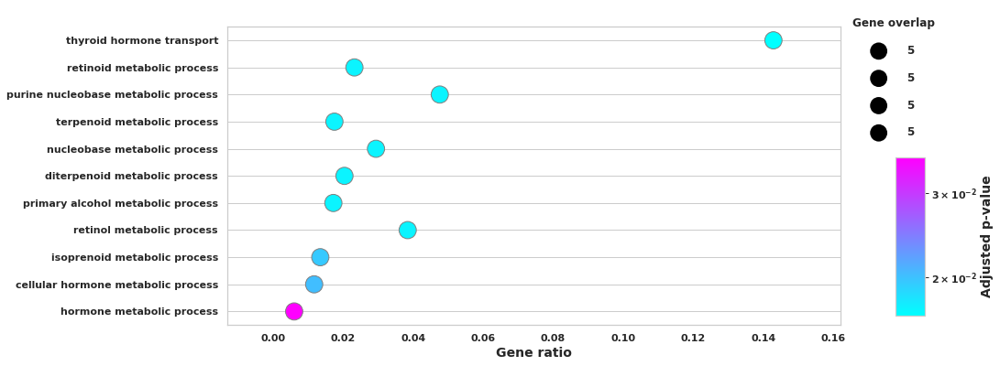

Cluster: 191216_BL_Stress_vs_Ctrl_Astrocytes


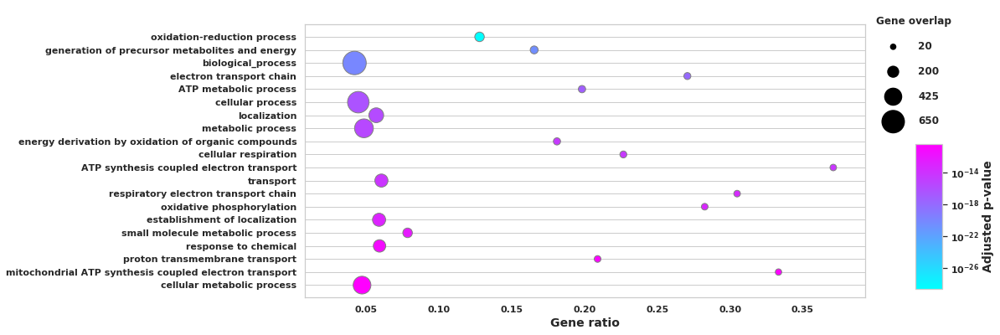

Cluster: 191216_BL_Stress_vs_Ctrl_Choroid Plexus Epithelial Cells


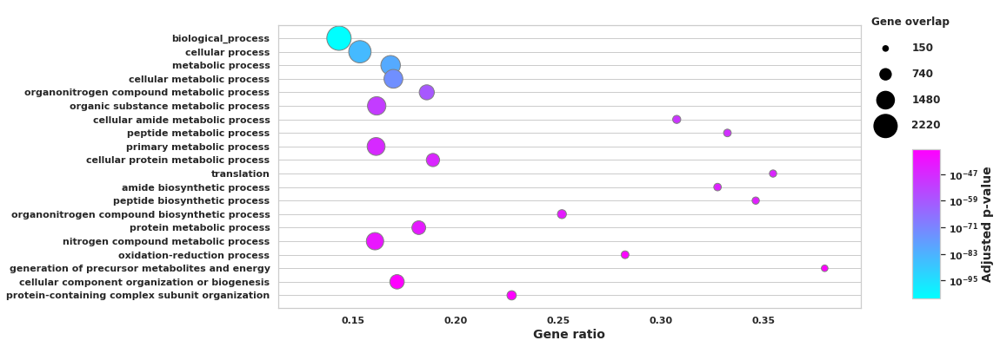

Cluster: 191216_Ctrl_ELS_vs_BL_Astrocytes
Cluster: 191216_BL_Stress_vs_Ctrl_19
Cluster: 191216_Ctrl_ELS_vs_BL_4
Cluster: 191216_BL_Stress_vs_Ctrl_10


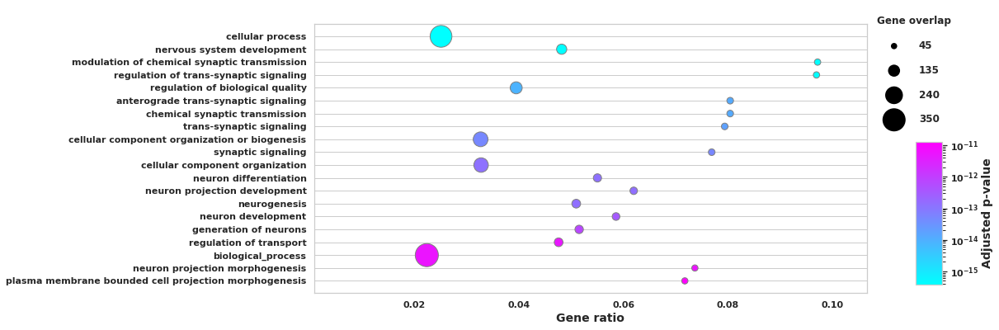

Cluster: 191216_ELS_Stress_vs_Ctrl_Ependymal Cells


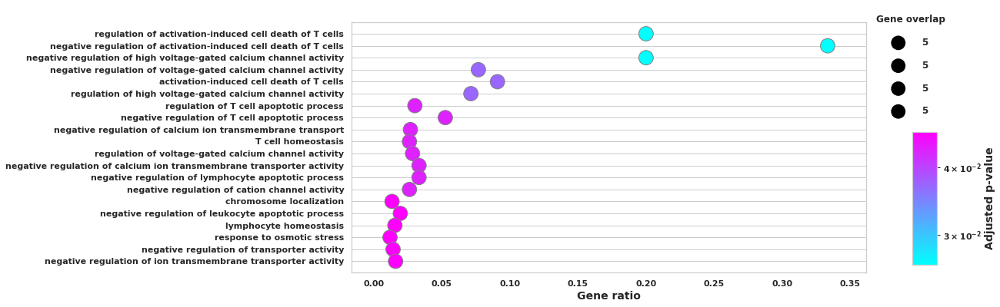

Cluster: 191216_Stress_ELS_vs_BL_Neural Progenitor Cells (NPCs)


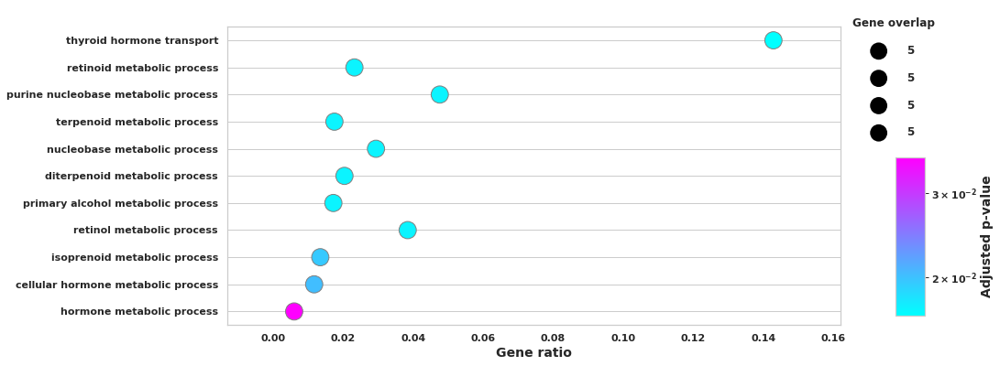

Cluster: 191216_ELS_Stress_vs_Ctrl_6


In [172]:
for clust in de_gobp_enrich:
    # Plot the results
    print(f'Cluster: {clust}')
    if len(de_gobp_enrich[clust].values) > 0:
        plot_enrich(de_gobp_enrich[clust])

In [173]:
de_gobp_enrich = dict()

for clust in test_results.keys(): 
    if sum(de_signif[clust]['logFC']<0)>0:
        tmp = gp.profile(organism='mmusculus', sources=['GO:BP'], user_threshold=0.05,
                     significance_threshold_method='fdr', 
                     background=adata.var_names.tolist(),
                     query=de_signif[clust][de_signif[clust]['logFC']<0].index.values.tolist())
    
        if tmp is not None:
            tmp.set_index('native', inplace=True)
            de_gobp_enrich[clust] = tmp.sort_values('p_value').iloc[:,[2,5,7,10,1]]
        else:
            de_gobp_enrich[clust] = pd.DataFrame()
    
        # Print some results
        print(f'Cluster {clust}:')
        de_gobp_enrich[clust].iloc[:50,:]

Cluster 191216_ELS_Stress_vs_Ctrl_10:
Cluster 191216_ELS_Stress_vs_Ctrl_19:
Cluster 191216_BL_Stress_vs_Ctrl_Neurons_Glutamatergic:
Cluster 191216_Stress_ELS_vs_BL_4:
Cluster 191216_rest_vs_10_neuron_glu:
Cluster 191216_ELS_Stress_vs_Ctrl_2:
Cluster 191216_ELS_Stress_vs_Ctrl_Endothelial Cells:
Cluster 191216_Ctrl_ELS_vs_BL_12:
Cluster 191216_Stress_ELS_vs_BL_Choroid Plexus Epithelial Cells:
Cluster 191216_Stress_ELS_vs_BL_Endothelial Cells:
Cluster 191216_rest_vs_19_neuron_glu:
Cluster 191216_BL_Stress_vs_Ctrl_4:
Cluster 191216_rest_vs_6_neuron_glu:
Cluster 191216_Ctrl_ELS_vs_BL_Neurons_Glutamatergic:
Cluster 191216_rest_vs_12_neuron_glu:
Cluster 191216_ELS_Stress_vs_Ctrl_Neurons_Glutamatergic:
Cluster 191216_ELS_Stress_vs_Ctrl_4:
Cluster 191216_Stress_ELS_vs_BL_10:
Cluster 191216_Ctrl_ELS_vs_BL_6:
Cluster 191216_Stress_ELS_vs_BL_2:
Cluster 191216_BL_Stress_vs_Ctrl_Oligodendrocytes:
Cluster 191216_rest_vs_4_neuron_glu:
Cluster 191216_BL_Stress_vs_Ctrl_2:
Cluster 191216_BL_Stress_vs_Ctr

Cluster: 191216_ELS_Stress_vs_Ctrl_10


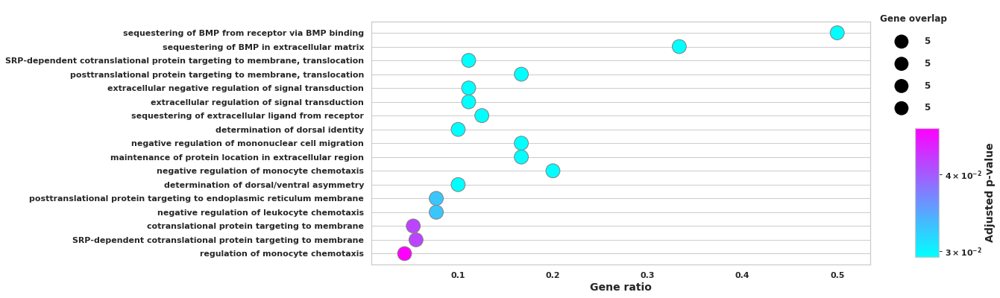

Cluster: 191216_ELS_Stress_vs_Ctrl_19


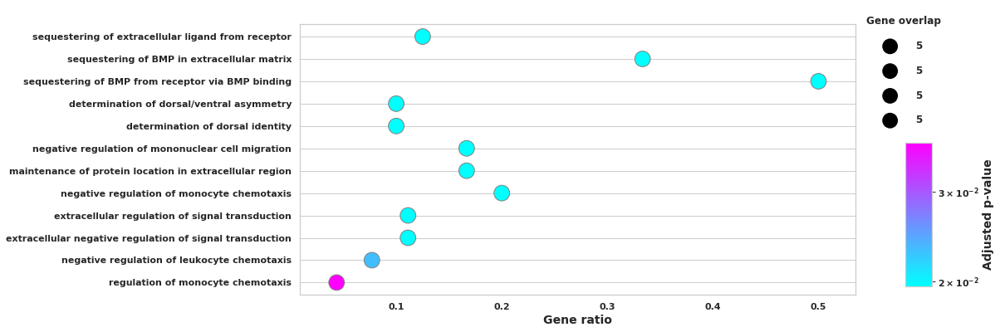

Cluster: 191216_BL_Stress_vs_Ctrl_Neurons_Glutamatergic


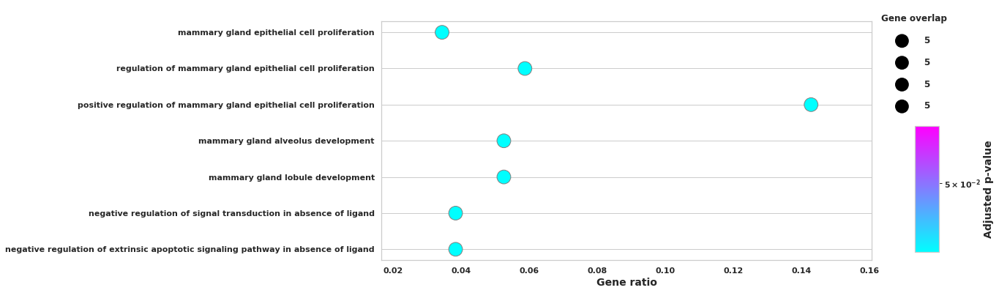

Cluster: 191216_Stress_ELS_vs_BL_4


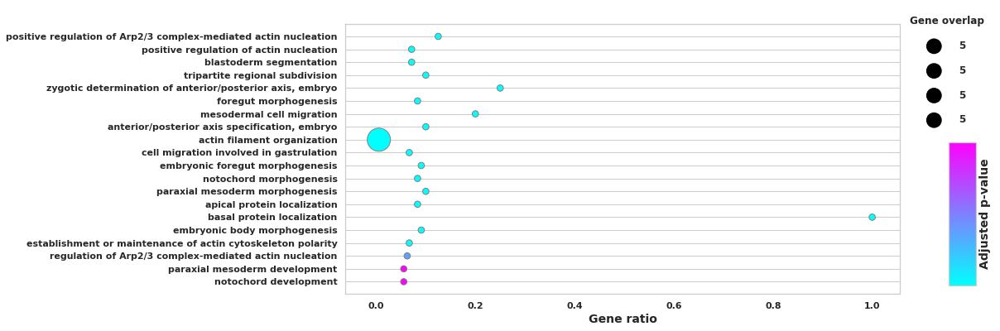

Cluster: 191216_rest_vs_10_neuron_glu


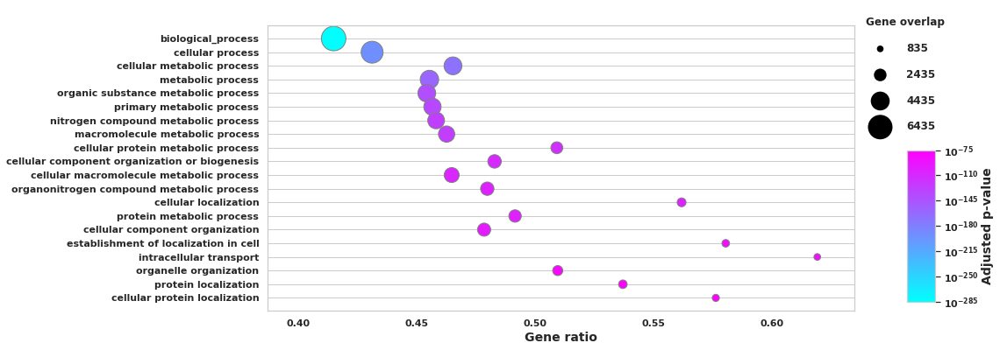

Cluster: 191216_ELS_Stress_vs_Ctrl_2


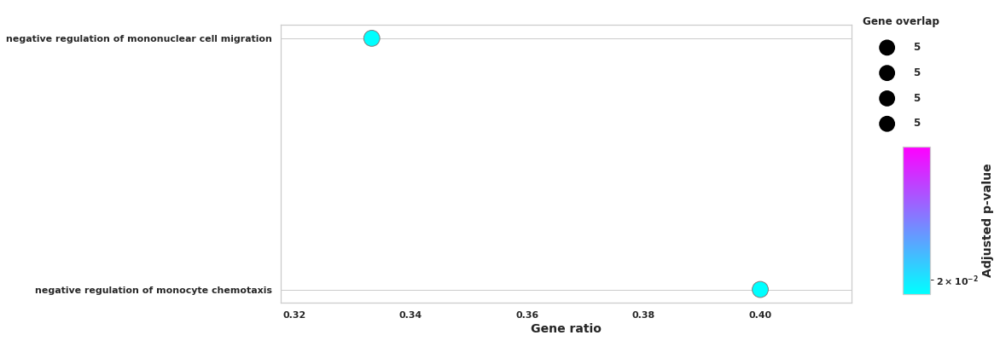

Cluster: 191216_ELS_Stress_vs_Ctrl_Endothelial Cells


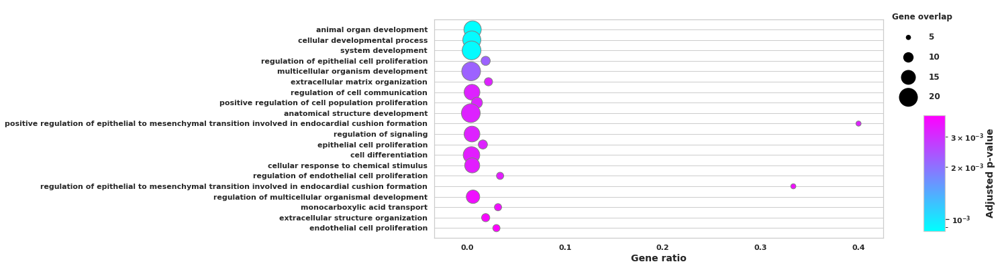

Cluster: 191216_Ctrl_ELS_vs_BL_12


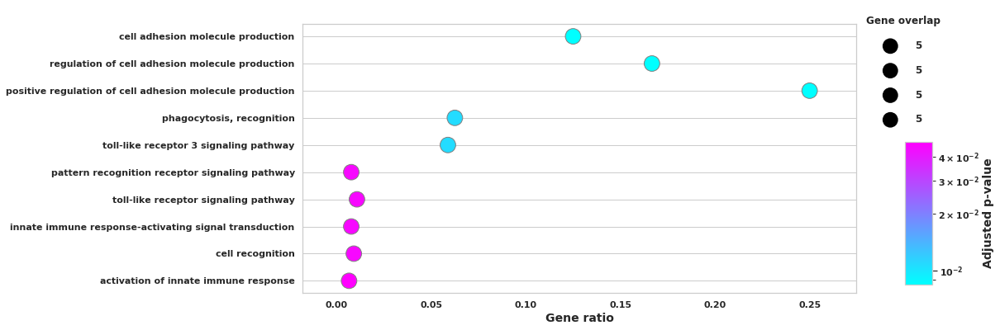

Cluster: 191216_Stress_ELS_vs_BL_Choroid Plexus Epithelial Cells
Cluster: 191216_Stress_ELS_vs_BL_Endothelial Cells


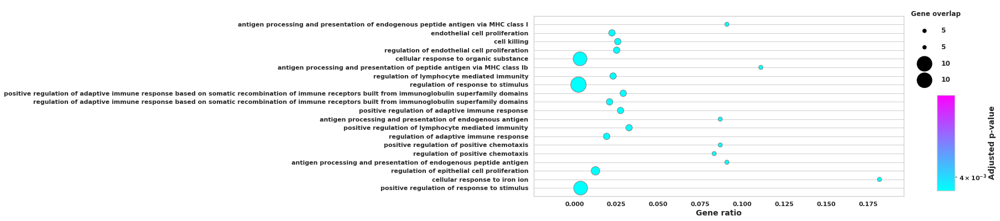

Cluster: 191216_rest_vs_19_neuron_glu


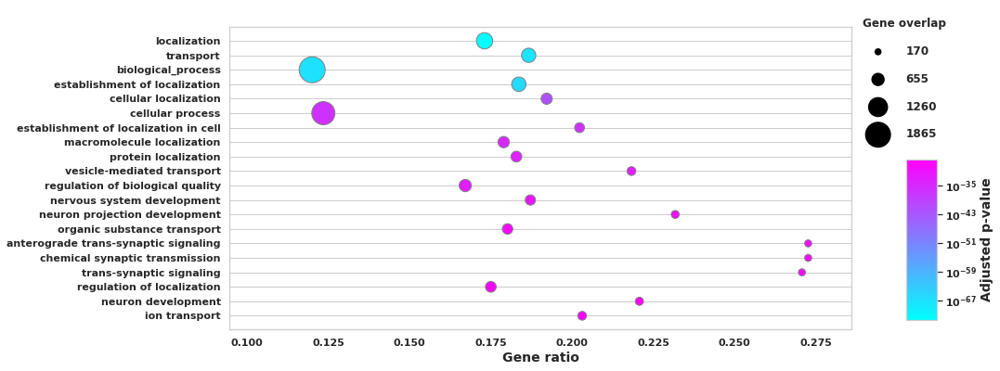

Cluster: 191216_BL_Stress_vs_Ctrl_4
Cluster: 191216_rest_vs_6_neuron_glu


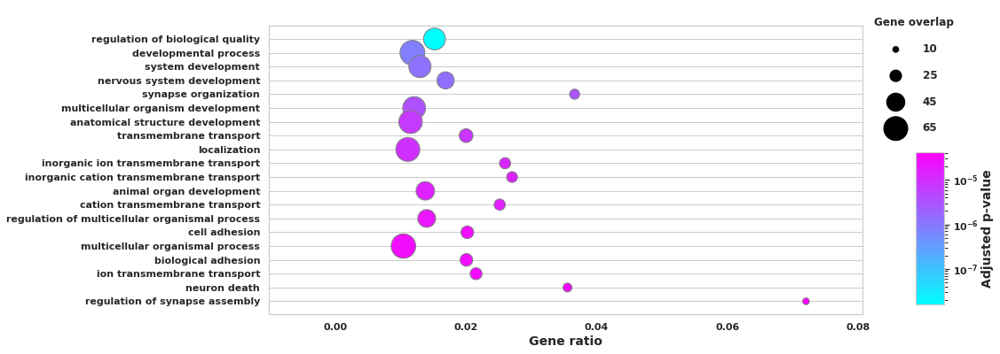

Cluster: 191216_Ctrl_ELS_vs_BL_Neurons_Glutamatergic


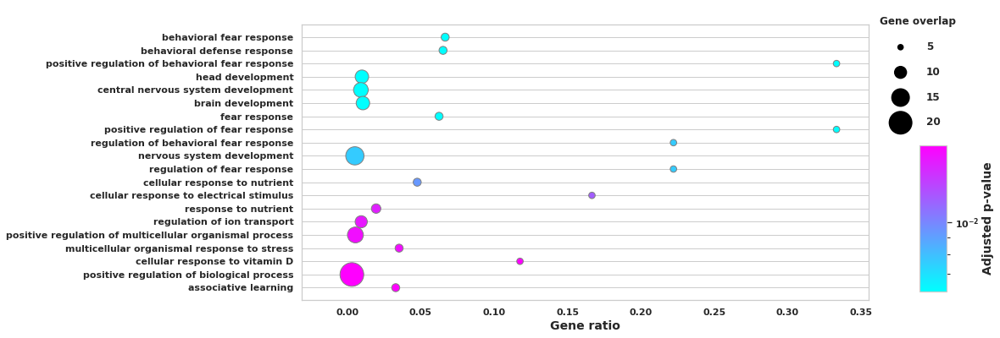

Cluster: 191216_rest_vs_12_neuron_glu


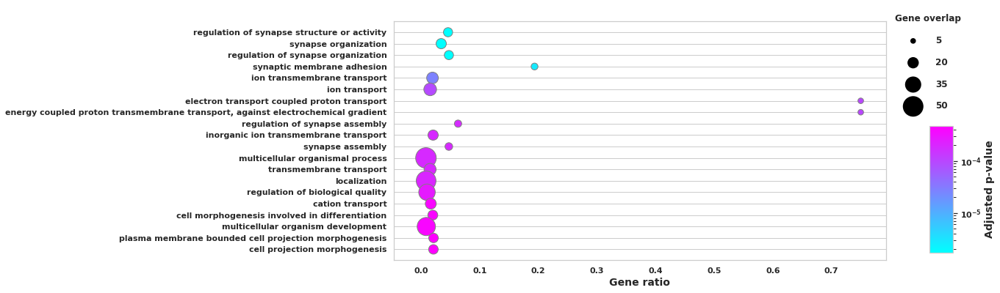

Cluster: 191216_ELS_Stress_vs_Ctrl_Neurons_Glutamatergic


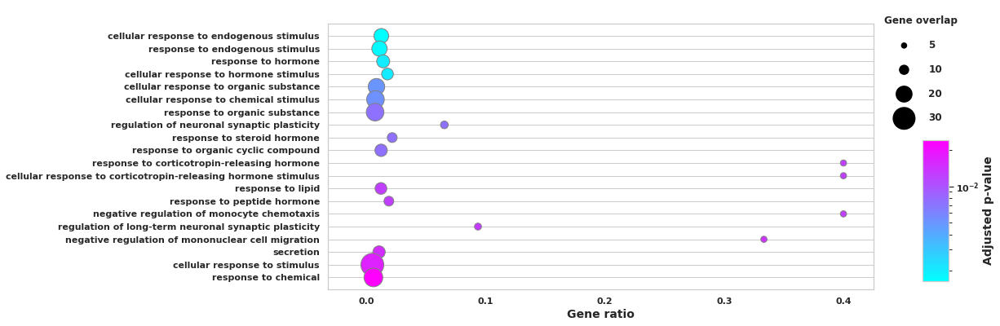

Cluster: 191216_ELS_Stress_vs_Ctrl_4


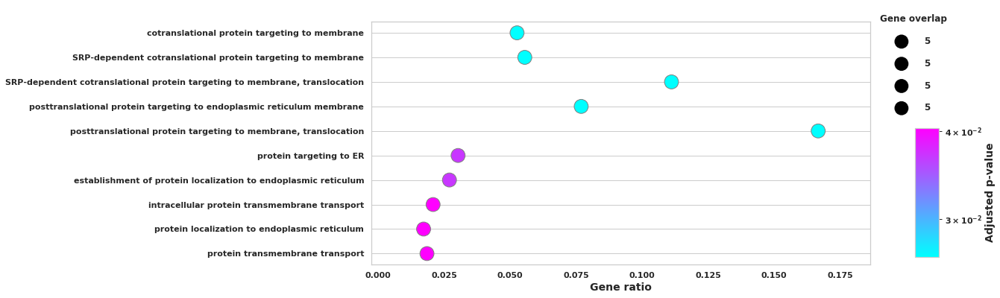

Cluster: 191216_Stress_ELS_vs_BL_10


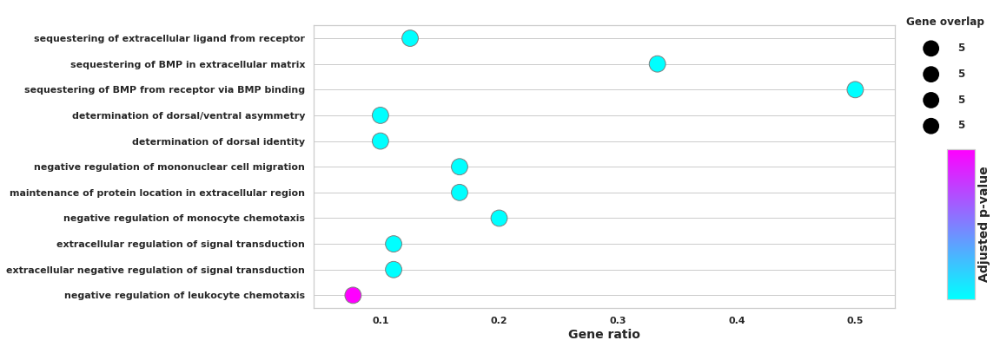

Cluster: 191216_Ctrl_ELS_vs_BL_6


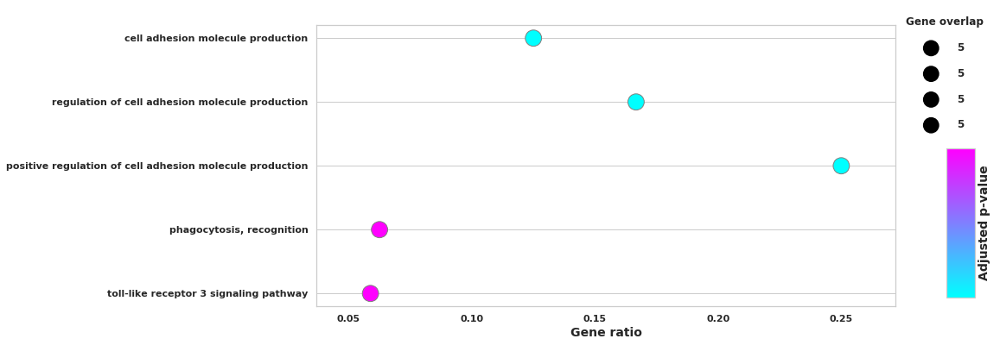

Cluster: 191216_Stress_ELS_vs_BL_2


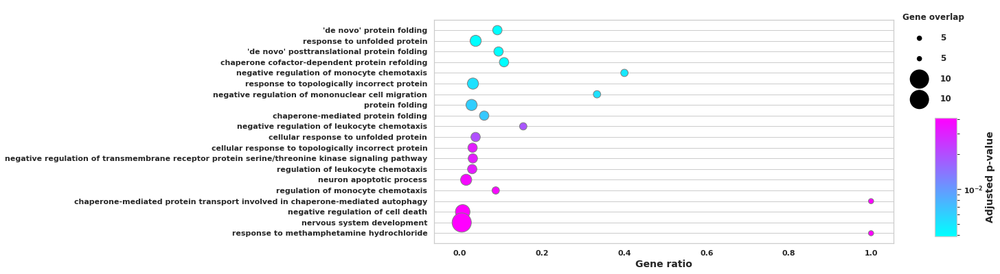

Cluster: 191216_BL_Stress_vs_Ctrl_Oligodendrocytes
Cluster: 191216_rest_vs_4_neuron_glu


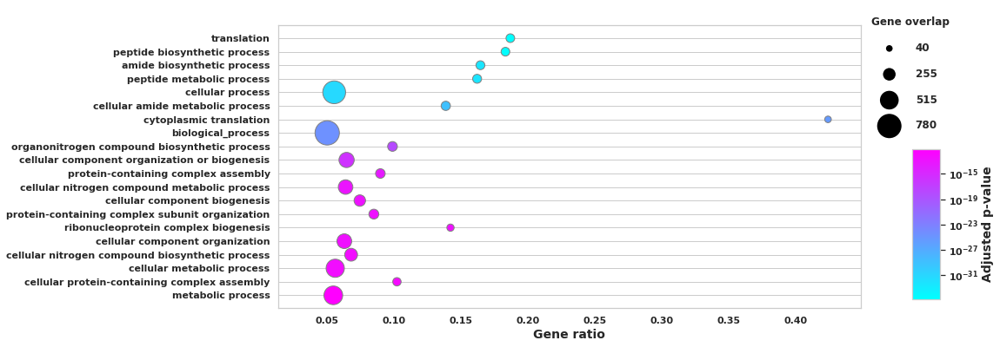

Cluster: 191216_BL_Stress_vs_Ctrl_2
Cluster: 191216_BL_Stress_vs_Ctrl_Meningeal Cells


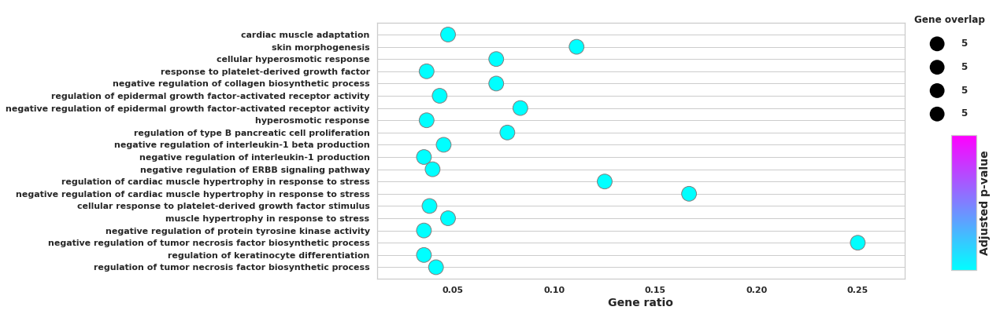

Cluster: 191216_Stress_ELS_vs_BL_Neurons_Glutamatergic
Cluster: 191216_BL_Stress_vs_Ctrl_Endothelial Cells


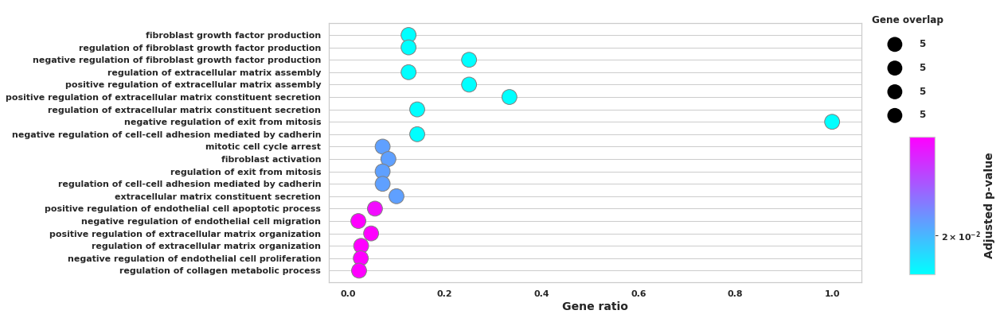

Cluster: 191216_rest_vs_2_neuron_glu


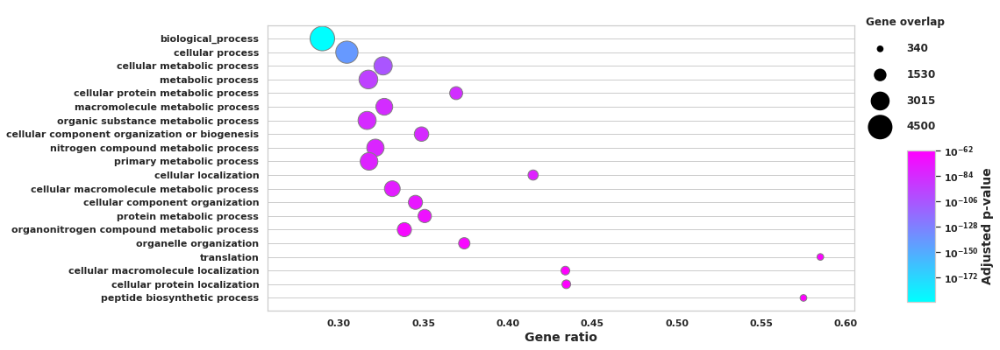

Cluster: 191216_Ctrl_ELS_vs_BL_Choroid Plexus Epithelial Cells


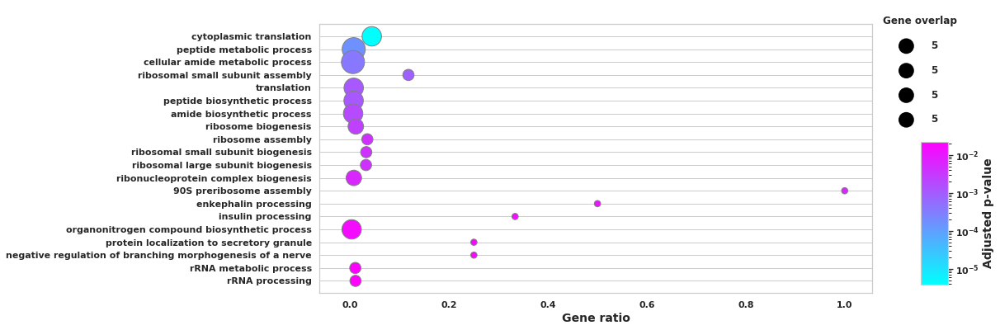

Cluster: 191216_ELS_Stress_vs_Ctrl_Oligodendrocytes
Cluster: 191216_ELS_Stress_vs_Ctrl_Astrocytes
Cluster: 191216_BL_Stress_vs_Ctrl_Microglia


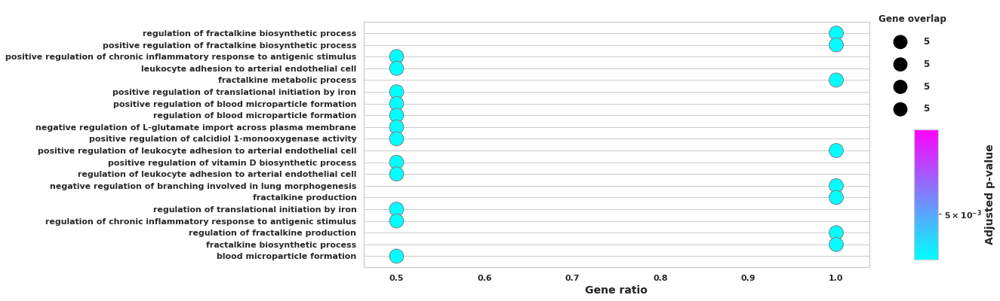

Cluster: 191216_rest_vs_13_neuron_glu


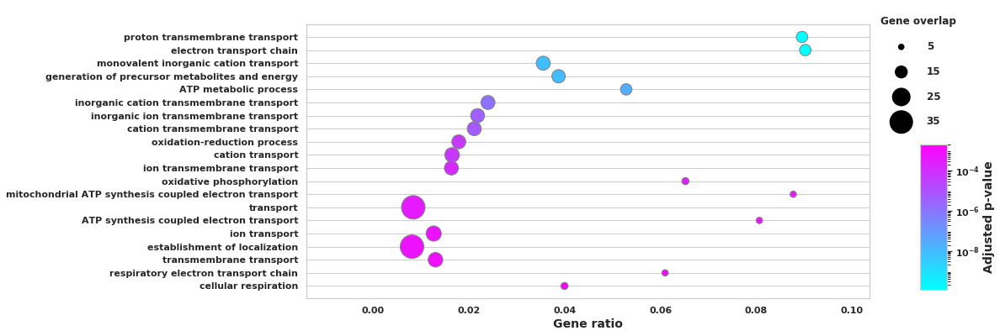

Cluster: 191216_Ctrl_ELS_vs_BL_Oligodendrocytes
Cluster: 191216_Stress_ELS_vs_BL_Microglia


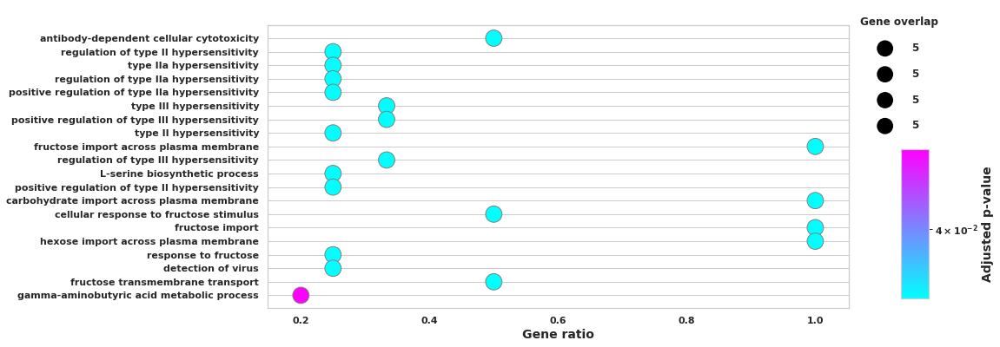

Cluster: 191216_Ctrl_ELS_vs_BL_10


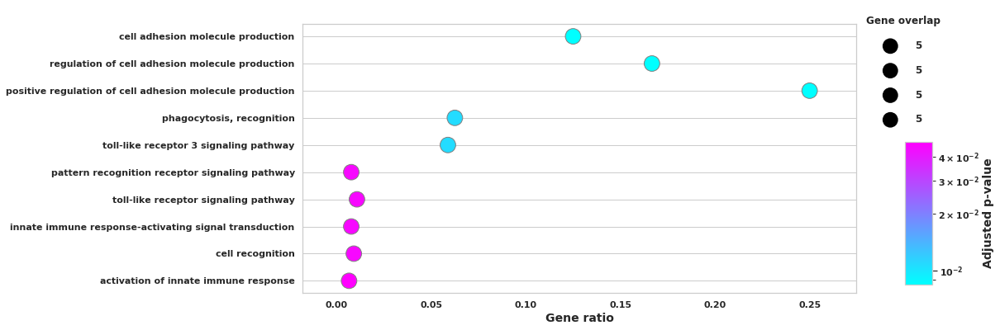

Cluster: 191216_Ctrl_ELS_vs_BL_2


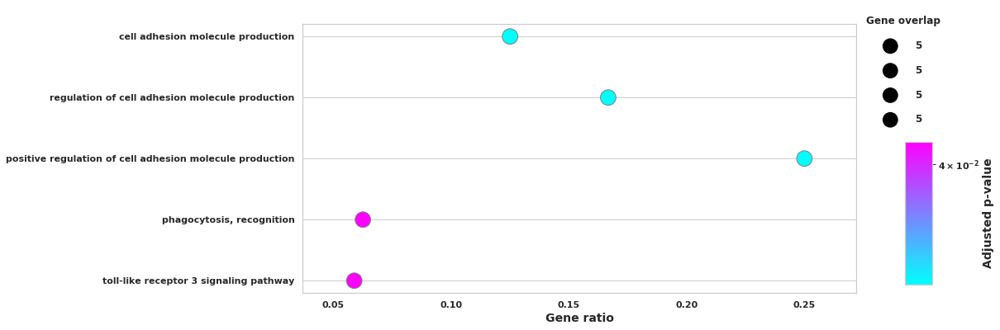

Cluster: 191216_Stress_ELS_vs_BL_Oligodendrocytes


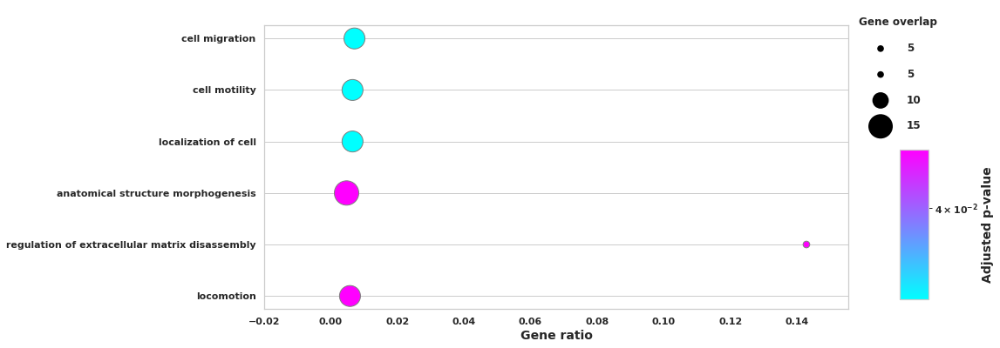

Cluster: 191216_Stress_ELS_vs_BL_6
Cluster: 191216_Stress_ELS_vs_BL_Astrocytes


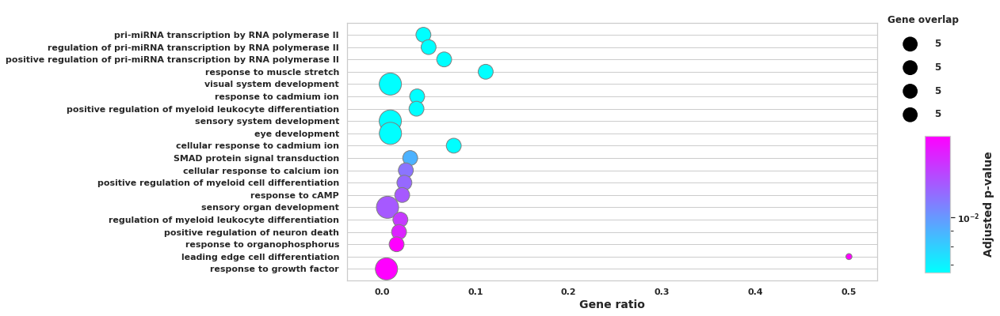

Cluster: 191216_Ctrl_ELS_vs_BL_Endothelial Cells


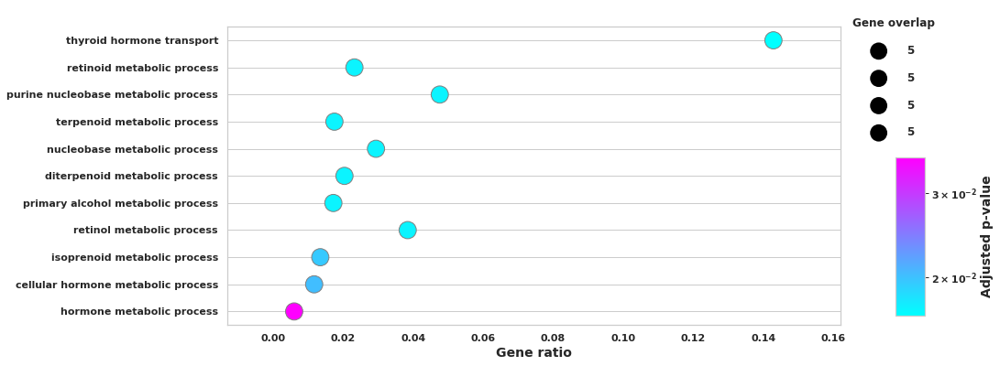

Cluster: 191216_rest_vs_28_neuron_glu
Cluster: 191216_ELS_Stress_vs_Ctrl_12
Cluster: 191216_ELS_Stress_vs_Ctrl_Microglia
Cluster: 191216_BL_Stress_vs_Ctrl_Choroid Plexus Epithelial Cells


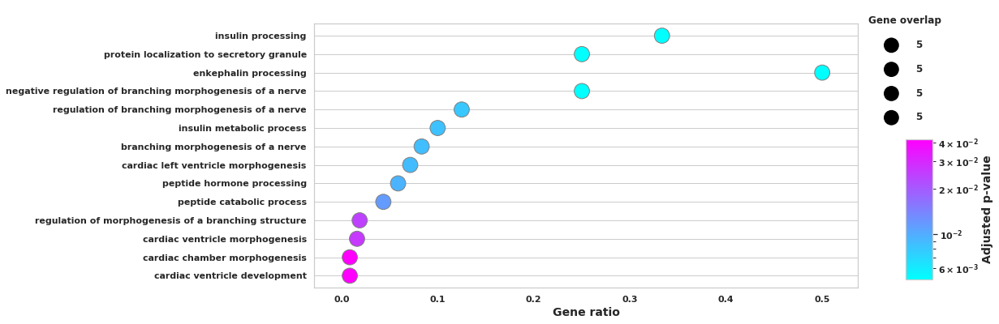

Cluster: 191216_Ctrl_ELS_vs_BL_Astrocytes


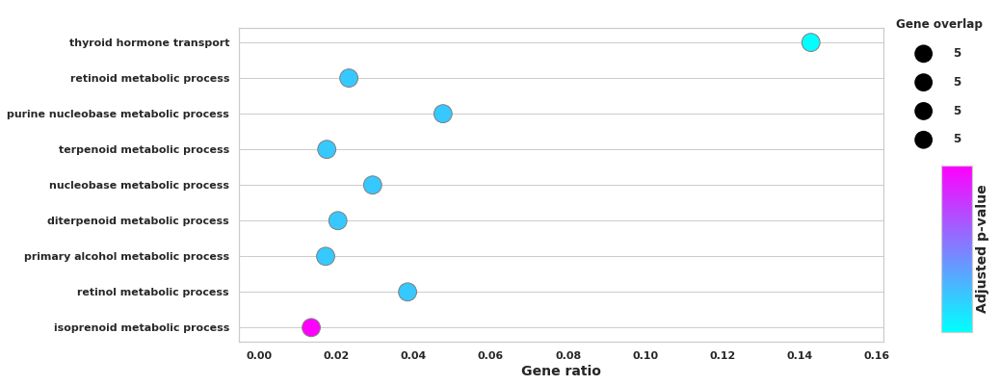

Cluster: 191216_ELS_Stress_vs_Ctrl_13


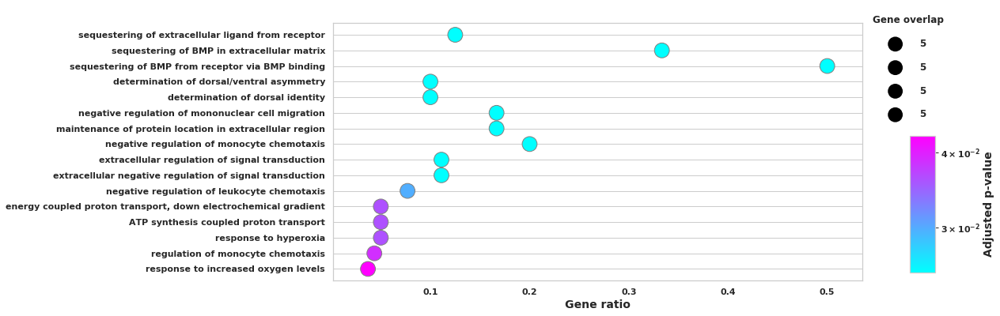

Cluster: 191216_Ctrl_ELS_vs_BL_4


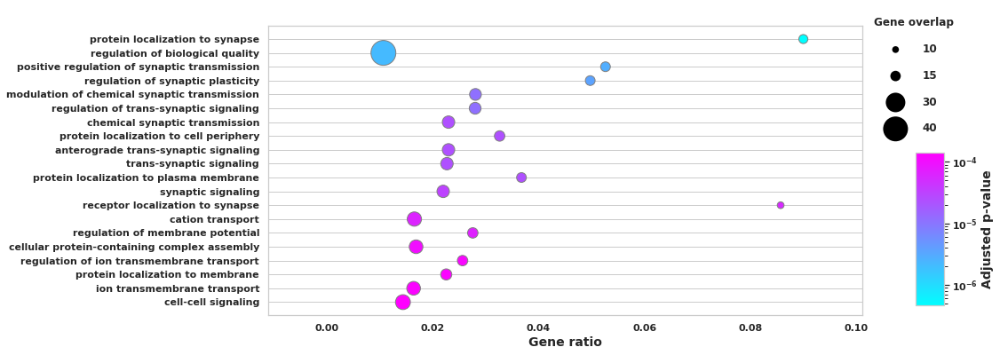

Cluster: 191216_BL_Stress_vs_Ctrl_Macrophages


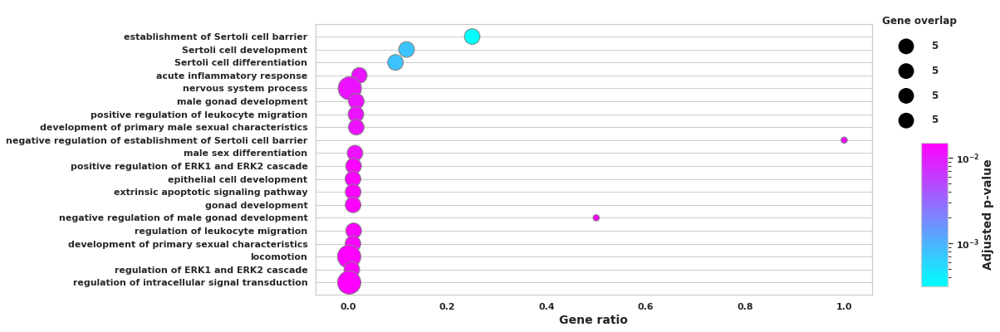

Cluster: 191216_BL_Stress_vs_Ctrl_10


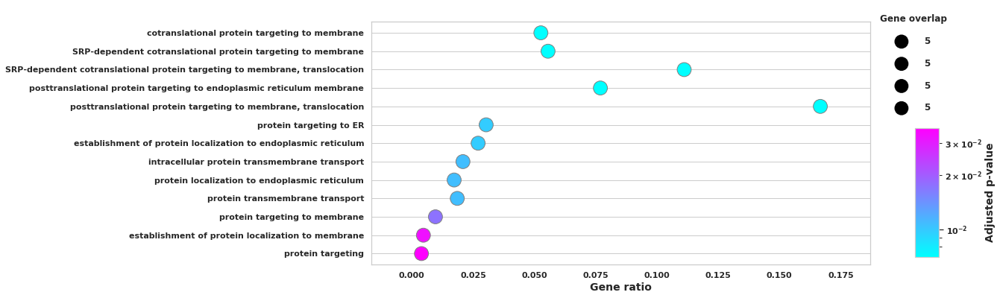

Cluster: 191216_ELS_Stress_vs_Ctrl_6
Cluster: 191216_Ctrl_ELS_vs_BL_Microglia


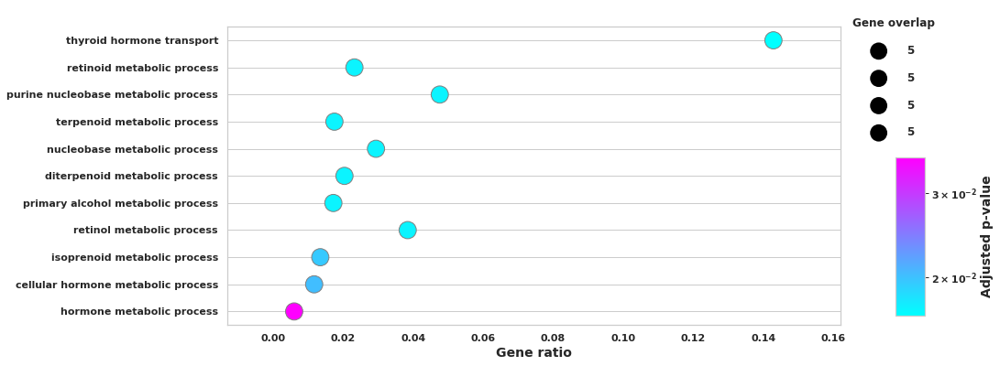

In [174]:
for clust in de_gobp_enrich:
    # Plot the results
    print(f'Cluster: {clust}')
    if len(de_gobp_enrich[clust].values) > 0:
        plot_enrich(de_gobp_enrich[clust])

# Examine data with sample-specific size factor normalisation

## Check BL samples

Read all files from the test 'BL Stress vs BL Ctrl'.

In [92]:
r = re.compile(".*BL_Stress_vs_Ctrl")
files = list(filter(r.match, files_all)) # Read Note
print(files)

['limma_191129_BL_Stress_vs_Ctrl_Vascular Cells.csv', 'limma_191129_BL_Stress_vs_Ctrl_Pericytes.csv', 'limma_191129_BL_Stress_vs_Ctrl_Neurons_Cck.csv', 'limma_191202_BL_Stress_vs_Ctrl_4.csv', 'limma_191129_BL_Stress_vs_Ctrl_Oligodendrocytes.csv', 'limma_191129_BL_Stress_vs_Ctrl_Macrophages.csv', 'limma_191129_BL_Stress_vs_Ctrl_Ependymal Cells.csv', 'limma_191129_BL_Stress_vs_Ctrl_Neurons_GABA.csv', 'limma_191202_BL_Stress_vs_Ctrl_19.csv', 'limma_191202_BL_Stress_vs_Ctrl_10.csv', 'limma_191129_BL_Stress_vs_Ctrl_Choroid Plexus Epithelial Cells.csv', 'limma_191129_BL_Stress_vs_Ctrl_Astrocytes.csv', 'limma_191129_BL_Stress_vs_Ctrl_Neurons_Glutamatergic.csv', 'limma_191202_BL_Stress_vs_Ctrl_2.csv', 'limma_191129_BL_Stress_vs_Ctrl_Oligodendrocyte Progenitor Cells (OPCs).csv', 'limma_191129_BL_Stress_vs_Ctrl_Neurons_Cajal–Retzius.csv', 'limma_191202_BL_Stress_vs_Ctrl_6.csv', 'limma_191129_BL_Stress_vs_Ctrl_Meningeal Cells.csv', 'limma_191202_BL_Stress_vs_Ctrl_28.csv', 'limma_191129_BL_Stress_

In [93]:
test_results = dict()
for file in files: 
    title = (file.split('limma_')[1]).split('.csv')[0]
    print(file)
    test_results[title] = pd.read_csv('./../table/' + file , index_col=0)

limma_191129_BL_Stress_vs_Ctrl_Vascular Cells.csv
limma_191129_BL_Stress_vs_Ctrl_Pericytes.csv
limma_191129_BL_Stress_vs_Ctrl_Neurons_Cck.csv
limma_191202_BL_Stress_vs_Ctrl_4.csv
limma_191129_BL_Stress_vs_Ctrl_Oligodendrocytes.csv
limma_191129_BL_Stress_vs_Ctrl_Macrophages.csv
limma_191129_BL_Stress_vs_Ctrl_Ependymal Cells.csv
limma_191129_BL_Stress_vs_Ctrl_Neurons_GABA.csv
limma_191202_BL_Stress_vs_Ctrl_19.csv
limma_191202_BL_Stress_vs_Ctrl_10.csv
limma_191129_BL_Stress_vs_Ctrl_Choroid Plexus Epithelial Cells.csv
limma_191129_BL_Stress_vs_Ctrl_Astrocytes.csv
limma_191129_BL_Stress_vs_Ctrl_Neurons_Glutamatergic.csv
limma_191202_BL_Stress_vs_Ctrl_2.csv
limma_191129_BL_Stress_vs_Ctrl_Oligodendrocyte Progenitor Cells (OPCs).csv
limma_191129_BL_Stress_vs_Ctrl_Neurons_Cajal–Retzius.csv
limma_191202_BL_Stress_vs_Ctrl_6.csv
limma_191129_BL_Stress_vs_Ctrl_Meningeal Cells.csv
limma_191202_BL_Stress_vs_Ctrl_28.csv
limma_191129_BL_Stress_vs_Ctrl_Microglia.csv
limma_191202_BL_Stress_vs_Ctrl_13.csv

In [94]:
high_stress = [sum(test_results[table]['logFC']>0) for table in test_results]
high_ctrl = [sum(test_results[table]['logFC']<0) for table in test_results]
labels = [table.split('_')[-1] for table in test_results]

In [95]:
high_ctrl

[0, 0, 0, 0, 3, 3, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0]

In [96]:
high_stress

[0,
 0,
 2,
 3159,
 3647,
 0,
 0,
 2,
 93,
 3178,
 2946,
 1233,
 6866,
 5989,
 2,
 11,
 16,
 0,
 0,
 22,
 2,
 0,
 223,
 1,
 0]

Visualise the number of expressed genes per cell type as barplot.

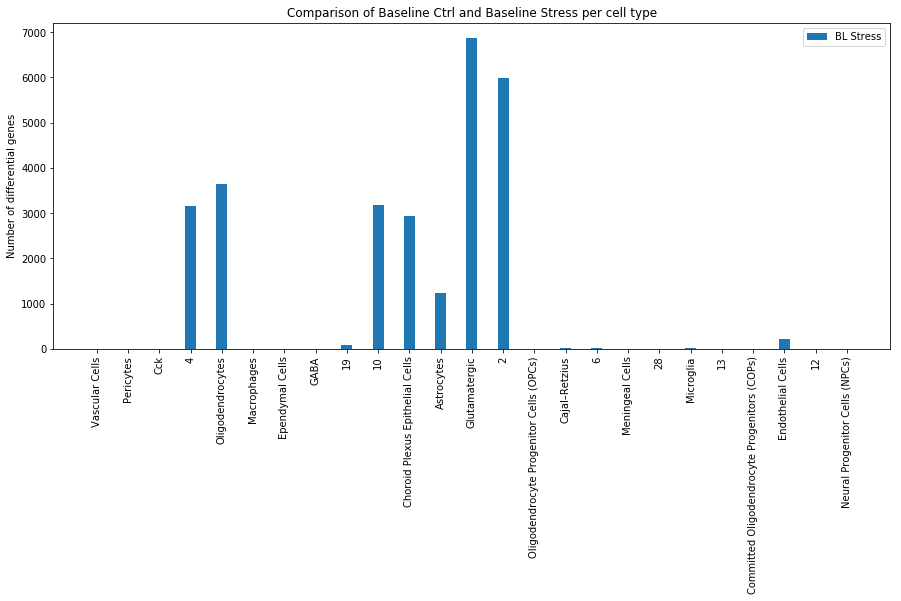

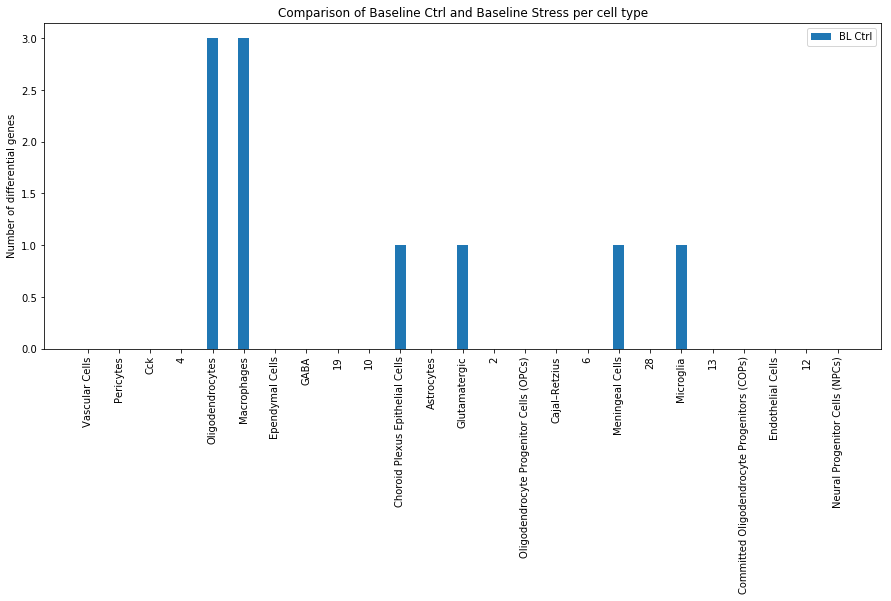

In [97]:
rcParams['figure.figsize']=(15,6)
N = len(high_stress)
ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence

p1 = plt.bar(ind, high_stress, width)
#p2 = plt.bar(ind, high_ctrl, width,
#             bottom=high_stress)

plt.ylabel('Number of differential genes')
plt.title('Comparison of Baseline Ctrl and Baseline Stress per cell type')
plt.xticks(ind, (labels), rotation='vertical')
#plt.yticks(np.arange(0, 81, 10))
plt.legend(['BL Stress'])
plt.savefig('BL_stress_vs_ctrl_per_cell_type_BL_stress_high_genes.png', bbox_inches='tight')
plt.show()


rcParams['figure.figsize']=(15,6)
N = len(high_stress)
ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence

#p1 = plt.bar(ind, high_stress, width)
p2 = plt.bar(ind, high_ctrl, width)

plt.ylabel('Number of differential genes')
plt.title('Comparison of Baseline Ctrl and Baseline Stress per cell type')
plt.xticks(ind, (labels), rotation='vertical')
#plt.yticks(np.arange(0, 81, 10))
plt.legend(['BL Ctrl'])
plt.savefig('BL_stress_vs_ctrl_per_cell_type_BL_ctrl_high_genes.png', bbox_inches='tight')
plt.show()

## Check ELS samples

Read all files from the test 'ELS Stress vs BL Ctrl'.

In [64]:
r = re.compile(".*ELS_Stress_vs_Ctrl")
files = list(filter(r.match, files_all)) # Read Note
print(files)

['limma_191202_ELS_Stress_vs_Ctrl_12.csv', 'limma_191202_ELS_Stress_vs_Ctrl_6.csv', 'limma_191129_ELS_Stress_vs_Ctrl_Vascular Cells.csv', 'limma_191129_ELS_Stress_vs_Ctrl_Meningeal Cells.csv', 'limma_191129_ELS_Stress_vs_Ctrl_Endothelial Cells.csv', 'limma_191129_ELS_Stress_vs_Ctrl_Astrocytes.csv', 'limma_191202_ELS_Stress_vs_Ctrl_13.csv', 'limma_191129_ELS_Stress_vs_Ctrl_Neural Progenitor Cells (NPCs).csv', 'limma_191129_ELS_Stress_vs_Ctrl_Microglia.csv', 'limma_191129_ELS_Stress_vs_Ctrl_Neurons_Cajal–Retzius.csv', 'limma_191202_ELS_Stress_vs_Ctrl_28.csv', 'limma_191129_ELS_Stress_vs_Ctrl_Macrophages.csv', 'limma_191202_ELS_Stress_vs_Ctrl_19.csv', 'limma_191202_ELS_Stress_vs_Ctrl_10.csv', 'limma_191129_ELS_Stress_vs_Ctrl_Choroid Plexus Epithelial Cells.csv', 'limma_191129_ELS_Stress_vs_Ctrl_Neurons_Glutamatergic.csv', 'limma_191129_ELS_Stress_vs_Ctrl_Ependymal Cells.csv', 'limma_191202_ELS_Stress_vs_Ctrl_2.csv', 'limma_191129_ELS_Stress_vs_Ctrl_Neurons_Cck.csv', 'limma_191129_ELS_Stre

In [65]:
test_results = dict()
for file in files: 
    title = (file.split('limma_')[1]).split('.csv')[0]
    print(file)
    test_results[title] = pd.read_csv('./../table/' + file , index_col=0)

limma_191202_ELS_Stress_vs_Ctrl_12.csv
limma_191202_ELS_Stress_vs_Ctrl_6.csv
limma_191129_ELS_Stress_vs_Ctrl_Vascular Cells.csv
limma_191129_ELS_Stress_vs_Ctrl_Meningeal Cells.csv
limma_191129_ELS_Stress_vs_Ctrl_Endothelial Cells.csv
limma_191129_ELS_Stress_vs_Ctrl_Astrocytes.csv
limma_191202_ELS_Stress_vs_Ctrl_13.csv
limma_191129_ELS_Stress_vs_Ctrl_Neural Progenitor Cells (NPCs).csv
limma_191129_ELS_Stress_vs_Ctrl_Microglia.csv
limma_191129_ELS_Stress_vs_Ctrl_Neurons_Cajal–Retzius.csv
limma_191202_ELS_Stress_vs_Ctrl_28.csv
limma_191129_ELS_Stress_vs_Ctrl_Macrophages.csv
limma_191202_ELS_Stress_vs_Ctrl_19.csv
limma_191202_ELS_Stress_vs_Ctrl_10.csv
limma_191129_ELS_Stress_vs_Ctrl_Choroid Plexus Epithelial Cells.csv
limma_191129_ELS_Stress_vs_Ctrl_Neurons_Glutamatergic.csv
limma_191129_ELS_Stress_vs_Ctrl_Ependymal Cells.csv
limma_191202_ELS_Stress_vs_Ctrl_2.csv
limma_191129_ELS_Stress_vs_Ctrl_Neurons_Cck.csv
limma_191129_ELS_Stress_vs_Ctrl_Committed Oligodendrocyte Progenitors (COPs).csv

In [66]:
high_stress = [sum(test_results[table]['logFC']>0) for table in test_results]
high_ctrl = [sum(test_results[table]['logFC']<0) for table in test_results]
labels = [table.split('_')[-1] for table in test_results]

Visualise the number of expressed genes per cell type as barplot.

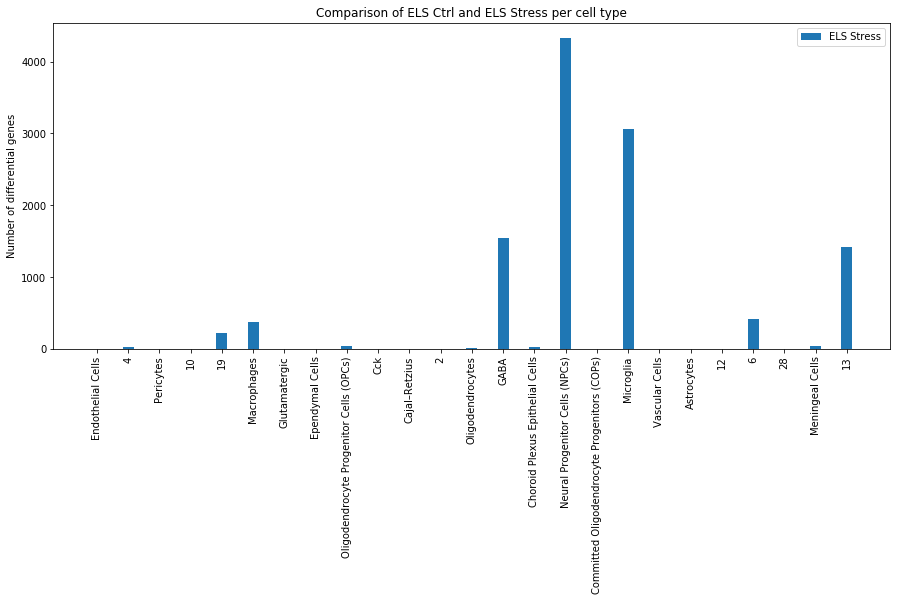

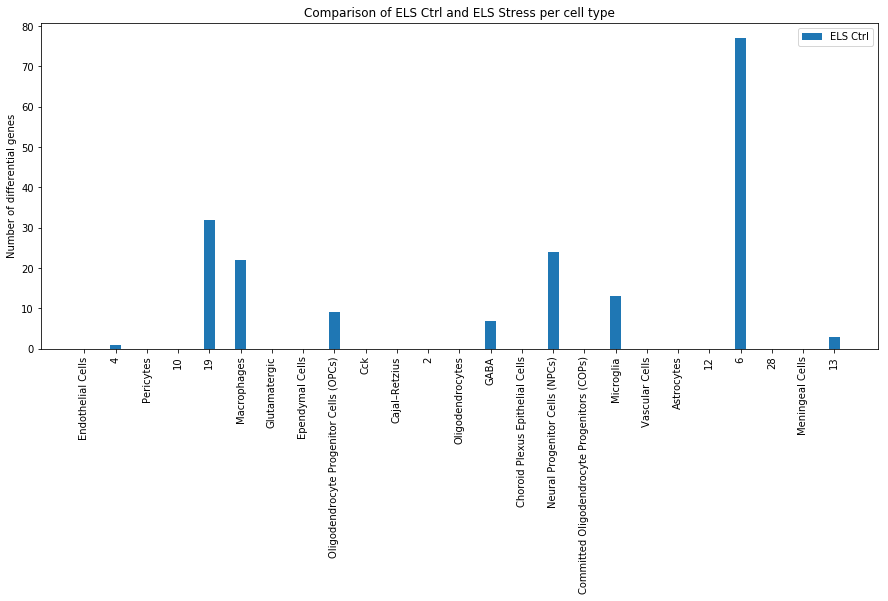

In [91]:
rcParams['figure.figsize']=(15,6)
N = len(high_stress)
ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence

p1 = plt.bar(ind, high_stress, width)
#p2 = plt.bar(ind, high_ctrl, width,
#             bottom=high_stress)

plt.ylabel('Number of differential genes')
plt.title('Comparison of ELS Ctrl and ELS Stress per cell type')
plt.xticks(ind, (labels), rotation='vertical')
#plt.yticks(np.arange(0, 81, 10))
plt.legend(['ELS Stress'])
plt.savefig('ELS_ctrl_vs_stress_per_cell_type_ELS_stress_high_genes.png', bbox_inches='tight')
plt.show()


rcParams['figure.figsize']=(15,6)
N = len(high_stress)
ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence

#p1 = plt.bar(ind, high_stress, width)
p2 = plt.bar(ind, high_ctrl, width)

plt.ylabel('Number of differential genes')
plt.title('Comparison of ELS Ctrl and ELS Stress per cell type')
plt.xticks(ind, (labels), rotation='vertical')
#plt.yticks(np.arange(0, 81, 10))
plt.legend(['ELS Ctrl'])
plt.savefig('ELS_ctrl_vs_stress_per_cell_type_ELS_ctrl_high_genes.png', bbox_inches='tight')
plt.show()

## Check ctrl samples

Read all files from the test 'Ctrl ELS vs BL'.

In [102]:
r = re.compile(".*Ctrl_ELS_vs_BL")
files = list(filter(r.match, files_all)) # Read Note
print(files)

['limma_191129_Ctrl_ELS_vs_BL_Endothelial Cells.csv', 'limma_191202_Ctrl_ELS_vs_BL_4.csv', 'limma_191129_Ctrl_ELS_vs_BL_Pericytes.csv', 'limma_191202_Ctrl_ELS_vs_BL_10.csv', 'limma_191202_Ctrl_ELS_vs_BL_19.csv', 'limma_191129_Ctrl_ELS_vs_BL_Macrophages.csv', 'limma_191129_Ctrl_ELS_vs_BL_Neurons_Glutamatergic.csv', 'limma_191129_Ctrl_ELS_vs_BL_Ependymal Cells.csv', 'limma_191129_Ctrl_ELS_vs_BL_Oligodendrocyte Progenitor Cells (OPCs).csv', 'limma_191129_Ctrl_ELS_vs_BL_Neurons_Cck.csv', 'limma_191129_Ctrl_ELS_vs_BL_Neurons_Cajal–Retzius.csv', 'limma_191202_Ctrl_ELS_vs_BL_2.csv', 'limma_191129_Ctrl_ELS_vs_BL_Oligodendrocytes.csv', 'limma_191129_Ctrl_ELS_vs_BL_Neurons_GABA.csv', 'limma_191129_Ctrl_ELS_vs_BL_Choroid Plexus Epithelial Cells.csv', 'limma_191129_Ctrl_ELS_vs_BL_Neural Progenitor Cells (NPCs).csv', 'limma_191129_Ctrl_ELS_vs_BL_Committed Oligodendrocyte Progenitors (COPs).csv', 'limma_191129_Ctrl_ELS_vs_BL_Microglia.csv', 'limma_191129_Ctrl_ELS_vs_BL_Vascular Cells.csv', 'limma_19

In [103]:
test_results = dict()
for file in files: 
    title = (file.split('limma_')[1]).split('.csv')[0]
    print(file)
    test_results[title] = pd.read_csv('./../table/' + file , index_col=0)

limma_191129_Ctrl_ELS_vs_BL_Endothelial Cells.csv
limma_191202_Ctrl_ELS_vs_BL_4.csv
limma_191129_Ctrl_ELS_vs_BL_Pericytes.csv
limma_191202_Ctrl_ELS_vs_BL_10.csv
limma_191202_Ctrl_ELS_vs_BL_19.csv
limma_191129_Ctrl_ELS_vs_BL_Macrophages.csv
limma_191129_Ctrl_ELS_vs_BL_Neurons_Glutamatergic.csv
limma_191129_Ctrl_ELS_vs_BL_Ependymal Cells.csv
limma_191129_Ctrl_ELS_vs_BL_Oligodendrocyte Progenitor Cells (OPCs).csv
limma_191129_Ctrl_ELS_vs_BL_Neurons_Cck.csv
limma_191129_Ctrl_ELS_vs_BL_Neurons_Cajal–Retzius.csv
limma_191202_Ctrl_ELS_vs_BL_2.csv
limma_191129_Ctrl_ELS_vs_BL_Oligodendrocytes.csv
limma_191129_Ctrl_ELS_vs_BL_Neurons_GABA.csv
limma_191129_Ctrl_ELS_vs_BL_Choroid Plexus Epithelial Cells.csv
limma_191129_Ctrl_ELS_vs_BL_Neural Progenitor Cells (NPCs).csv
limma_191129_Ctrl_ELS_vs_BL_Committed Oligodendrocyte Progenitors (COPs).csv
limma_191129_Ctrl_ELS_vs_BL_Microglia.csv
limma_191129_Ctrl_ELS_vs_BL_Vascular Cells.csv
limma_191129_Ctrl_ELS_vs_BL_Astrocytes.csv
limma_191202_Ctrl_ELS_vs

In [104]:
high_ELS = [sum(test_results[table]['logFC']>0) for table in test_results]
high_BL = [sum(test_results[table]['logFC']<0) for table in test_results]
labels = [table.split('_')[-1] for table in test_results]

Visualise the number of expressed genes per cell type as barplot.

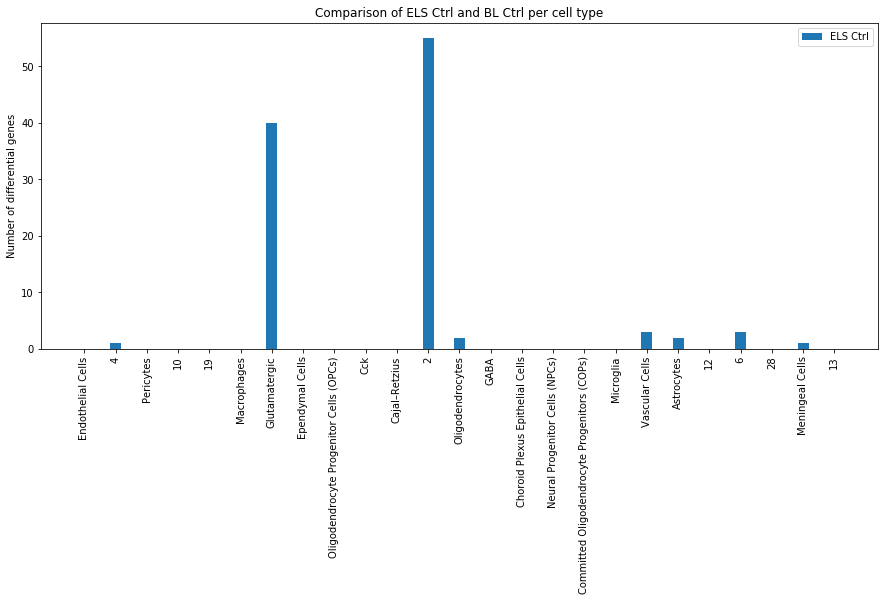

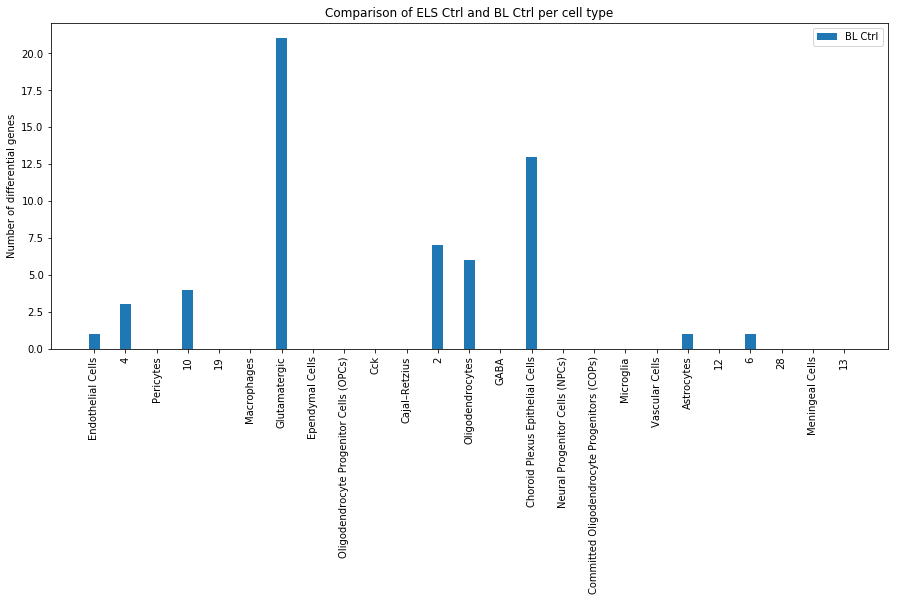

In [105]:
rcParams['figure.figsize']=(15,6)
N = len(high_ELS)
ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence

p1 = plt.bar(ind, high_ELS, width)
#p2 = plt.bar(ind, high_ctrl, width,
#             bottom=high_stress)

plt.ylabel('Number of differential genes')
plt.title('Comparison of ELS Ctrl and BL Ctrl per cell type')
plt.xticks(ind, (labels), rotation='vertical')
#plt.yticks(np.arange(0, 81, 10))
plt.legend(['ELS Ctrl'])
plt.savefig('Ctrl_ELS_vs_BL_per_cell_type_ELS_ctrl_high_genes.png', bbox_inches='tight')
plt.show()


rcParams['figure.figsize']=(15,6)
N = len(high_ELS)
ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence

#p1 = plt.bar(ind, high_stress, width)
p2 = plt.bar(ind, high_BL, width)

plt.ylabel('Number of differential genes')
plt.title('Comparison of ELS Ctrl and BL Ctrl per cell type')
plt.xticks(ind, (labels), rotation='vertical')
#plt.yticks(np.arange(0, 81, 10))
plt.legend(['BL Ctrl'])
plt.savefig('Ctrl_ELS_vs_BL_per_cell_type_BL_ctrl_high_genes.png', bbox_inches='tight')
plt.show()

## Check Stress samples

Read all files from the test 'Stress ELS vs BL'.

In [106]:
r = re.compile(".*Stress_ELS_vs_BL")
files = list(filter(r.match, files_all)) # Read Note
print(files)

['limma_191129_Stress_ELS_vs_BL_Pericytes.csv', 'limma_191202_Stress_ELS_vs_BL_2.csv', 'limma_191129_Stress_ELS_vs_BL_Meningeal Cells.csv', 'limma_191129_Stress_ELS_vs_BL_Neurons_Glutamatergic.csv', 'limma_191129_Stress_ELS_vs_BL_Neural Progenitor Cells (NPCs).csv', 'limma_191202_Stress_ELS_vs_BL_10.csv', 'limma_191202_Stress_ELS_vs_BL_19.csv', 'limma_191202_Stress_ELS_vs_BL_4.csv', 'limma_191129_Stress_ELS_vs_BL_Endothelial Cells.csv', 'limma_191129_Stress_ELS_vs_BL_Oligodendrocytes.csv', 'limma_191129_Stress_ELS_vs_BL_Vascular Cells.csv', 'limma_191129_Stress_ELS_vs_BL_Neurons_Cajal–Retzius.csv', 'limma_191129_Stress_ELS_vs_BL_Oligodendrocyte Progenitor Cells (OPCs).csv', 'limma_191129_Stress_ELS_vs_BL_Macrophages.csv', 'limma_191202_Stress_ELS_vs_BL_13.csv', 'limma_191129_Stress_ELS_vs_BL_Microglia.csv', 'limma_191129_Stress_ELS_vs_BL_Astrocytes.csv', 'limma_191129_Stress_ELS_vs_BL_Neurons_GABA.csv', 'limma_191202_Stress_ELS_vs_BL_28.csv', 'limma_191129_Stress_ELS_vs_BL_Neurons_Cck.

In [107]:
test_results = dict()
for file in files: 
    title = (file.split('limma_')[1]).split('.csv')[0]
    print(file)
    test_results[title] = pd.read_csv('./../table/' + file , index_col=0)

limma_191129_Stress_ELS_vs_BL_Pericytes.csv
limma_191202_Stress_ELS_vs_BL_2.csv
limma_191129_Stress_ELS_vs_BL_Meningeal Cells.csv
limma_191129_Stress_ELS_vs_BL_Neurons_Glutamatergic.csv
limma_191129_Stress_ELS_vs_BL_Neural Progenitor Cells (NPCs).csv
limma_191202_Stress_ELS_vs_BL_10.csv
limma_191202_Stress_ELS_vs_BL_19.csv
limma_191202_Stress_ELS_vs_BL_4.csv
limma_191129_Stress_ELS_vs_BL_Endothelial Cells.csv
limma_191129_Stress_ELS_vs_BL_Oligodendrocytes.csv
limma_191129_Stress_ELS_vs_BL_Vascular Cells.csv
limma_191129_Stress_ELS_vs_BL_Neurons_Cajal–Retzius.csv
limma_191129_Stress_ELS_vs_BL_Oligodendrocyte Progenitor Cells (OPCs).csv
limma_191129_Stress_ELS_vs_BL_Macrophages.csv
limma_191202_Stress_ELS_vs_BL_13.csv
limma_191129_Stress_ELS_vs_BL_Microglia.csv
limma_191129_Stress_ELS_vs_BL_Astrocytes.csv
limma_191129_Stress_ELS_vs_BL_Neurons_GABA.csv
limma_191202_Stress_ELS_vs_BL_28.csv
limma_191129_Stress_ELS_vs_BL_Neurons_Cck.csv
limma_191129_Stress_ELS_vs_BL_Ependymal Cells.csv
limma

In [108]:
high_ELS = [sum(test_results[table]['logFC']>0) for table in test_results]
high_BL = [sum(test_results[table]['logFC']<0) for table in test_results]
labels = [table.split('_')[-1] for table in test_results]

Visualise the number of expressed genes per cell type as barplot.

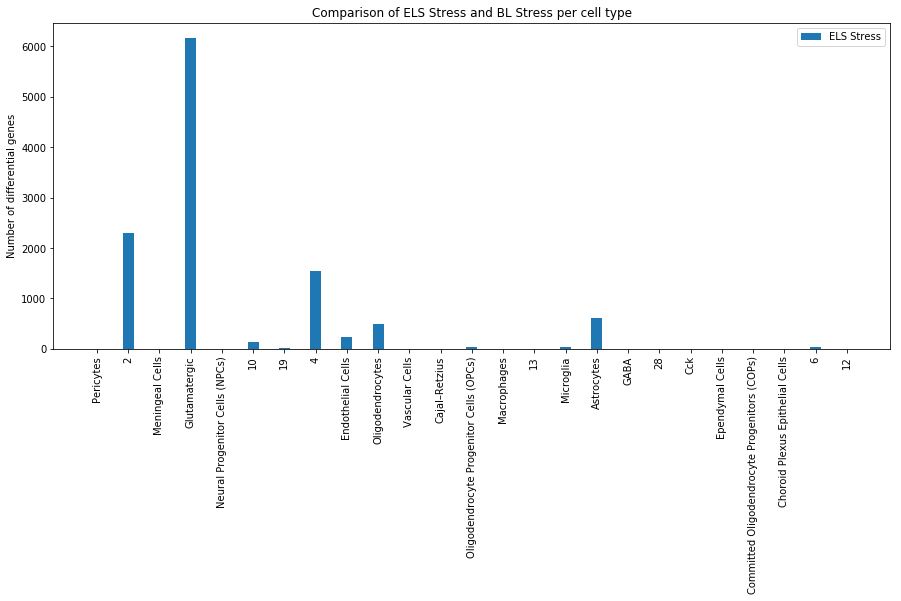

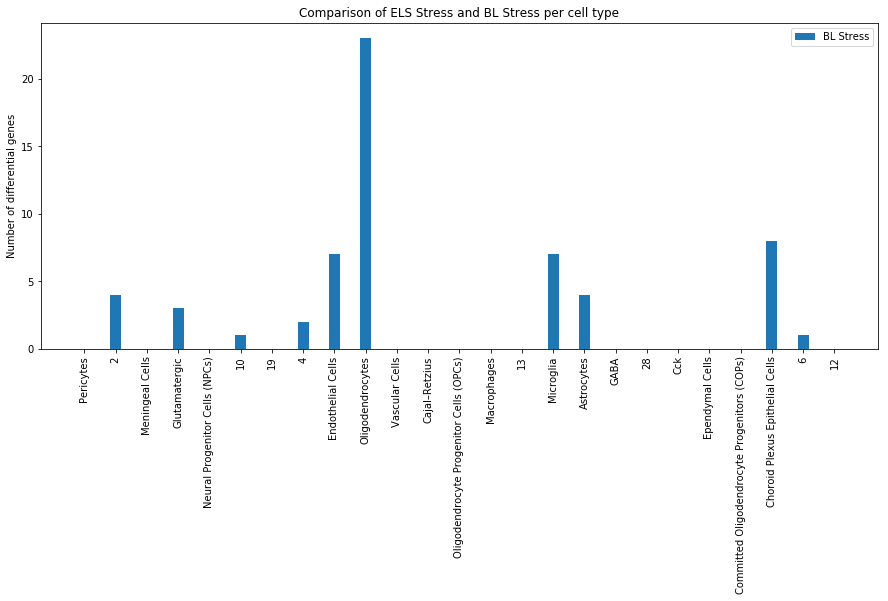

In [109]:
rcParams['figure.figsize']=(15,6)
N = len(high_ELS)
ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence

p1 = plt.bar(ind, high_ELS, width)
#p2 = plt.bar(ind, high_ctrl, width,
#             bottom=high_stress)

plt.ylabel('Number of differential genes')
plt.title('Comparison of ELS Stress and BL Stress per cell type')
plt.xticks(ind, (labels), rotation='vertical')
#plt.yticks(np.arange(0, 81, 10))
plt.legend(['ELS Stress'])
plt.savefig('Stress_ELS_vs_BL_per_cell_type_ELS_stress_high_genes.png', bbox_inches='tight')
plt.show()


rcParams['figure.figsize']=(15,6)
N = len(high_ELS)
ind = np.arange(N)    # the x locations for the groups
width = 0.35       # the width of the bars: can also be len(x) sequence

#p1 = plt.bar(ind, high_stress, width)
p2 = plt.bar(ind, high_BL, width)

plt.ylabel('Number of differential genes')
plt.title('Comparison of ELS Stress and BL Stress per cell type')
plt.xticks(ind, (labels), rotation='vertical')
#plt.yticks(np.arange(0, 81, 10))
plt.legend(['BL Stress'])
plt.savefig('Stress_ELS_vs_BL_per_cell_type_BL_stress_high_genes.png', bbox_inches='tight')
plt.show()

## Run GSEA for each file

In [134]:
# Plotting functions - 'GProfiler-official version'
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
from matplotlib import colors
from matplotlib import rcParams


def scale_data_5_75(data):
    mind = np.min(data)
    maxd = np.max(data)
    
    if maxd == mind:
        maxd=maxd+1
        mind=mind-1
        
    drange = maxd - mind
    return ((((data - mind)/drange*0.70)+0.05)*100)


def plot_enrich(data, n_terms=20, save=False):
    # Test data input
    if not isinstance(data, pd.DataFrame):
        raise ValueError('Please input a Pandas Dataframe output by gprofiler.')
        
    if not np.all([term in data.columns for term in ['p_value', 'name', 'intersection_size']]):
        raise TypeError('The data frame {} does not contain enrichment results from gprofiler.'.format(data))
    
    data_to_plot = data.iloc[:n_terms,:].copy()
    data_to_plot['go.id'] = data_to_plot.index

    min_pval = data_to_plot['p_value'].min()
    max_pval = data_to_plot['p_value'].max()
    
    # Scale intersection_size to be between 5 and 75 for plotting
    #Note: this is done as calibration was done for values between 5 and 75
    data_to_plot['scaled.overlap'] = scale_data_5_75(data_to_plot['intersection_size'])
    
    norm = colors.LogNorm(min_pval, max_pval)
    sm = plt.cm.ScalarMappable(cmap="cool", norm=norm)
    sm.set_array([])

    rcParams.update({'font.size': 14, 'font.weight': 'bold'})

    sb.set(style="whitegrid")

    path = plt.scatter(x='recall', y="name", c='p_value', cmap='cool', 
                       norm=colors.LogNorm(min_pval, max_pval), 
                       data=data_to_plot, linewidth=1, edgecolor="grey", 
                       s=[(i+10)**1.5 for i in data_to_plot['scaled.overlap']])
    ax = plt.gca()
    ax.invert_yaxis()

    ax.set_ylabel('')
    ax.set_xlabel('Gene ratio', fontsize=14, fontweight='bold')
    ax.xaxis.grid(False)
    ax.yaxis.grid(True)

    # Shrink current axis by 20%
    box = ax.get_position()
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

    # Get tick marks for this plot
    #Note: 6 ticks maximum
    min_tick = np.floor(np.log10(min_pval)).astype(int)
    max_tick = np.ceil(np.log10(max_pval)).astype(int)
    tick_step = np.ceil((max_tick - min_tick)/6).astype(int)
    
    # Ensure no 0 values
    if tick_step == 0:
        tick_step = 1
        min_tick = max_tick-1
    
    ticks_vals = [10**i for i in range(max_tick, min_tick-1, -tick_step)]
    ticks_labs = ['$10^{'+str(i)+'}$' for i in range(max_tick, min_tick-1, -tick_step)]

    #Colorbar
    fig = plt.gcf()
    cbaxes = fig.add_axes([0.8, 0.15, 0.03, 0.4])
    cbar = ax.figure.colorbar(sm, ticks=ticks_vals, shrink=0.5, anchor=(0,0.1), cax=cbaxes)
    cbar.ax.set_yticklabels(ticks_labs)
    cbar.set_label("Adjusted p-value", fontsize=14, fontweight='bold')

    #Size legend
    min_olap = data_to_plot['intersection_size'].min()
    max_olap = data_to_plot['intersection_size'].max()
    olap_range = max_olap - min_olap
    
    #Note: approximate scaled 5, 25, 50, 75 values are calculated
    #      and then rounded to nearest number divisible by 5
    size_leg_vals = [np.ceil(i/5)*5 for i in 
                          [min_olap, min_olap+(20/70)*olap_range, min_olap+(45/70)*olap_range, max_olap]]
    size_leg_scaled_vals = scale_data_5_75(size_leg_vals)

    
    l1 = plt.scatter([],[], s=(size_leg_scaled_vals[0]+10)**1.5, edgecolors='none', color='black')
    l2 = plt.scatter([],[], s=(size_leg_scaled_vals[1]+10)**1.5, edgecolors='none', color='black')
    l3 = plt.scatter([],[], s=(size_leg_scaled_vals[2]+10)**1.5, edgecolors='none', color='black')
    l4 = plt.scatter([],[], s=(size_leg_scaled_vals[3]+10)**1.5, edgecolors='none', color='black')

    labels = [str(int(i)) for i in size_leg_vals]

    leg = plt.legend([l1, l2, l3, l4], labels, ncol=1, frameon=False, fontsize=12,
                     handlelength=1, loc = 'center left', borderpad = 1, labelspacing = 1.4,
                     handletextpad=2, title='Gene overlap', scatterpoints = 1,  bbox_to_anchor=(-2, 1.5), 
                     facecolor='black')

    if save:
        plt.savefig(save, dpi=300, format='pdf')

    plt.show()

### Biological Process GO term enrichment

In [111]:
gp = GProfiler(return_dataframe=True, user_agent='g:GOSt')

In [168]:
r = re.compile(".*19120")
files = list(filter(r.match, files_all))

In [137]:
test_results = dict()
for file in files_all: 
    title = (file.split('limma_')[1]).split('.csv')[0]
    print(file)
    test_results[title] = pd.read_csv('./../table/' + file , index_col=0)

limma_191129_Stress_ELS_vs_BL_Pericytes.csv
limma_191129_Ctrl_ELS_vs_BL_Endothelial Cells.csv
limma_191202_Ctrl_ELS_vs_BL_4.csv
limma_191129_Ctrl_ELS_vs_BL_Pericytes.csv
limma_191202_Stress_ELS_vs_BL_2.csv
limma_191129_Stress_ELS_vs_BL_Meningeal Cells.csv
limma_191202_Ctrl_ELS_vs_BL_10.csv
limma_191129_Stress_ELS_vs_BL_Neurons_Glutamatergic.csv
limma_191129_BL_Stress_vs_Ctrl_Vascular Cells.csv
limma_191202_Ctrl_ELS_vs_BL_19.csv
limma_191129_Stress_ELS_vs_BL_Neural Progenitor Cells (NPCs).csv
limma_191129_BL_Stress_vs_Ctrl_Pericytes.csv
limma_191129_Ctrl_ELS_vs_BL_Macrophages.csv
limma_191129_BL_Stress_vs_Ctrl_Neurons_Cck.csv
limma_191129_Ctrl_ELS_vs_BL_Neurons_Glutamatergic.csv
limma_191202_BL_Stress_vs_Ctrl_4.csv
limma_191202_rest_vs_2_neuron_glu.csv
limma_191202_rest_vs_13_neuron_glu.csv
limma_191202_ELS_Stress_vs_Ctrl_12.csv
limma_191202_rest_vs_28_neuron_glu.csv
limma_191129_Ctrl_ELS_vs_BL_Ependymal Cells.csv
limma_191129_BL_Stress_vs_Ctrl_Oligodendrocytes.csv
limma_191129_Ctrl_ELS

In [138]:
de_signif = test_results

In [139]:
de_gobp_enrich = dict()

for clust in test_results.keys(): 
    if sum(de_signif[clust]['logFC']>0)>0:
        tmp = gp.profile(organism='mmusculus', sources=['GO:BP'], user_threshold=0.05,
                     significance_threshold_method='fdr', 
                     background=adata.var_names.tolist(),
                     query=de_signif[clust][de_signif[clust]['logFC']>0].index.values.tolist())
    
        if tmp is not None:
            tmp.set_index('native', inplace=True)
            de_gobp_enrich[clust] = tmp.sort_values('p_value').iloc[:,[2,5,7,10,1]]
        else:
            de_gobp_enrich[clust] = pd.DataFrame()
    
        # Print some results
        print(f'Cluster {clust}:')
        de_gobp_enrich[clust].iloc[:50,:]

Cluster 191202_Ctrl_ELS_vs_BL_4:
Cluster 191202_Stress_ELS_vs_BL_2:
Cluster 191129_Stress_ELS_vs_BL_Neurons_Glutamatergic:
Cluster 191129_Stress_ELS_vs_BL_Neural Progenitor Cells (NPCs):
Cluster 191129_BL_Stress_vs_Ctrl_Neurons_Cck:
Cluster 191129_Ctrl_ELS_vs_BL_Neurons_Glutamatergic:
Cluster 191202_BL_Stress_vs_Ctrl_4:
Cluster 191202_rest_vs_2_neuron_glu:
Cluster 191202_rest_vs_13_neuron_glu:
Cluster 191202_ELS_Stress_vs_Ctrl_12:
Cluster 191202_rest_vs_28_neuron_glu:
Cluster 191129_BL_Stress_vs_Ctrl_Oligodendrocytes:
Cluster 191202_ELS_Stress_vs_Ctrl_6:
Cluster 191202_Stress_ELS_vs_BL_10:
Cluster 191129_BL_Stress_vs_Ctrl_Neurons_GABA:
Cluster 191129_ELS_Stress_vs_Ctrl_Meningeal Cells:
Cluster 191202_Stress_ELS_vs_BL_19:
Cluster 191129_ELS_Stress_vs_Ctrl_Endothelial Cells:
Cluster 191202_Stress_ELS_vs_BL_4:
Cluster 191129_ELS_Stress_vs_Ctrl_Astrocytes:
Cluster 191129_Stress_ELS_vs_BL_Endothelial Cells:
Cluster 191202_Ctrl_ELS_vs_BL_2:
Cluster 191202_BL_Stress_vs_Ctrl_19:
Cluster 191129

Cluster: 191202_Ctrl_ELS_vs_BL_4
Cluster: 191202_Stress_ELS_vs_BL_2


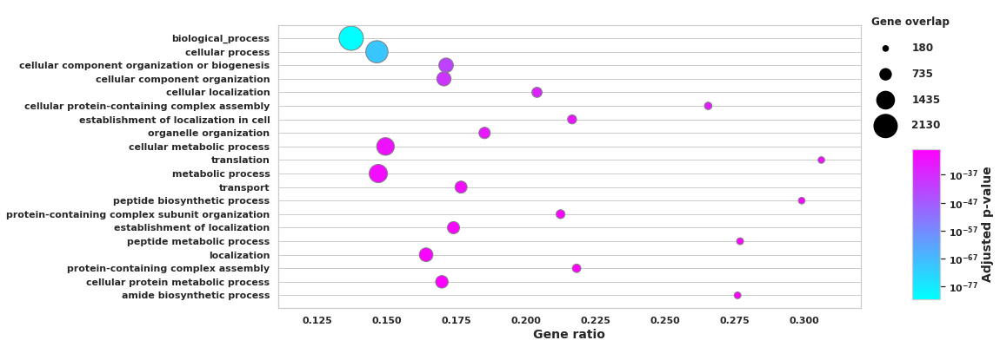

Cluster: 191129_Stress_ELS_vs_BL_Neurons_Glutamatergic


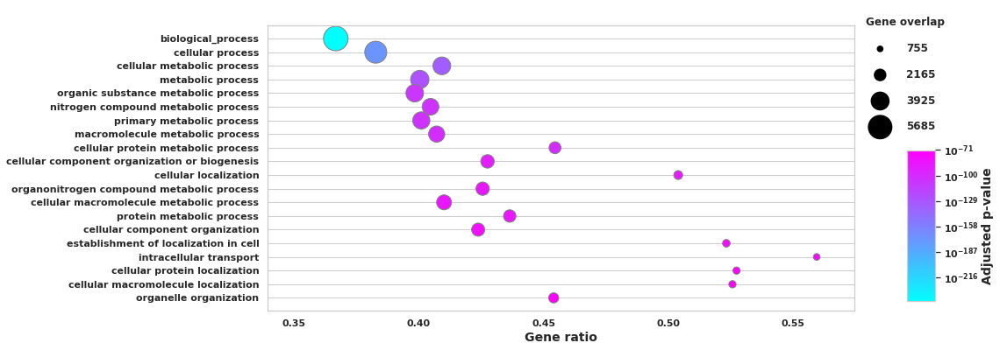

Cluster: 191129_Stress_ELS_vs_BL_Neural Progenitor Cells (NPCs)


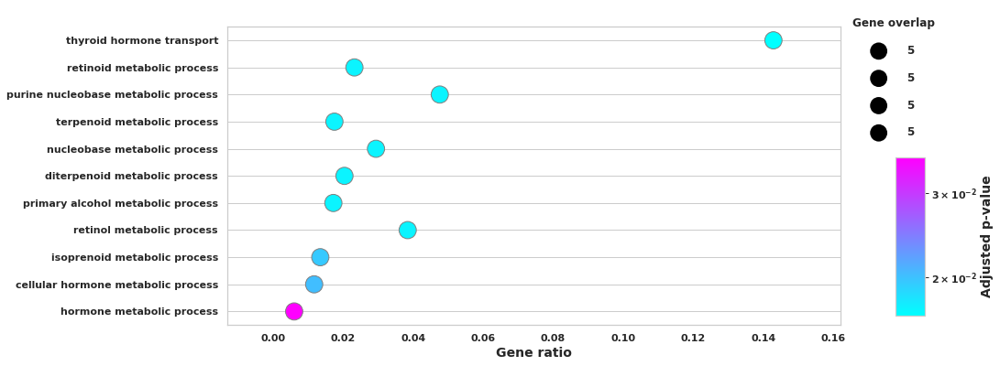

Cluster: 191129_BL_Stress_vs_Ctrl_Neurons_Cck


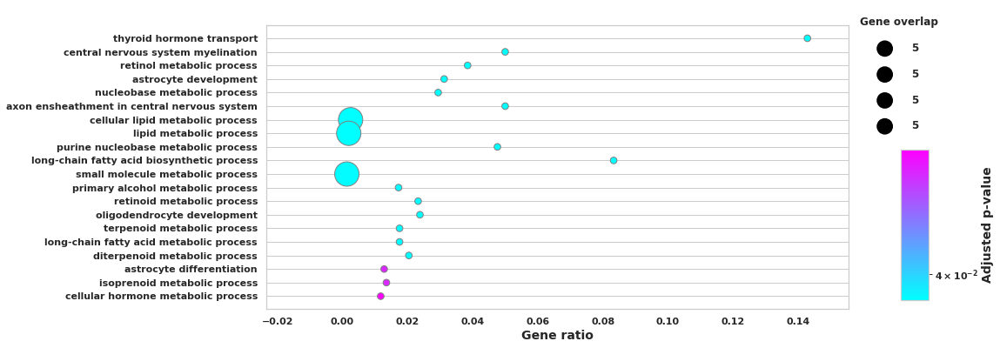

Cluster: 191129_Ctrl_ELS_vs_BL_Neurons_Glutamatergic


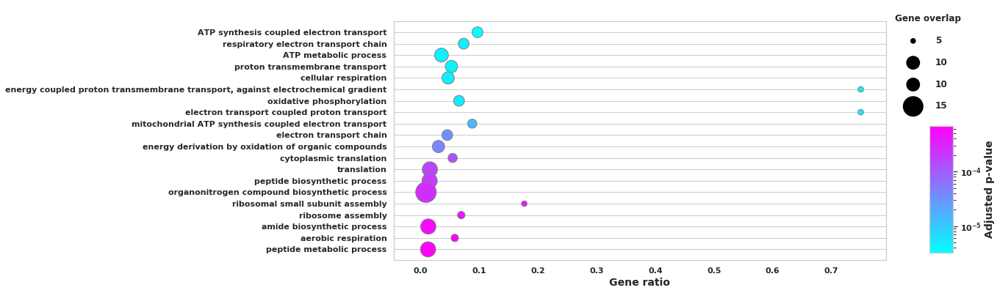

Cluster: 191202_BL_Stress_vs_Ctrl_4


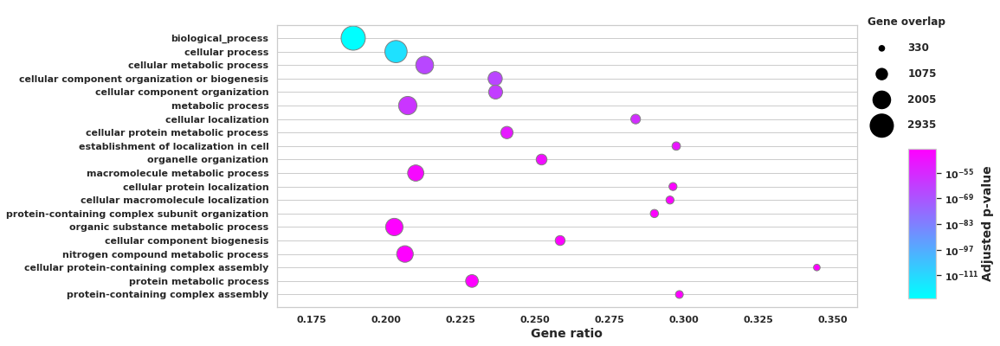

Cluster: 191202_rest_vs_2_neuron_glu


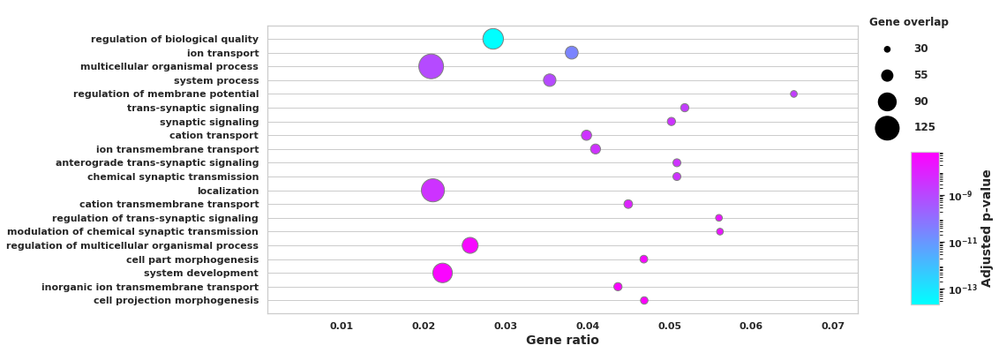

Cluster: 191202_rest_vs_13_neuron_glu


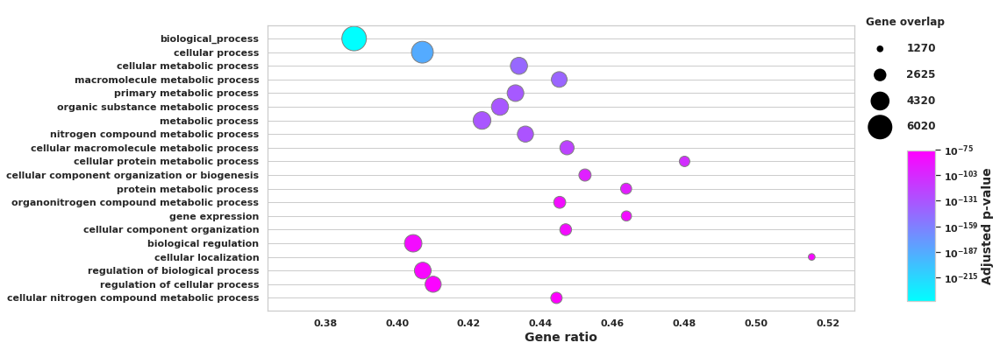

Cluster: 191202_ELS_Stress_vs_Ctrl_12


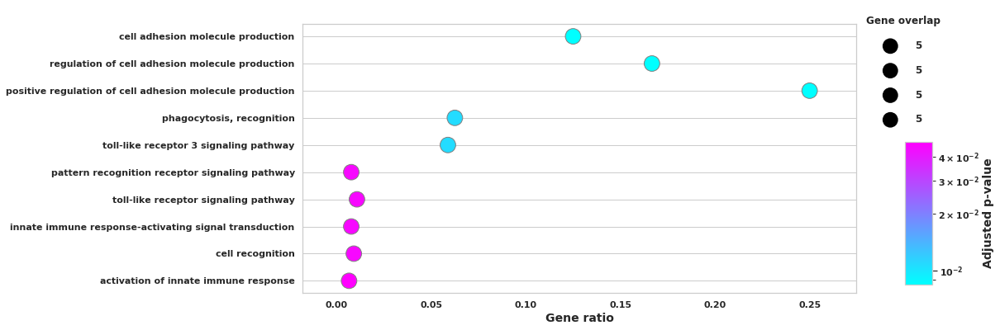

Cluster: 191202_rest_vs_28_neuron_glu


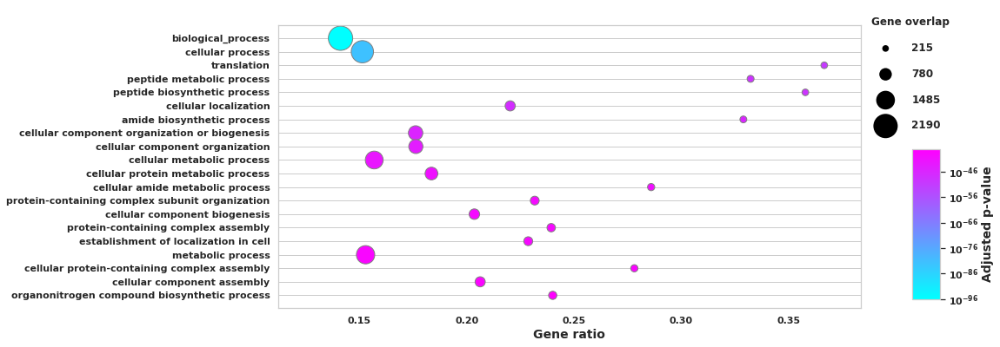

Cluster: 191129_BL_Stress_vs_Ctrl_Oligodendrocytes


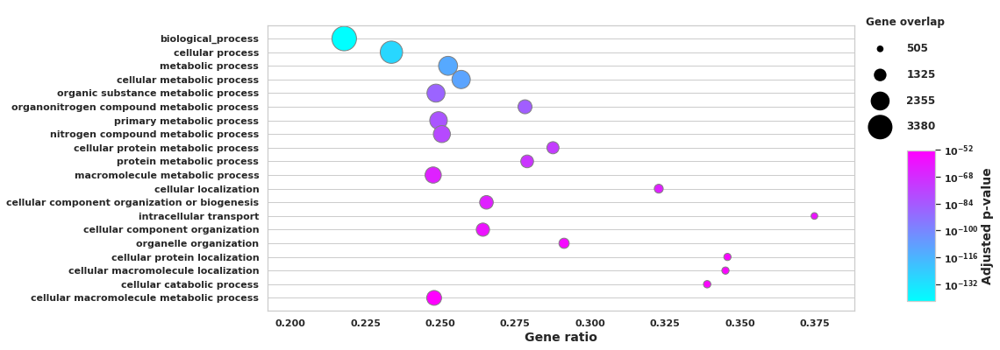

Cluster: 191202_ELS_Stress_vs_Ctrl_6


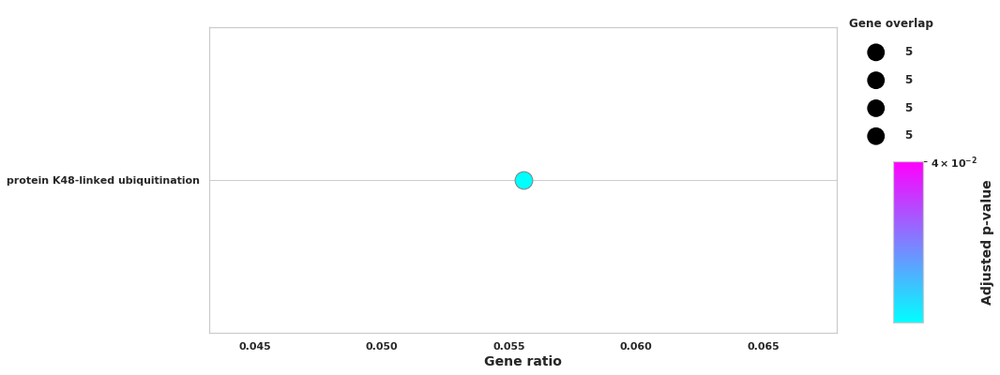

Cluster: 191202_Stress_ELS_vs_BL_10


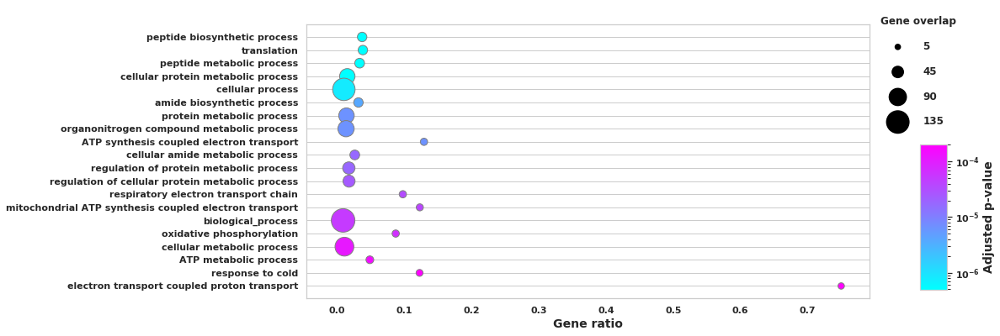

Cluster: 191129_BL_Stress_vs_Ctrl_Neurons_GABA


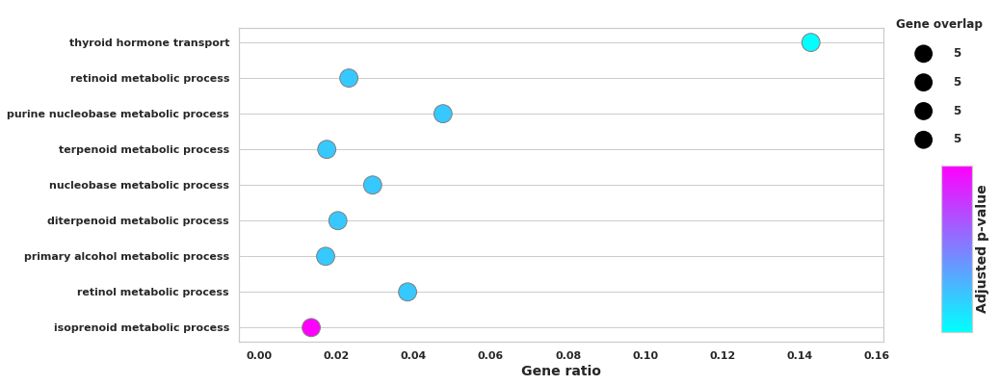

Cluster: 191129_ELS_Stress_vs_Ctrl_Meningeal Cells


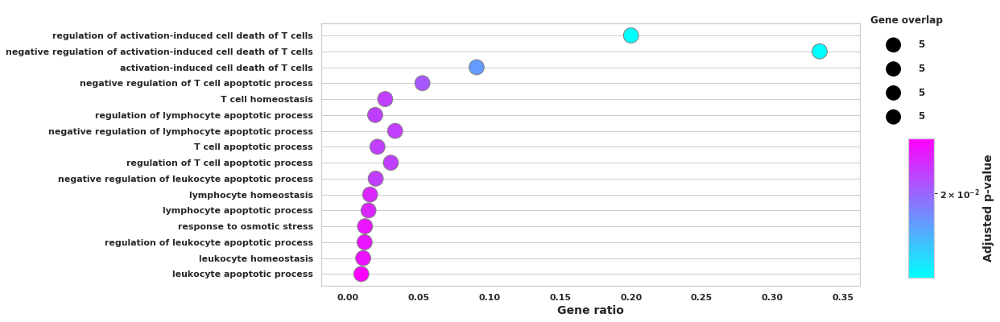

Cluster: 191202_Stress_ELS_vs_BL_19
Cluster: 191129_ELS_Stress_vs_Ctrl_Endothelial Cells


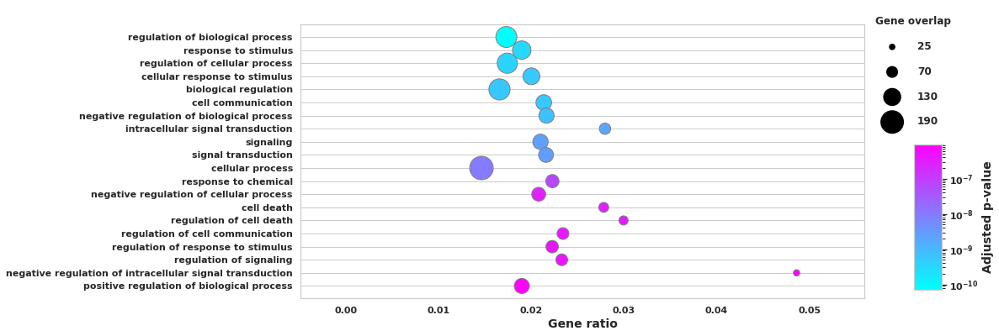

Cluster: 191202_Stress_ELS_vs_BL_4


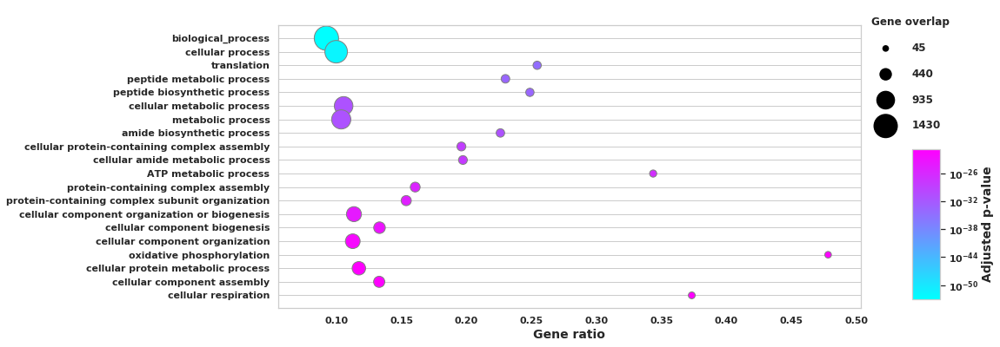

Cluster: 191129_ELS_Stress_vs_Ctrl_Astrocytes


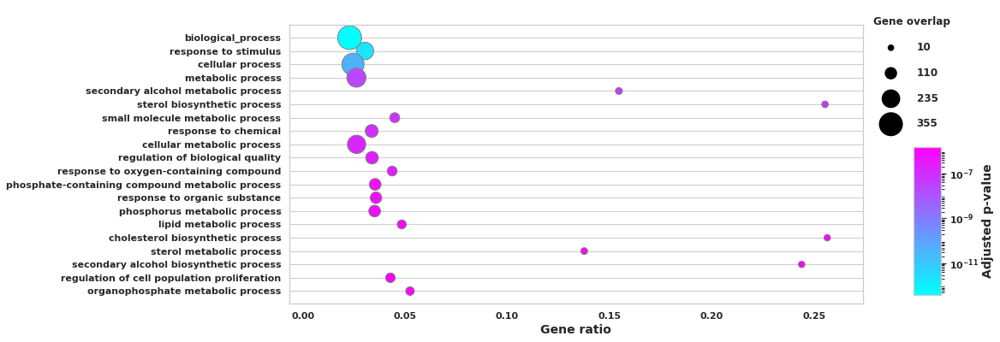

Cluster: 191129_Stress_ELS_vs_BL_Endothelial Cells


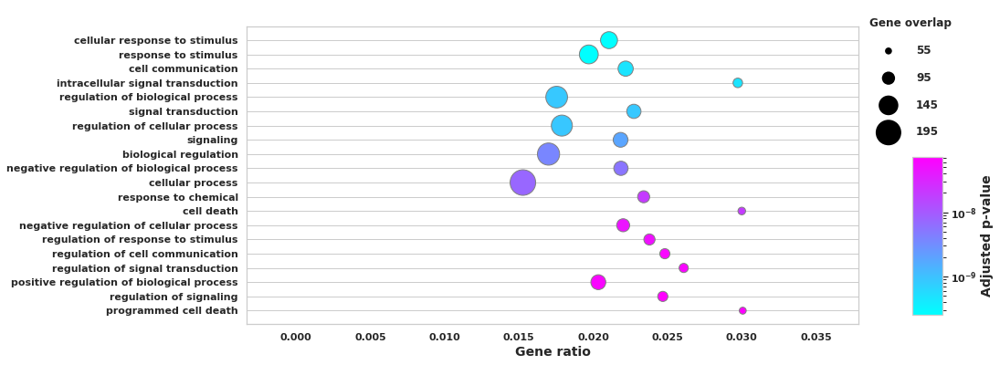

Cluster: 191202_Ctrl_ELS_vs_BL_2


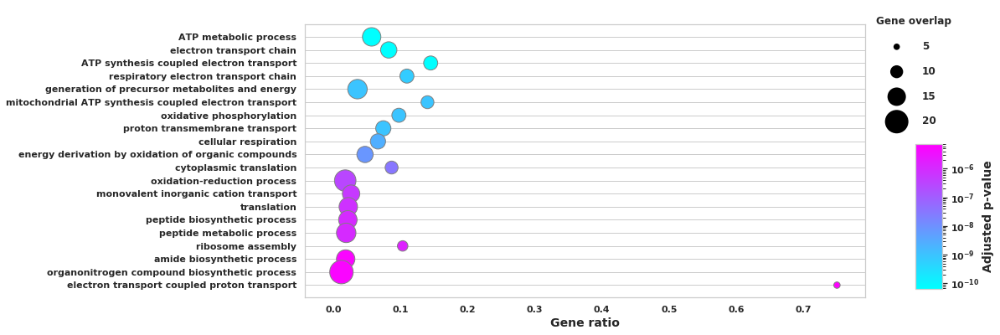

Cluster: 191202_BL_Stress_vs_Ctrl_19


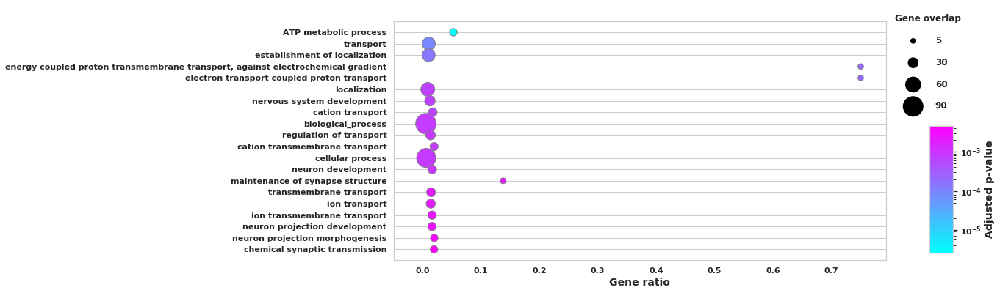

Cluster: 191129_Ctrl_ELS_vs_BL_Oligodendrocytes
Cluster: 191129_Stress_ELS_vs_BL_Oligodendrocytes


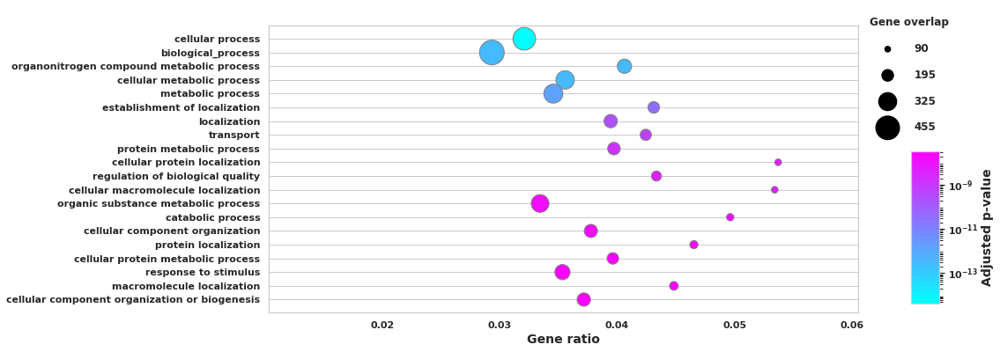

Cluster: 191202_BL_Stress_vs_Ctrl_10


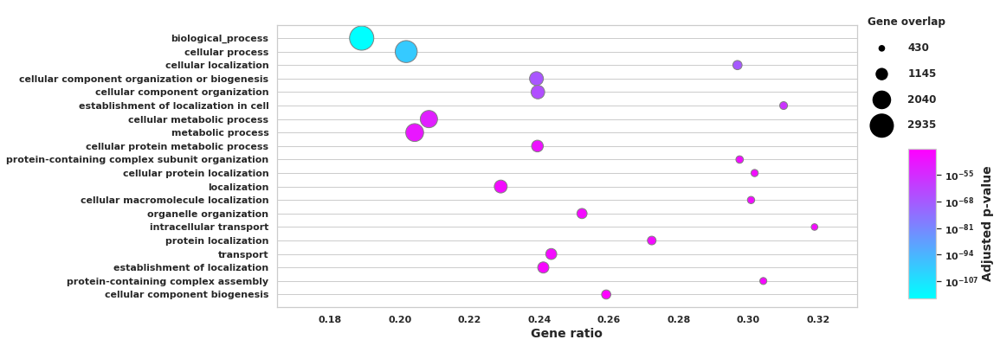

Cluster: 191129_BL_Stress_vs_Ctrl_Choroid Plexus Epithelial Cells


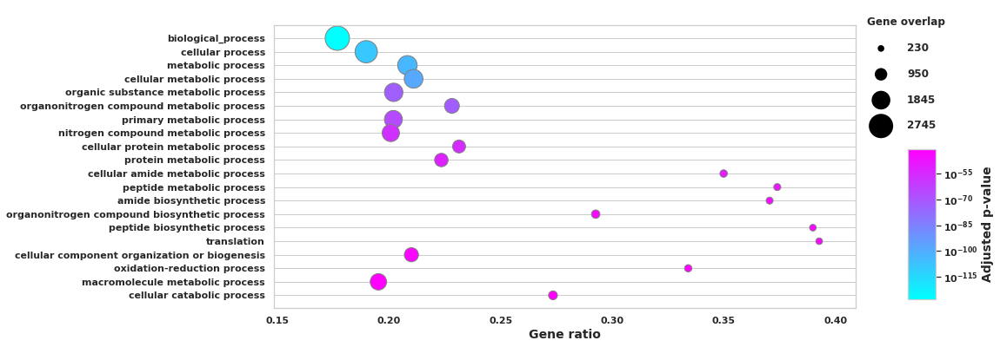

Cluster: 191129_BL_Stress_vs_Ctrl_Astrocytes


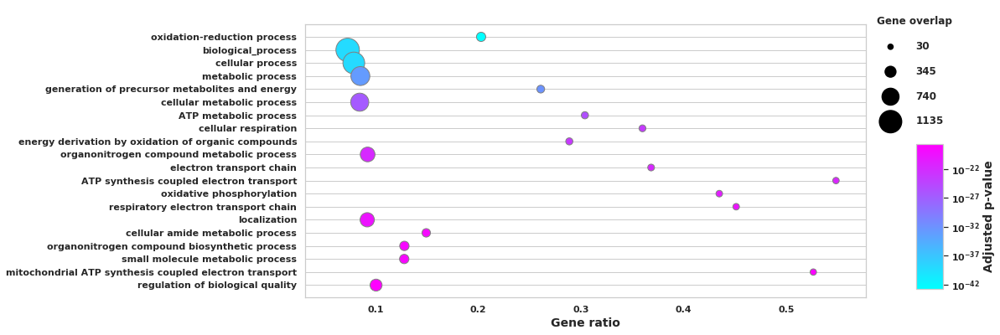

Cluster: 191129_BL_Stress_vs_Ctrl_Neurons_Glutamatergic


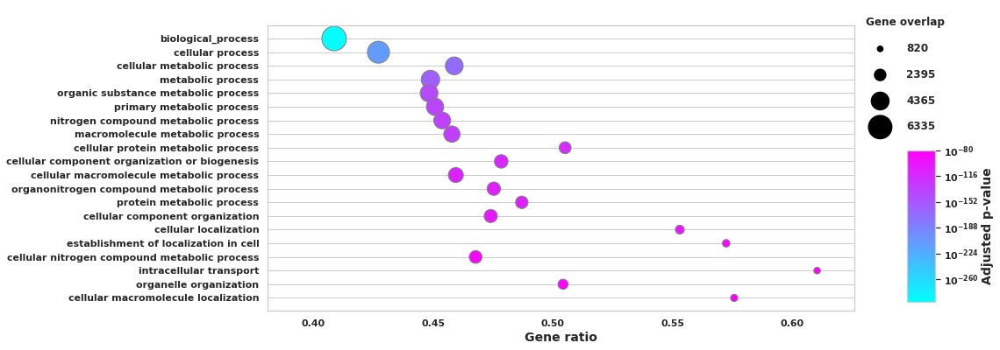

Cluster: 191202_BL_Stress_vs_Ctrl_2


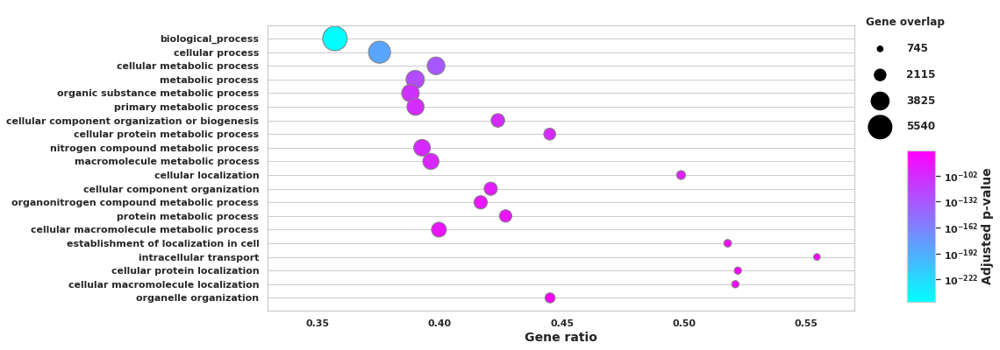

Cluster: 191129_ELS_Stress_vs_Ctrl_Microglia


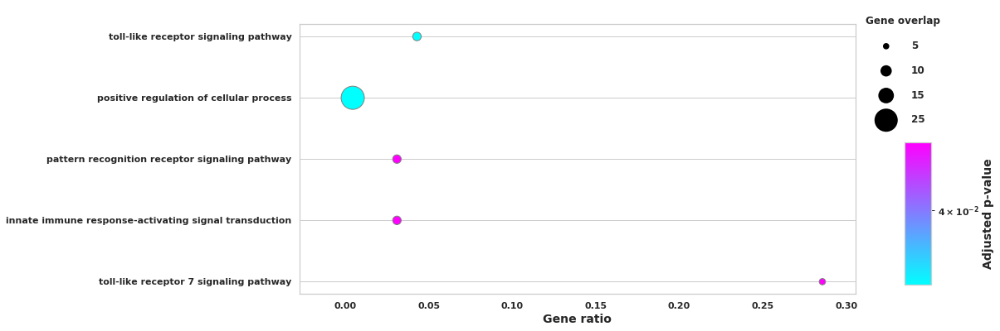

Cluster: 191129_Stress_ELS_vs_BL_Oligodendrocyte Progenitor Cells (OPCs)
Cluster: 191129_ELS_Stress_vs_Ctrl_Macrophages


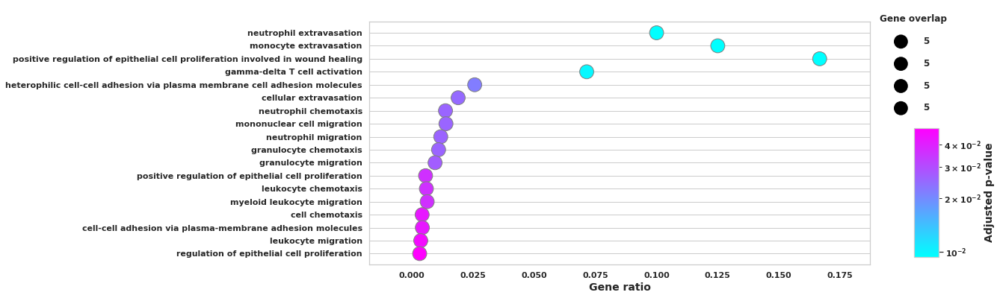

Cluster: 191202_ELS_Stress_vs_Ctrl_19
Cluster: 191129_BL_Stress_vs_Ctrl_Oligodendrocyte Progenitor Cells (OPCs)


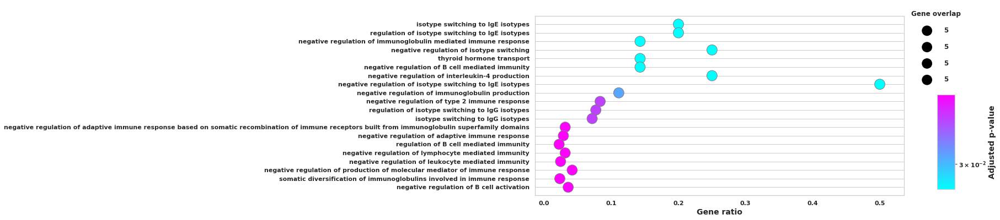

Cluster: 191202_rest_vs_6_neuron_glu


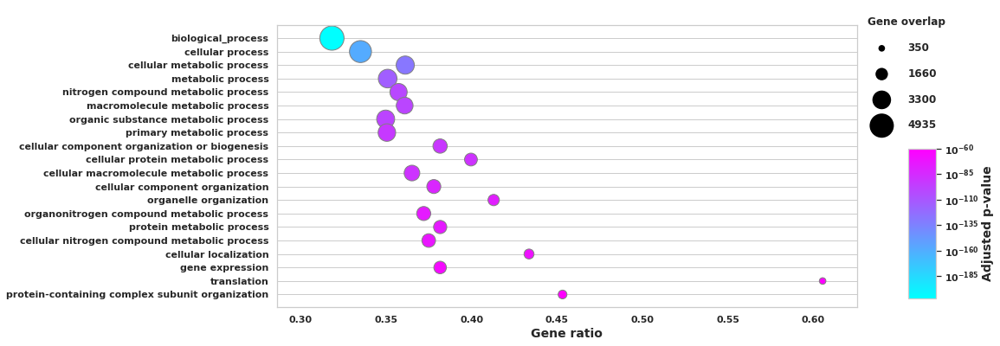

Cluster: 191129_BL_Stress_vs_Ctrl_Neurons_Cajal–Retzius


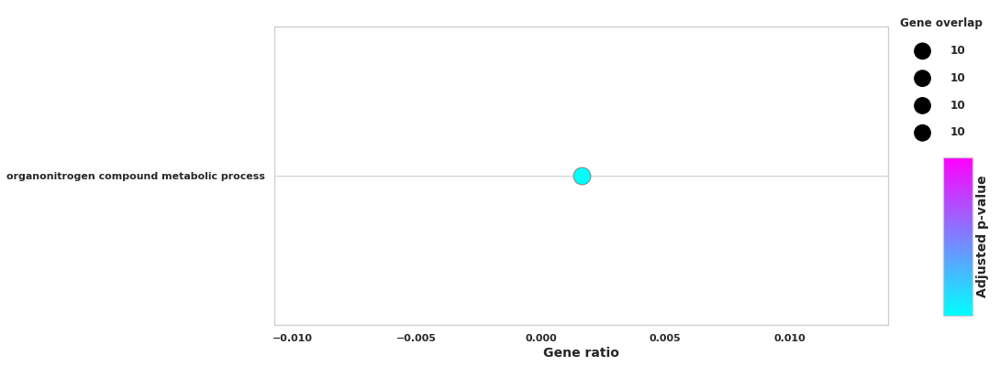

Cluster: 191202_ELS_Stress_vs_Ctrl_10


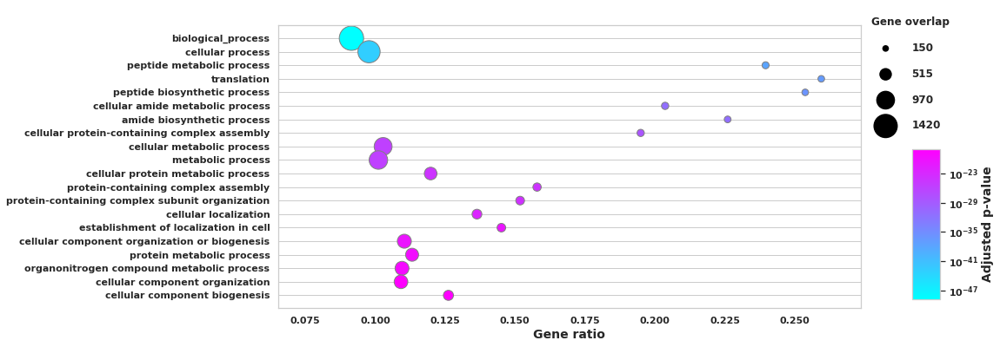

Cluster: 191202_BL_Stress_vs_Ctrl_6


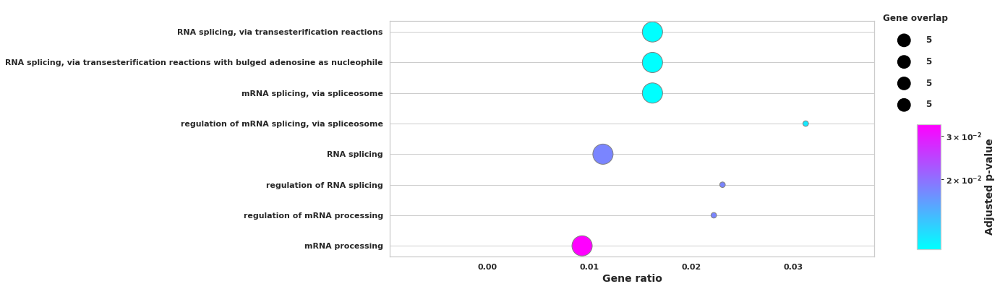

Cluster: 191129_ELS_Stress_vs_Ctrl_Choroid Plexus Epithelial Cells
Cluster: 191129_ELS_Stress_vs_Ctrl_Neurons_Glutamatergic


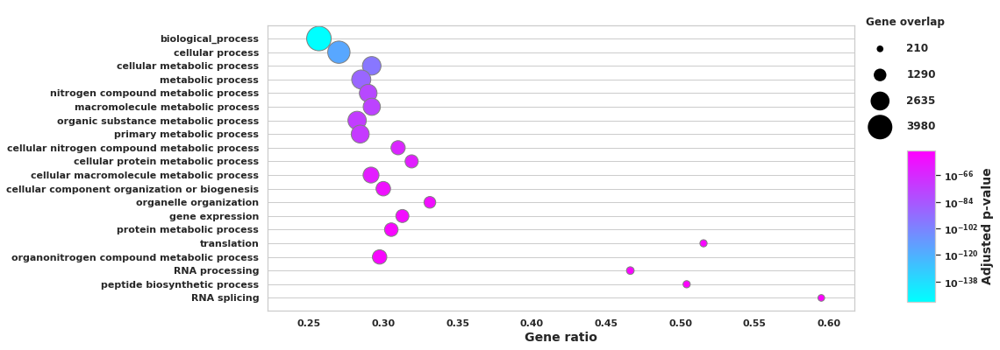

Cluster: 191202_rest_vs_10_neuron_glu


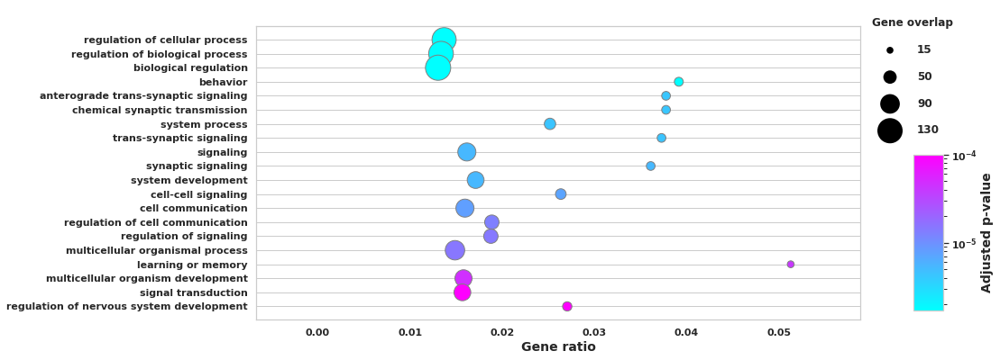

Cluster: 191129_ELS_Stress_vs_Ctrl_Ependymal Cells


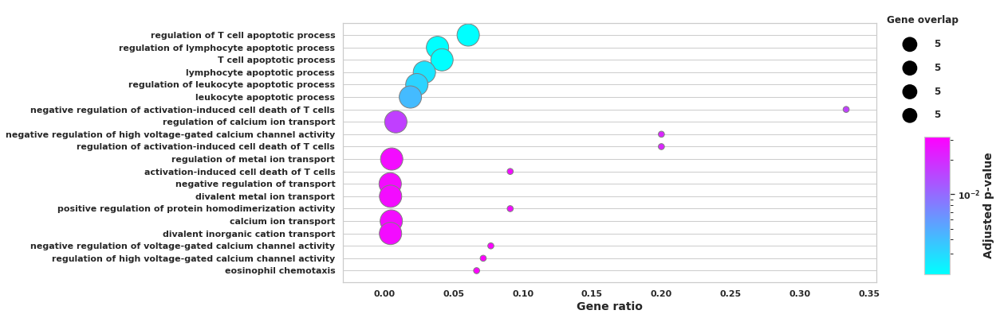

Cluster: 191202_ELS_Stress_vs_Ctrl_2


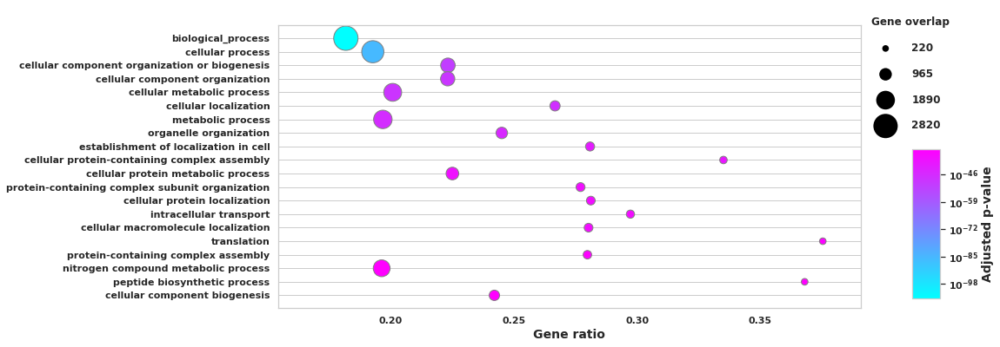

Cluster: 191202_rest_vs_19_neuron_glu


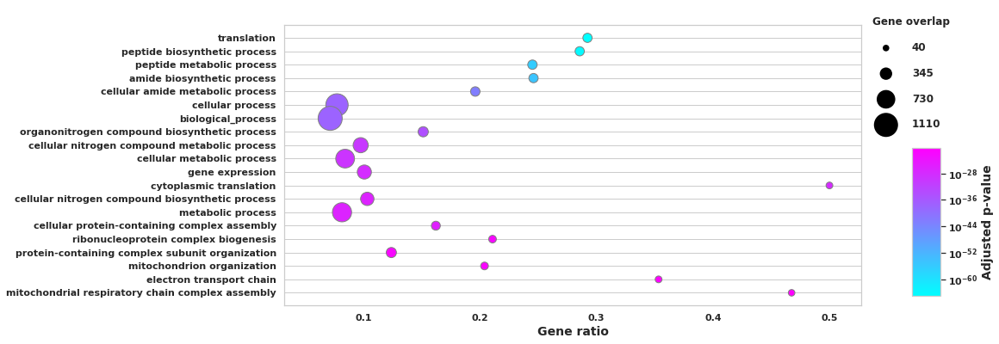

Cluster: 191129_ELS_Stress_vs_Ctrl_Neurons_Cck
Cluster: 191129_Ctrl_ELS_vs_BL_Vascular Cells
Cluster: 191129_Ctrl_ELS_vs_BL_Astrocytes
Cluster: 191129_Stress_ELS_vs_BL_Microglia
Cluster: 191129_Stress_ELS_vs_BL_Astrocytes


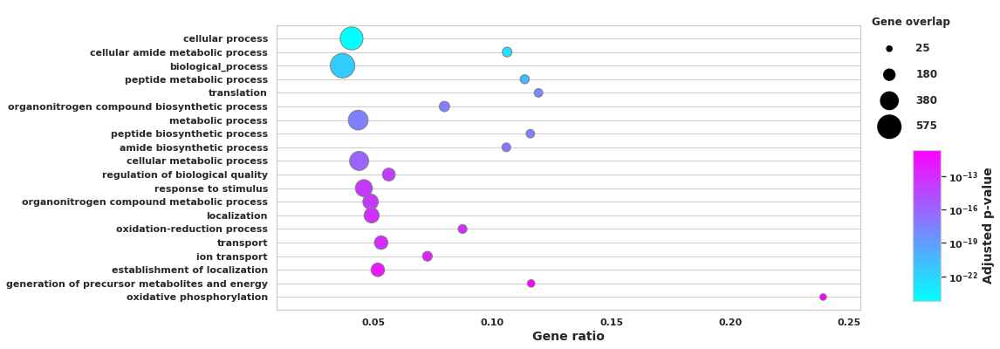

Cluster: 191202_Ctrl_ELS_vs_BL_6


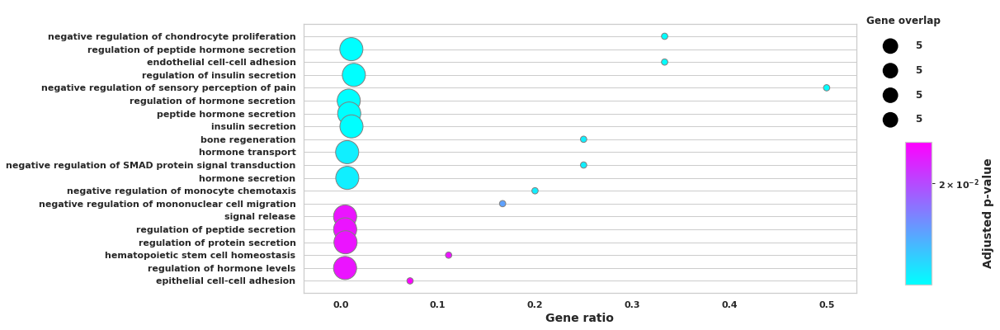

Cluster: 191129_Stress_ELS_vs_BL_Neurons_GABA


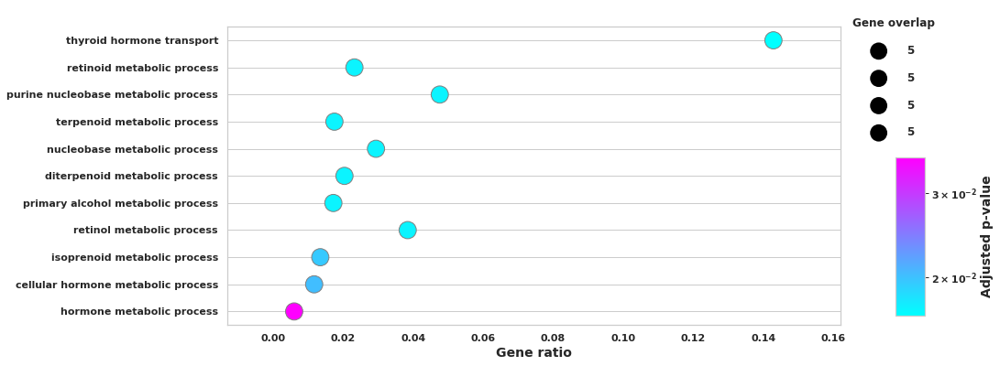

Cluster: 191129_BL_Stress_vs_Ctrl_Microglia
Cluster: 191202_BL_Stress_vs_Ctrl_13


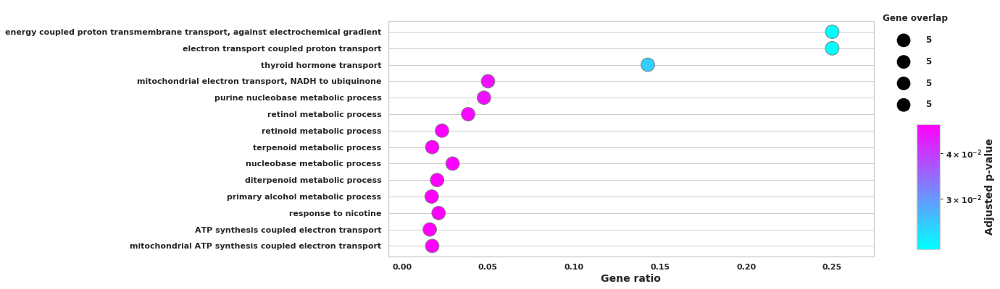

Cluster: 191129_ELS_Stress_vs_Ctrl_Neurons_GABA
Cluster: 191129_ELS_Stress_vs_Ctrl_Oligodendrocytes


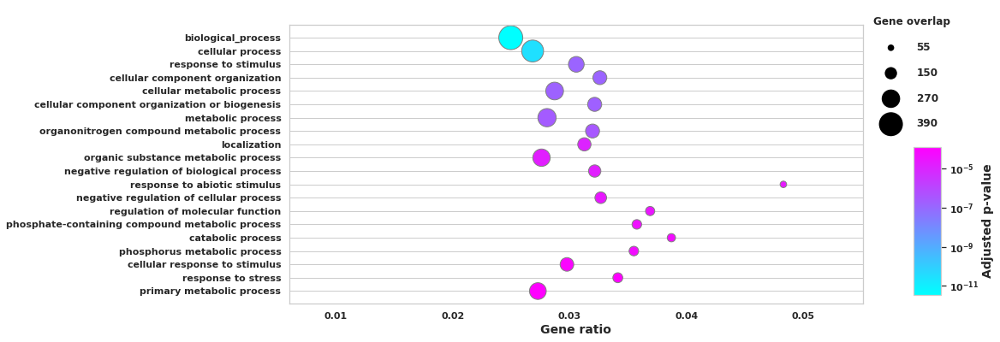

Cluster: 191129_Stress_ELS_vs_BL_Ependymal Cells
Cluster: 191202_rest_vs_12_neuron_glu


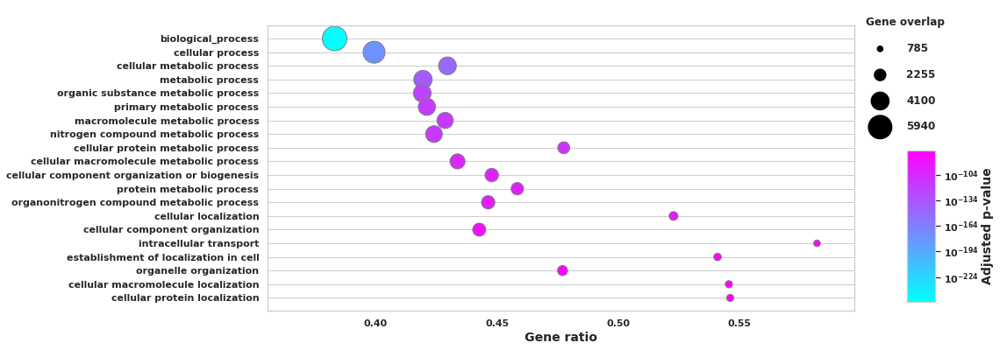

Cluster: 191202_rest_vs_4_neuron_glu


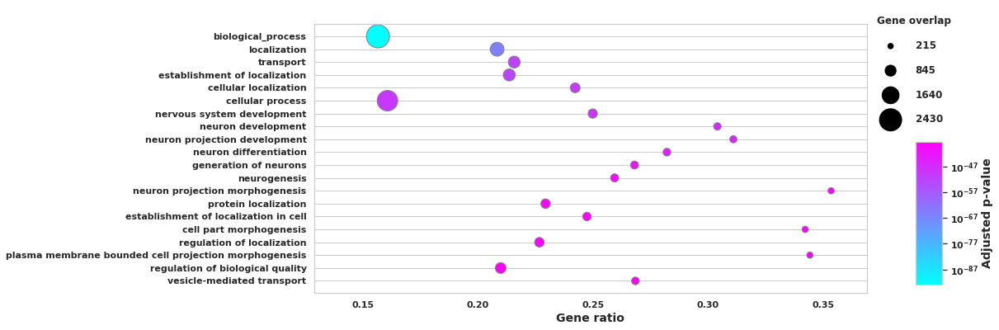

Cluster: 191129_ELS_Stress_vs_Ctrl_Pericytes


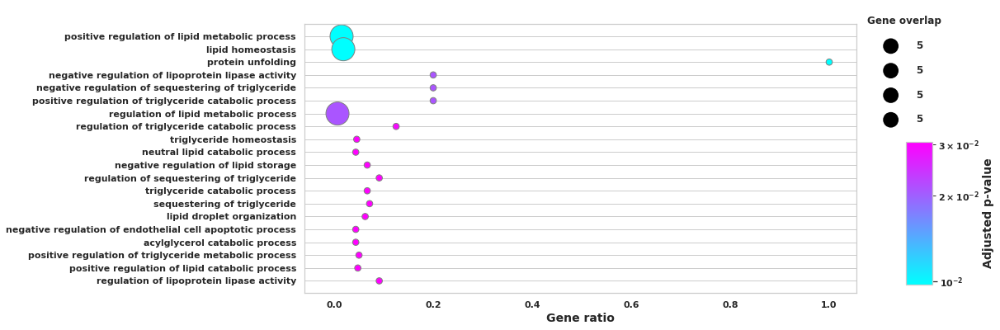

Cluster: 191129_BL_Stress_vs_Ctrl_Endothelial Cells


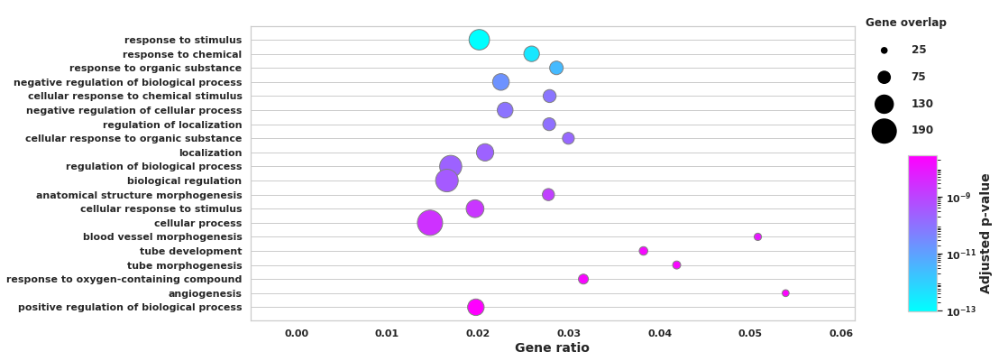

Cluster: 191202_BL_Stress_vs_Ctrl_12


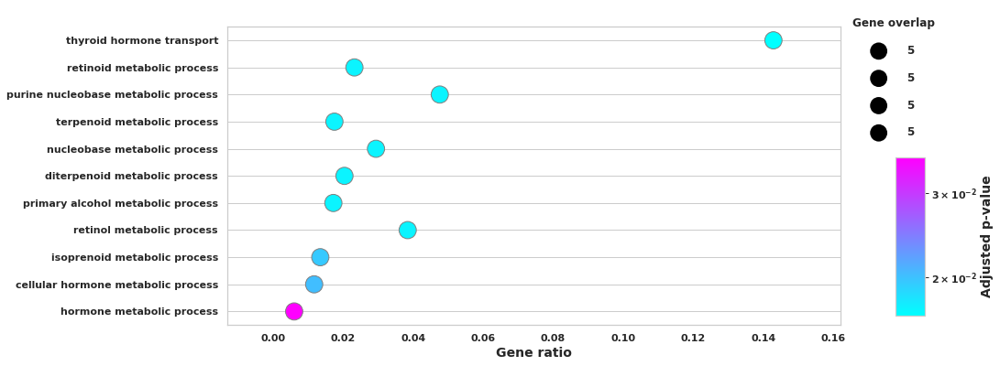

Cluster: 191129_Ctrl_ELS_vs_BL_Meningeal Cells


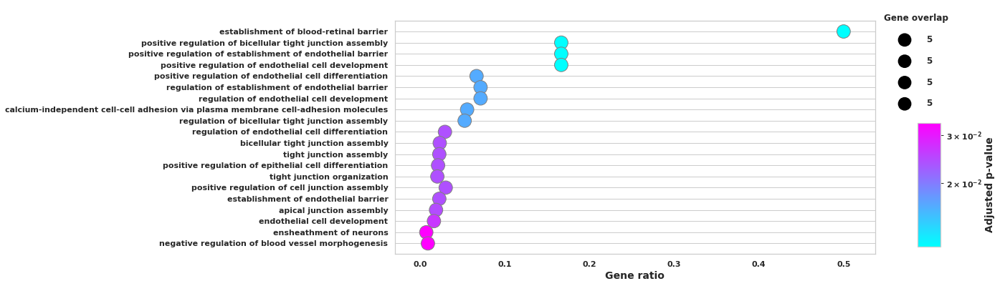

Cluster: 191202_Stress_ELS_vs_BL_6
Cluster: 191129_ELS_Stress_vs_Ctrl_Oligodendrocyte Progenitor Cells (OPCs)


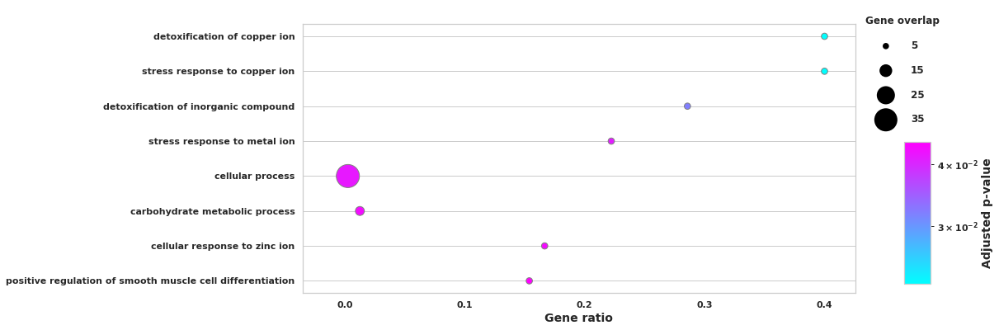

Cluster: 191202_ELS_Stress_vs_Ctrl_4


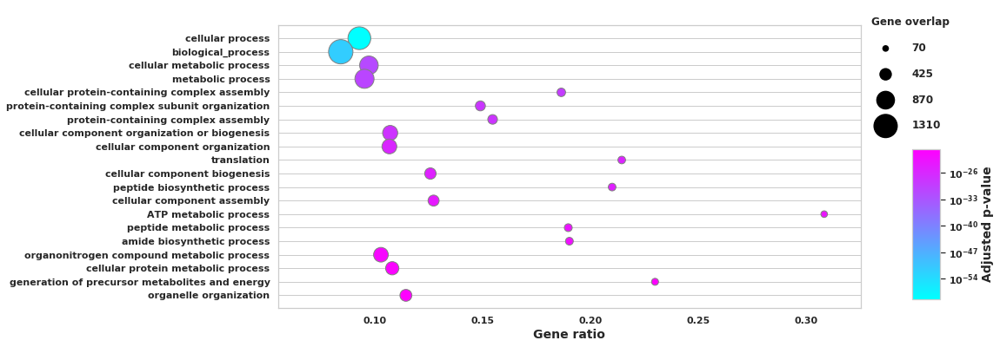

Cluster: 191202_Stress_ELS_vs_BL_12


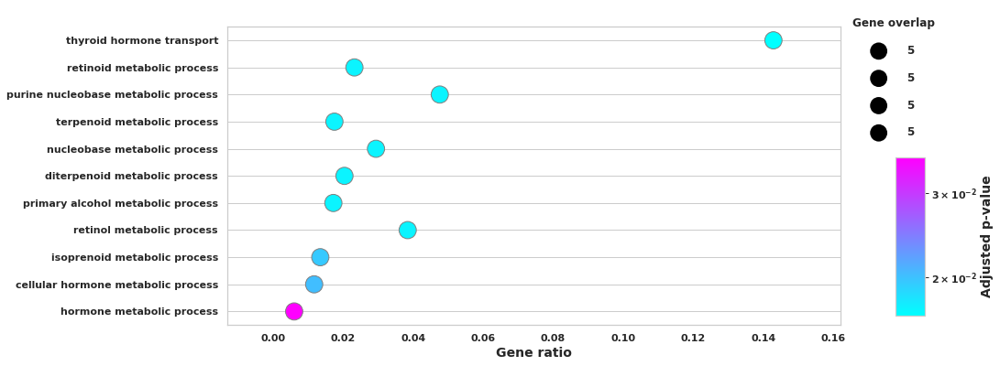

In [140]:
for clust in de_gobp_enrich:
    # Plot the results
    print(f'Cluster: {clust}')
    if len(de_gobp_enrich[clust].values) > 0:
        plot_enrich(de_gobp_enrich[clust])

In [141]:
de_gobp_enrich = dict()

for clust in test_results.keys(): 
    if sum(de_signif[clust]['logFC']<0)>0:
        tmp = gp.profile(organism='mmusculus', sources=['GO:BP'], user_threshold=0.05,
                     significance_threshold_method='fdr', 
                     background=adata.var_names.tolist(),
                     query=de_signif[clust][de_signif[clust]['logFC']<0].index.values.tolist())
    
        if tmp is not None:
            tmp.set_index('native', inplace=True)
            de_gobp_enrich[clust] = tmp.sort_values('p_value').iloc[:,[2,5,7,10,1]]
        else:
            de_gobp_enrich[clust] = pd.DataFrame()
    
        # Print some results
        print(f'Cluster {clust}:')
        de_gobp_enrich[clust].iloc[:50,:]

Cluster 191129_Ctrl_ELS_vs_BL_Endothelial Cells:
Cluster 191202_Ctrl_ELS_vs_BL_4:
Cluster 191202_Stress_ELS_vs_BL_2:
Cluster 191202_Ctrl_ELS_vs_BL_10:
Cluster 191129_Stress_ELS_vs_BL_Neurons_Glutamatergic:
Cluster 191129_Ctrl_ELS_vs_BL_Neurons_Glutamatergic:
Cluster 191202_rest_vs_2_neuron_glu:
Cluster 191202_rest_vs_13_neuron_glu:
Cluster 191202_rest_vs_28_neuron_glu:
Cluster 191129_BL_Stress_vs_Ctrl_Oligodendrocytes:
Cluster 191129_BL_Stress_vs_Ctrl_Macrophages:
Cluster 191202_ELS_Stress_vs_Ctrl_6:
Cluster 191202_Stress_ELS_vs_BL_10:
Cluster 191129_ELS_Stress_vs_Ctrl_Endothelial Cells:
Cluster 191202_Stress_ELS_vs_BL_4:
Cluster 191129_ELS_Stress_vs_Ctrl_Astrocytes:
Cluster 191129_Stress_ELS_vs_BL_Endothelial Cells:
Cluster 191202_Ctrl_ELS_vs_BL_2:
Cluster 191129_Ctrl_ELS_vs_BL_Oligodendrocytes:
Cluster 191129_Stress_ELS_vs_BL_Oligodendrocytes:
Cluster 191129_BL_Stress_vs_Ctrl_Choroid Plexus Epithelial Cells:
Cluster 191129_Ctrl_ELS_vs_BL_Choroid Plexus Epithelial Cells:
Cluster 19112

Cluster: 191202_Ctrl_ELS_vs_BL_4
Cluster: 191202_Stress_ELS_vs_BL_2


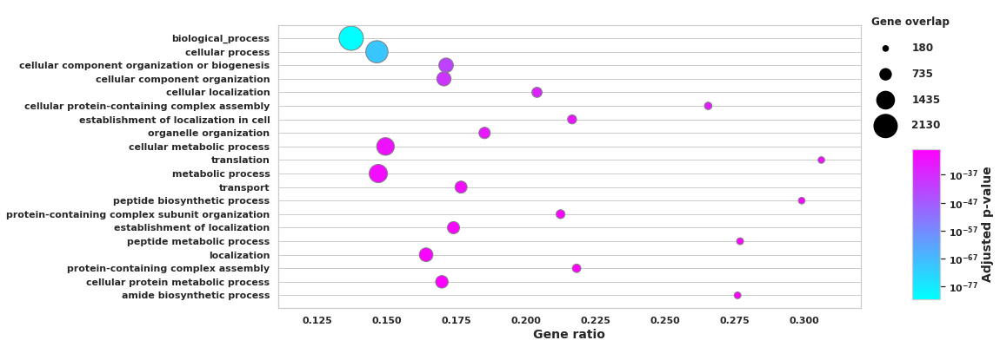

Cluster: 191129_Stress_ELS_vs_BL_Neurons_Glutamatergic


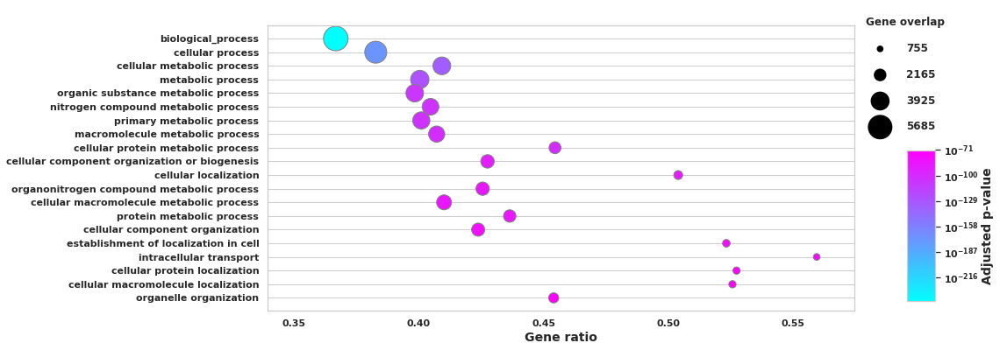

Cluster: 191129_Stress_ELS_vs_BL_Neural Progenitor Cells (NPCs)


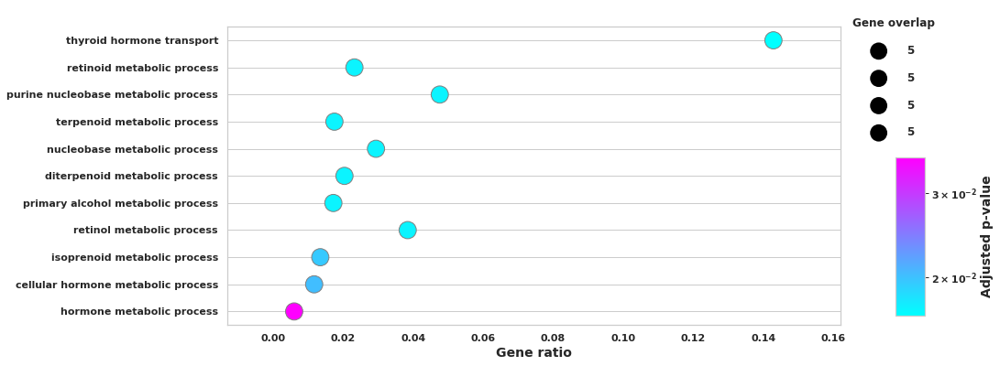

Cluster: 191129_BL_Stress_vs_Ctrl_Neurons_Cck


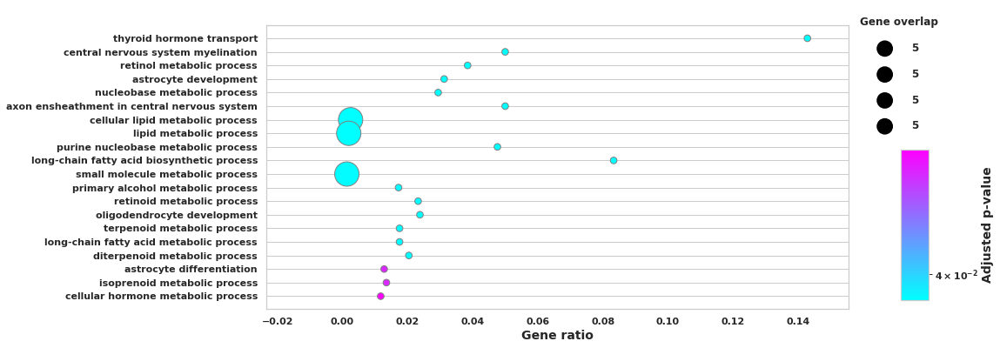

Cluster: 191129_Ctrl_ELS_vs_BL_Neurons_Glutamatergic


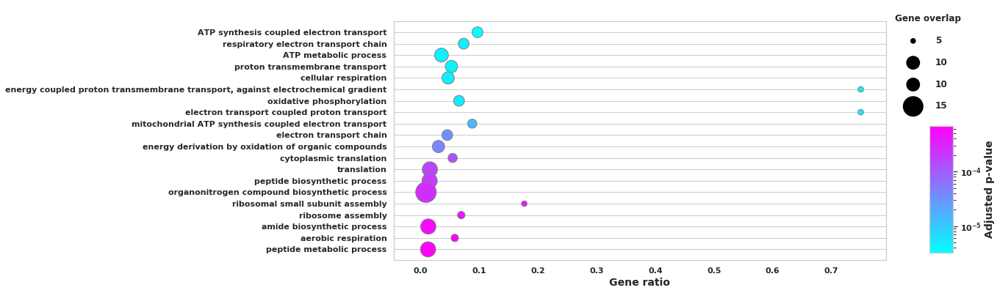

Cluster: 191202_BL_Stress_vs_Ctrl_4


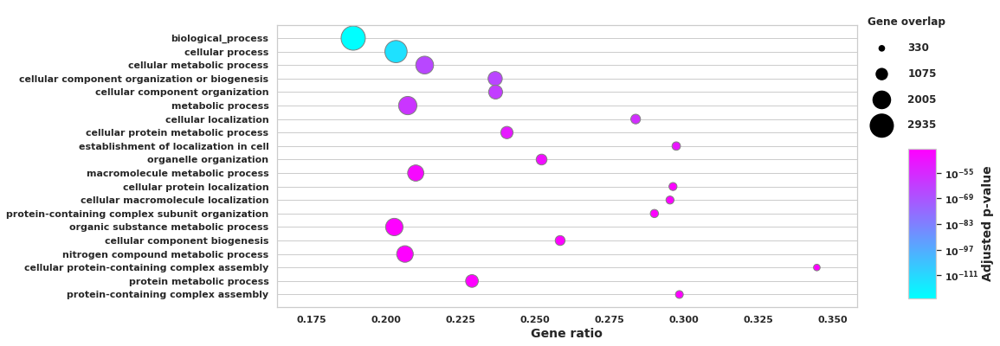

Cluster: 191202_rest_vs_2_neuron_glu


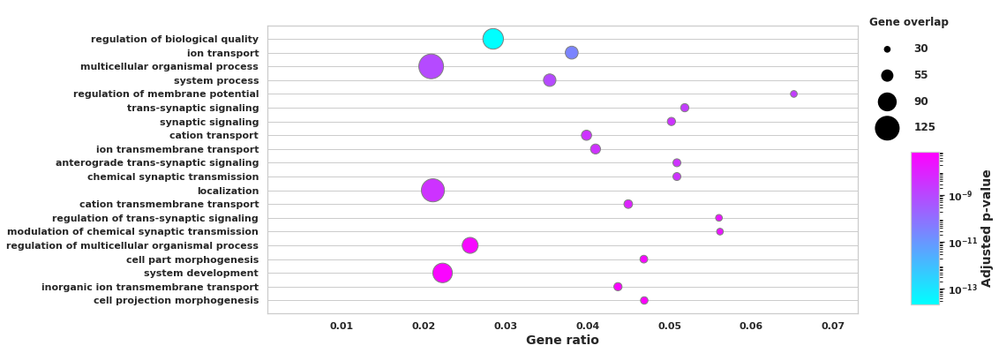

Cluster: 191202_rest_vs_13_neuron_glu


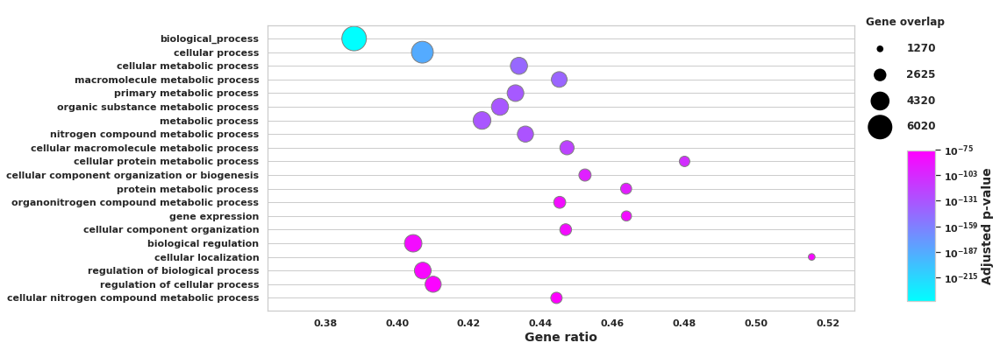

Cluster: 191202_ELS_Stress_vs_Ctrl_12


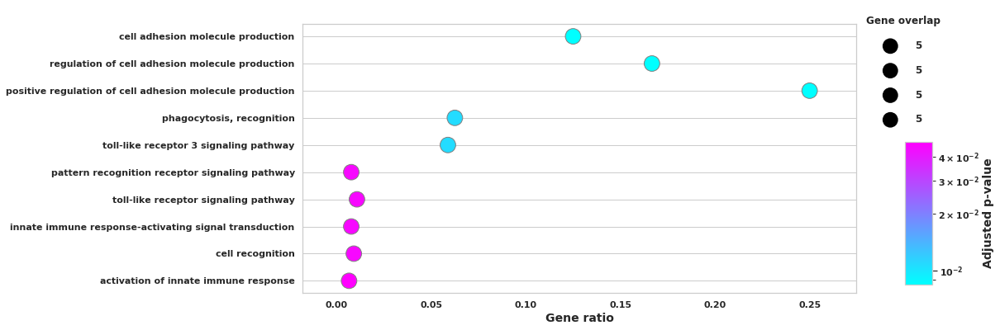

Cluster: 191202_rest_vs_28_neuron_glu


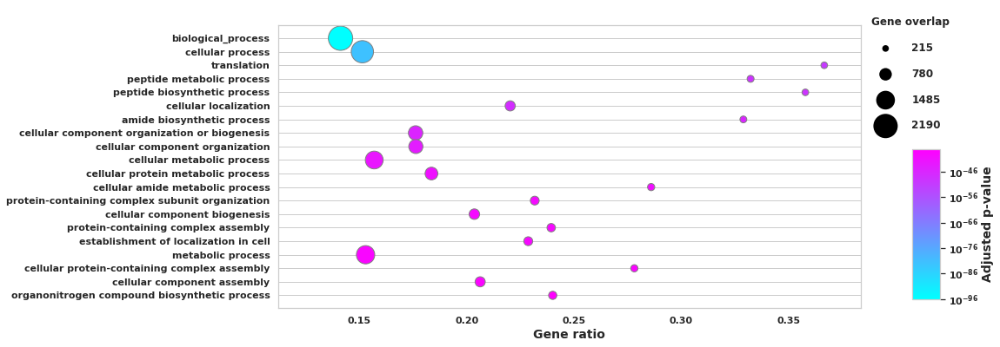

Cluster: 191129_BL_Stress_vs_Ctrl_Oligodendrocytes


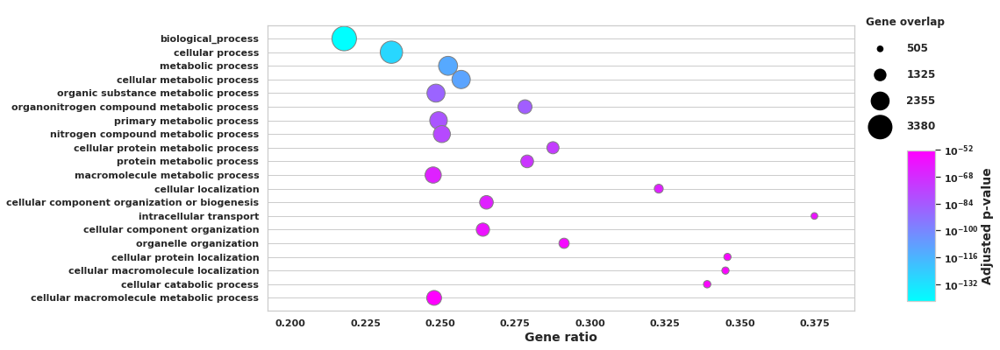

Cluster: 191202_ELS_Stress_vs_Ctrl_6


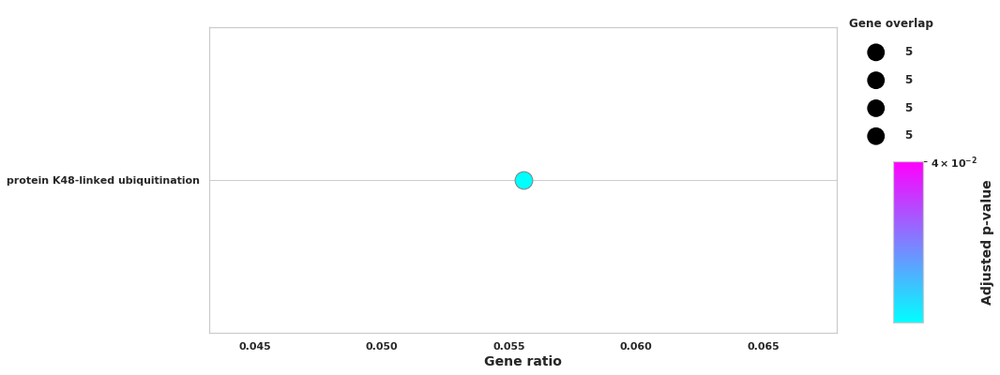

Cluster: 191202_Stress_ELS_vs_BL_10


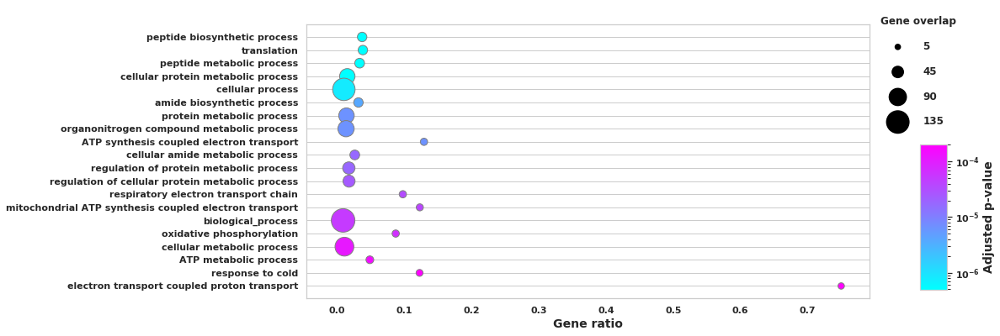

Cluster: 191129_BL_Stress_vs_Ctrl_Neurons_GABA


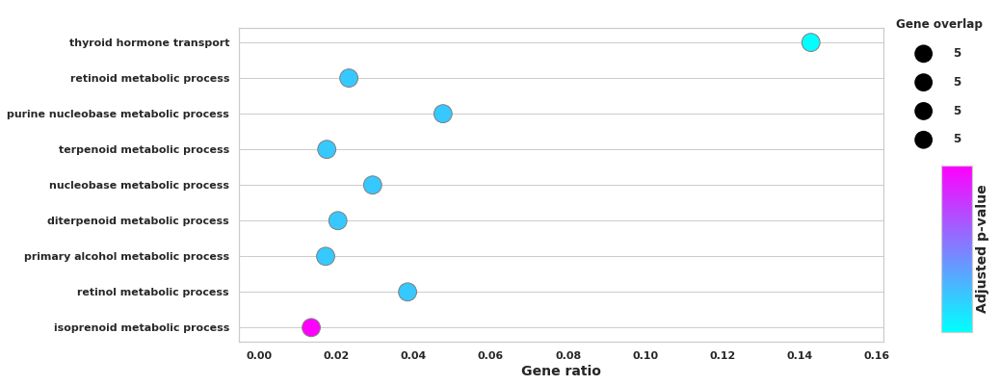

Cluster: 191129_ELS_Stress_vs_Ctrl_Meningeal Cells


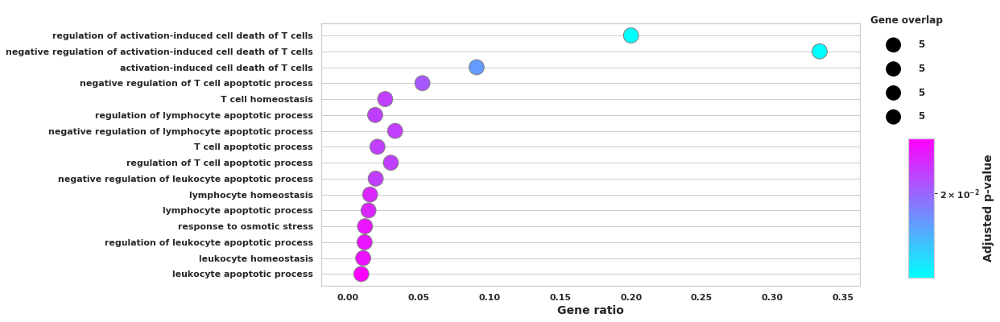

Cluster: 191202_Stress_ELS_vs_BL_19
Cluster: 191129_ELS_Stress_vs_Ctrl_Endothelial Cells


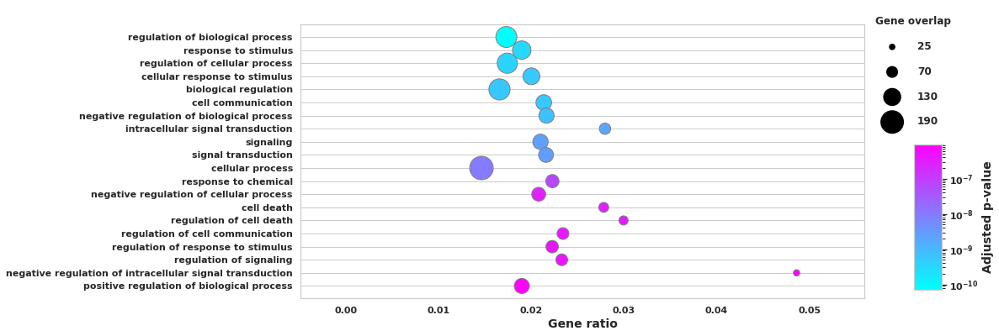

Cluster: 191202_Stress_ELS_vs_BL_4


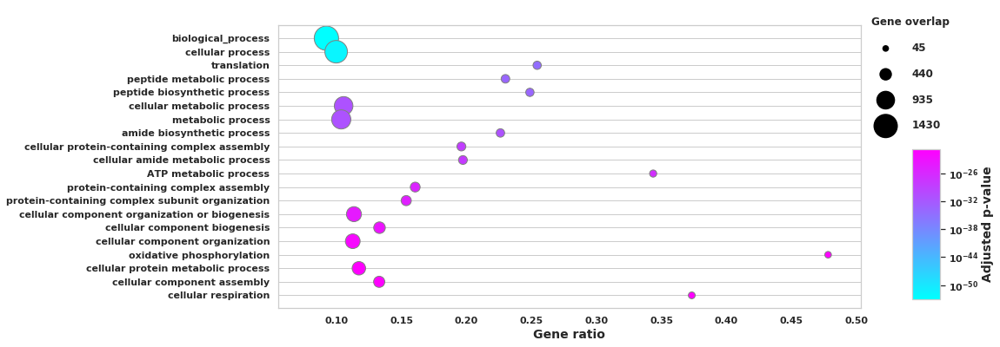

Cluster: 191129_ELS_Stress_vs_Ctrl_Astrocytes


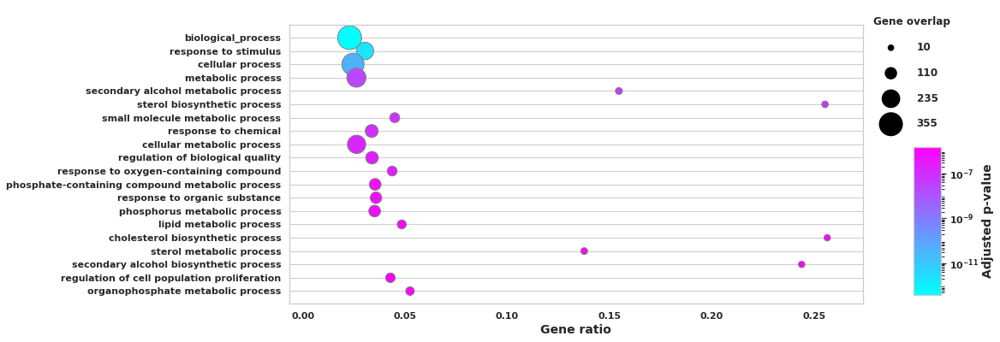

Cluster: 191129_Stress_ELS_vs_BL_Endothelial Cells


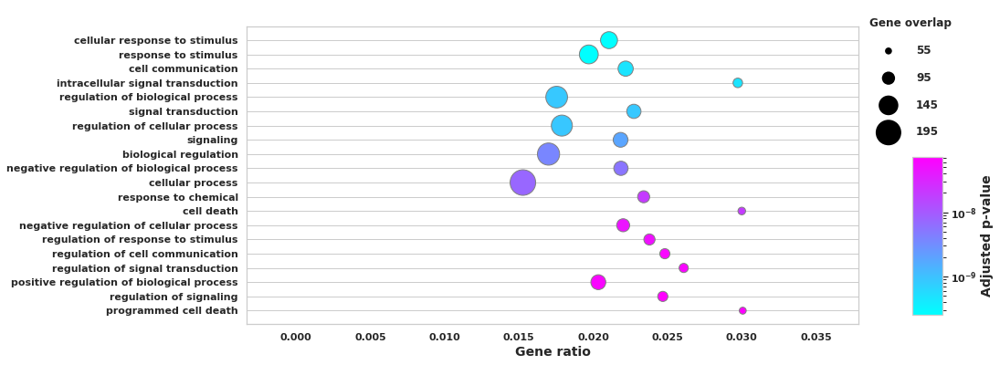

Cluster: 191202_Ctrl_ELS_vs_BL_2


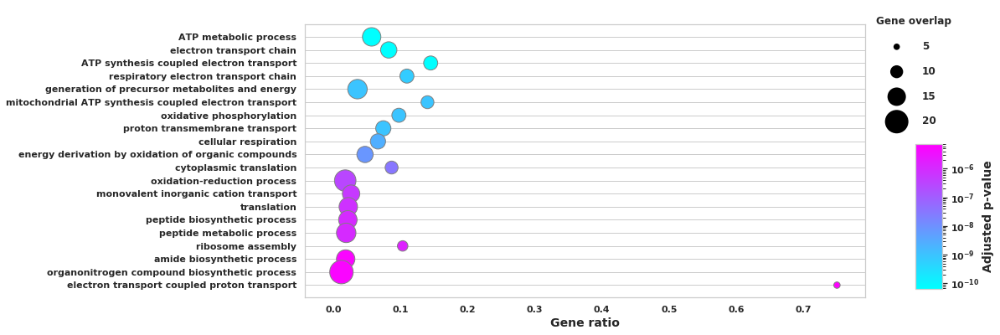

Cluster: 191202_BL_Stress_vs_Ctrl_19


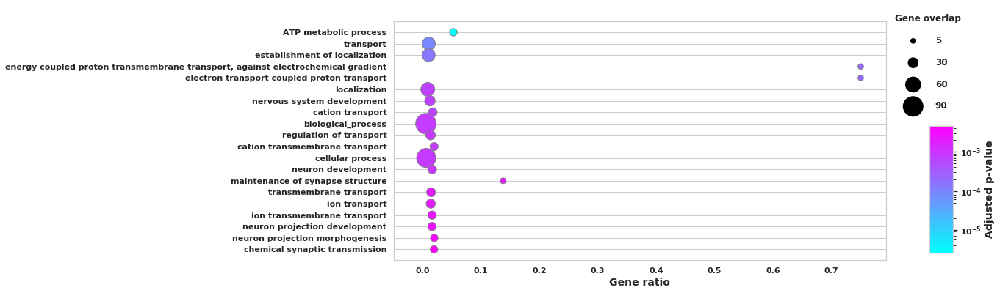

Cluster: 191129_Ctrl_ELS_vs_BL_Oligodendrocytes
Cluster: 191129_Stress_ELS_vs_BL_Oligodendrocytes


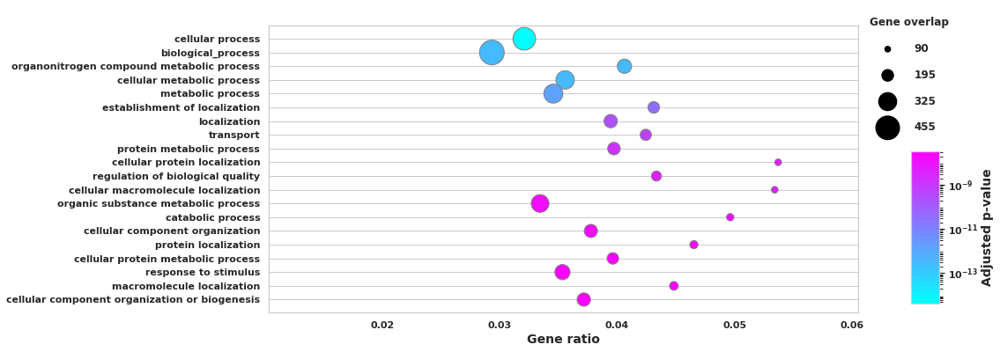

Cluster: 191202_BL_Stress_vs_Ctrl_10


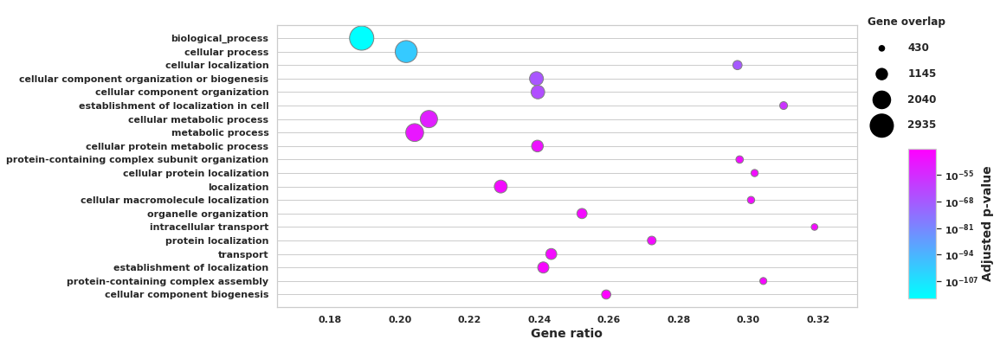

Cluster: 191129_BL_Stress_vs_Ctrl_Choroid Plexus Epithelial Cells


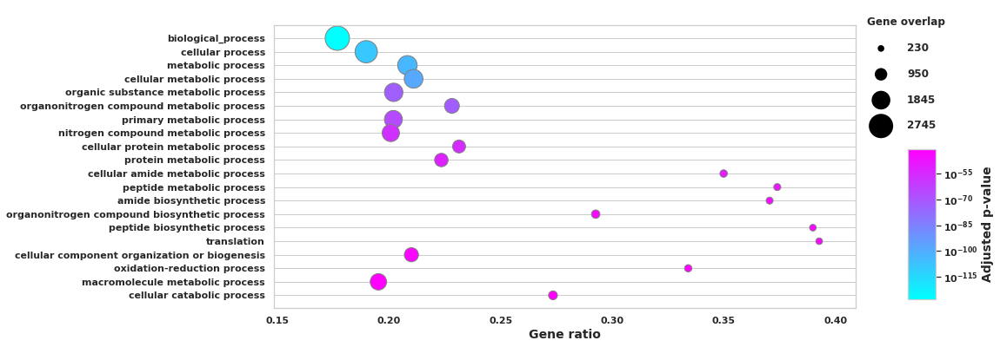

Cluster: 191129_BL_Stress_vs_Ctrl_Astrocytes


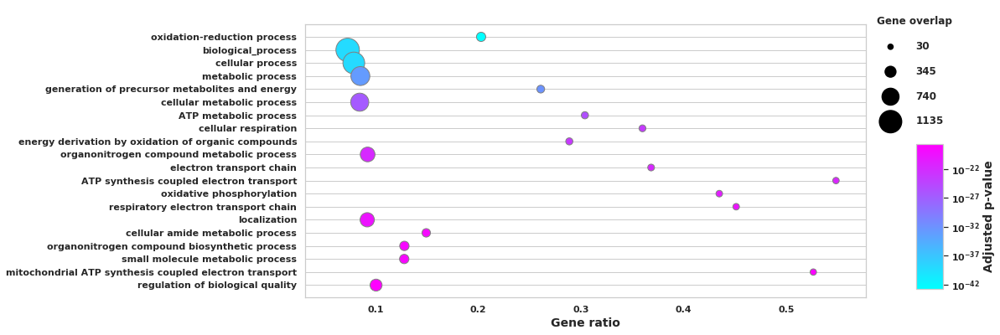

Cluster: 191129_BL_Stress_vs_Ctrl_Neurons_Glutamatergic


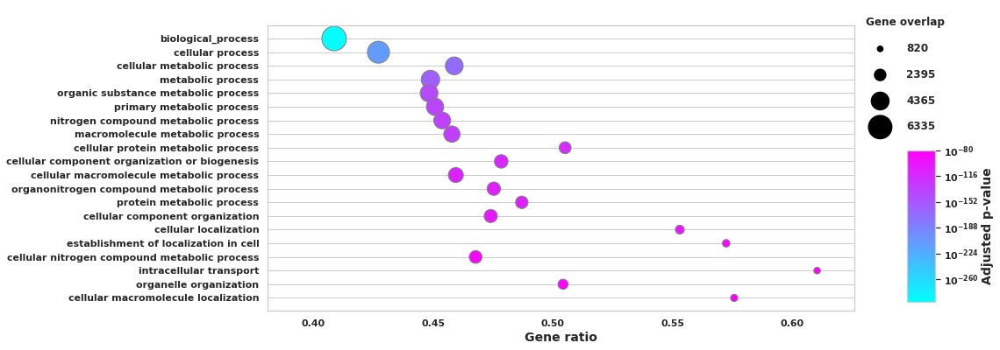

Cluster: 191202_BL_Stress_vs_Ctrl_2


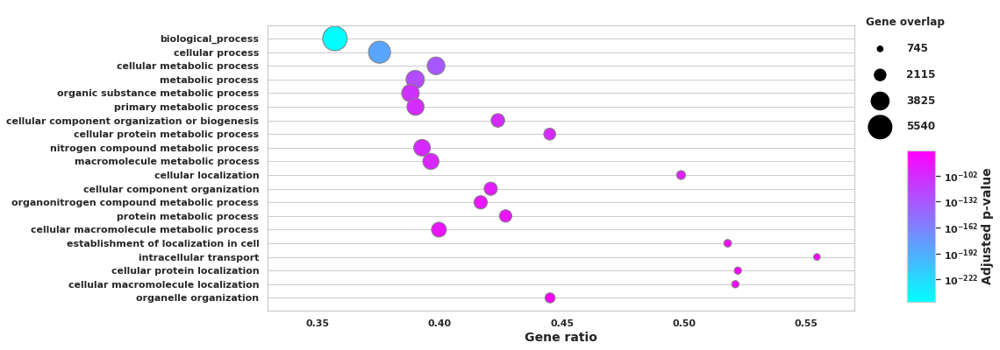

Cluster: 191129_ELS_Stress_vs_Ctrl_Microglia


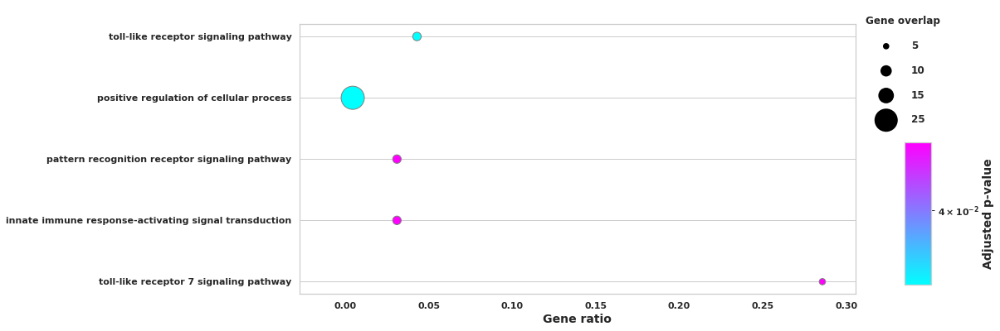

Cluster: 191129_Stress_ELS_vs_BL_Oligodendrocyte Progenitor Cells (OPCs)
Cluster: 191129_ELS_Stress_vs_Ctrl_Macrophages


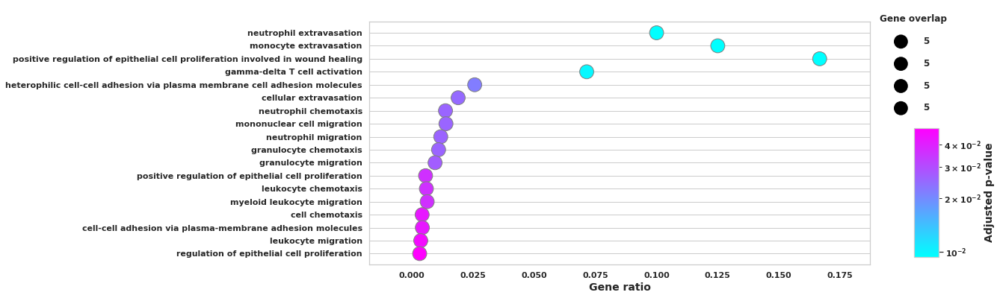

Cluster: 191202_ELS_Stress_vs_Ctrl_19
Cluster: 191129_BL_Stress_vs_Ctrl_Oligodendrocyte Progenitor Cells (OPCs)


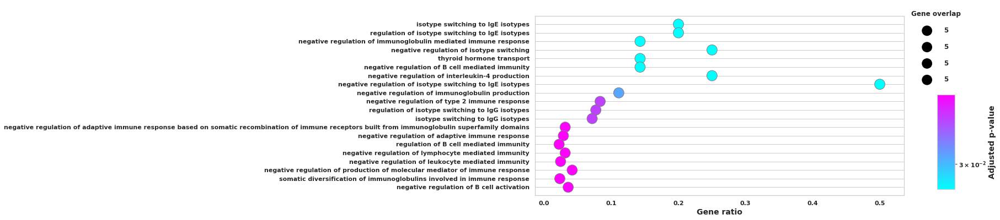

Cluster: 191202_rest_vs_6_neuron_glu


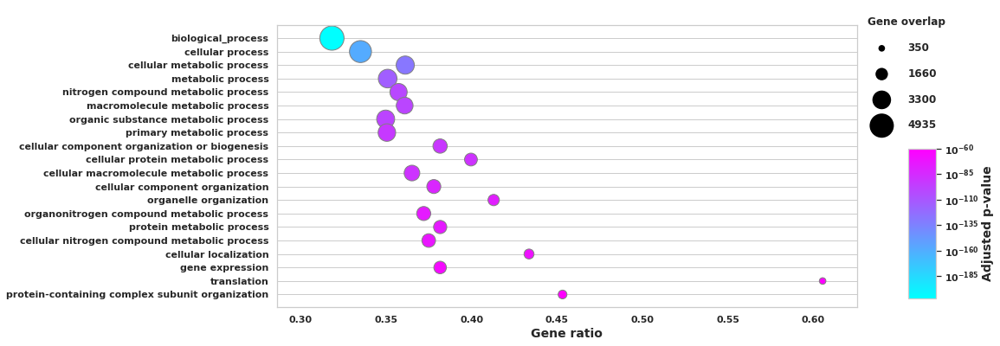

Cluster: 191129_BL_Stress_vs_Ctrl_Neurons_Cajal–Retzius


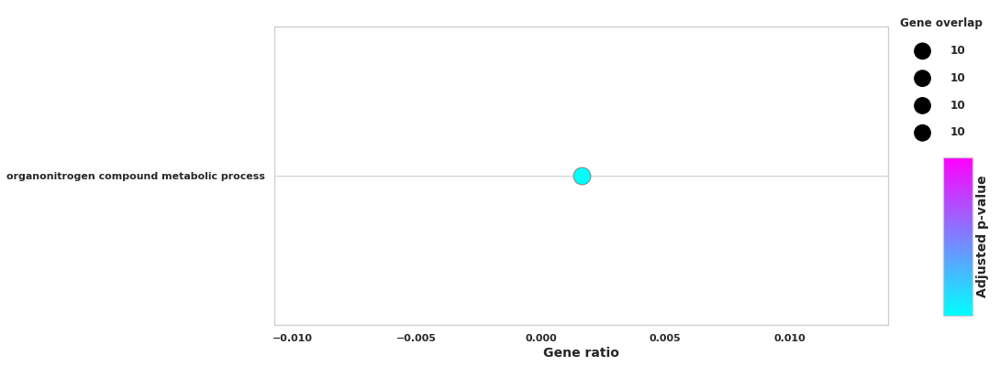

Cluster: 191202_ELS_Stress_vs_Ctrl_10


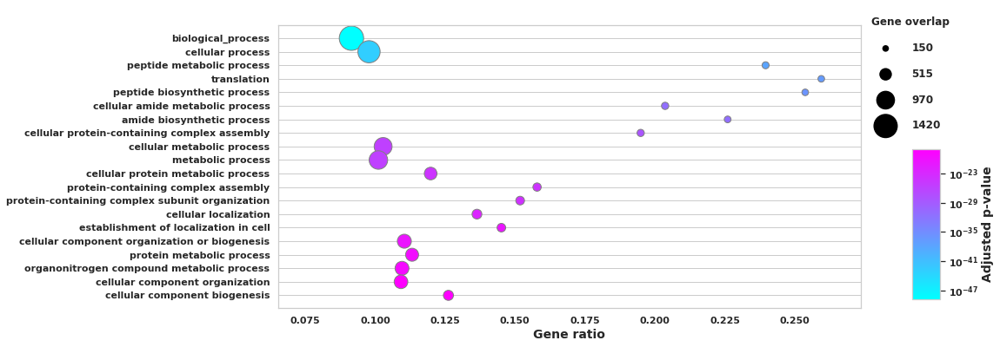

Cluster: 191202_BL_Stress_vs_Ctrl_6


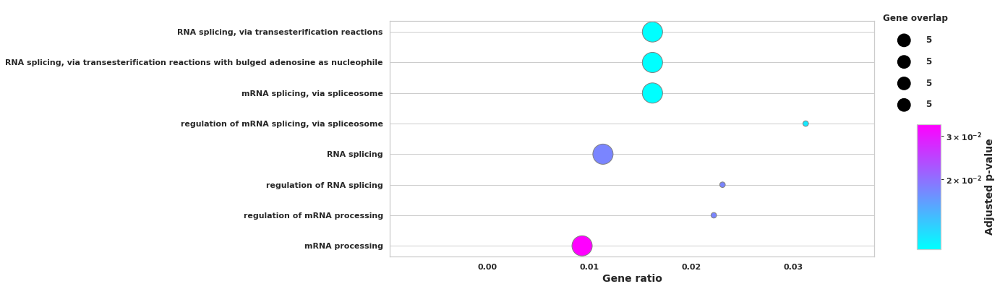

Cluster: 191129_ELS_Stress_vs_Ctrl_Choroid Plexus Epithelial Cells
Cluster: 191129_ELS_Stress_vs_Ctrl_Neurons_Glutamatergic


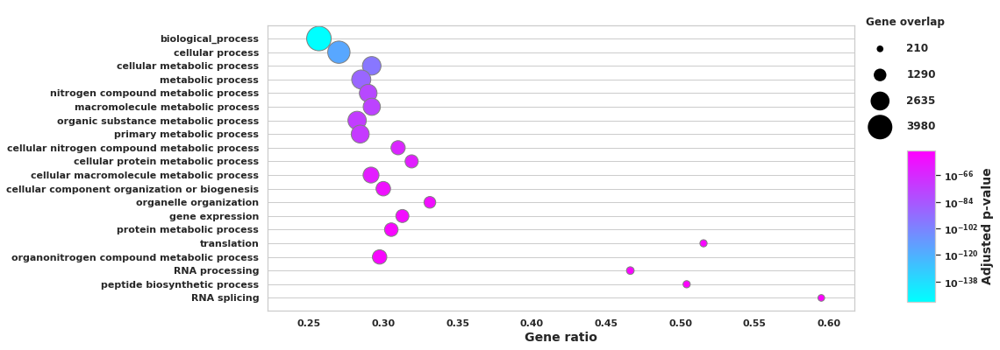

Cluster: 191202_rest_vs_10_neuron_glu


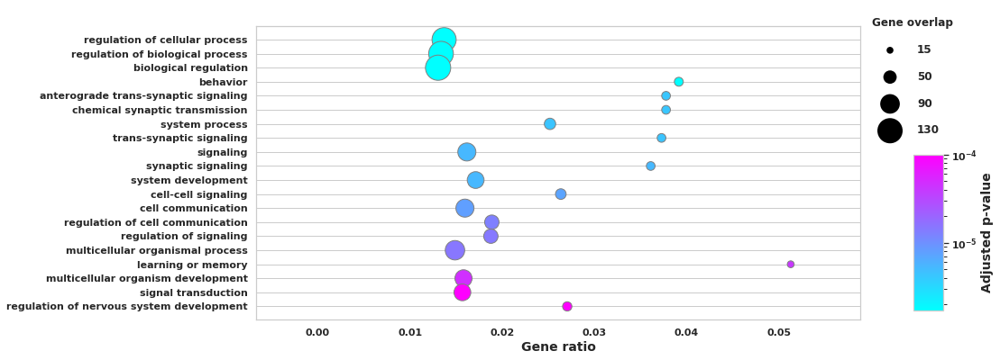

Cluster: 191129_ELS_Stress_vs_Ctrl_Ependymal Cells


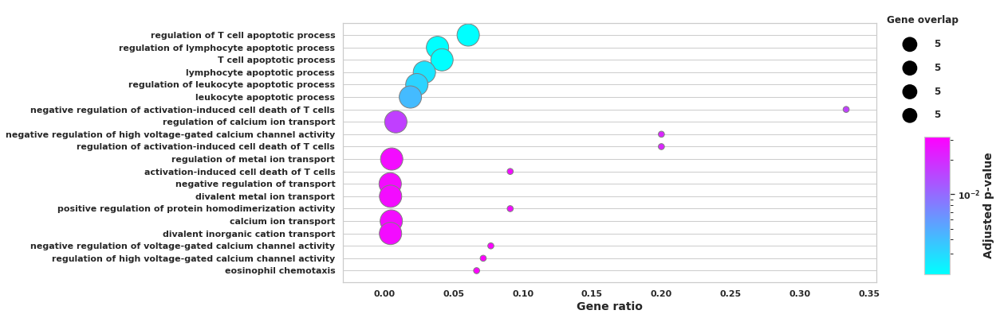

Cluster: 191202_ELS_Stress_vs_Ctrl_2


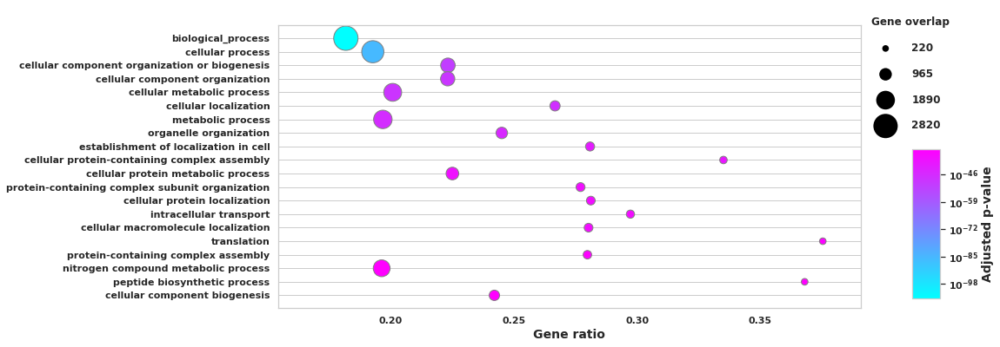

Cluster: 191202_rest_vs_19_neuron_glu


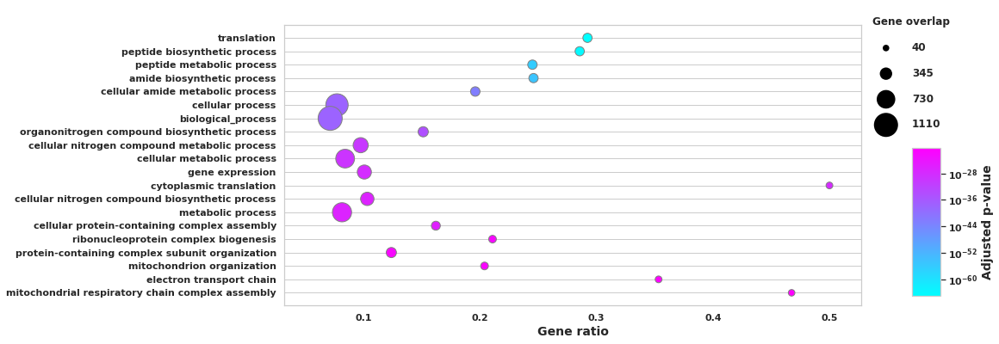

Cluster: 191129_ELS_Stress_vs_Ctrl_Neurons_Cck
Cluster: 191129_Ctrl_ELS_vs_BL_Vascular Cells
Cluster: 191129_Ctrl_ELS_vs_BL_Astrocytes
Cluster: 191129_Stress_ELS_vs_BL_Microglia
Cluster: 191129_Stress_ELS_vs_BL_Astrocytes


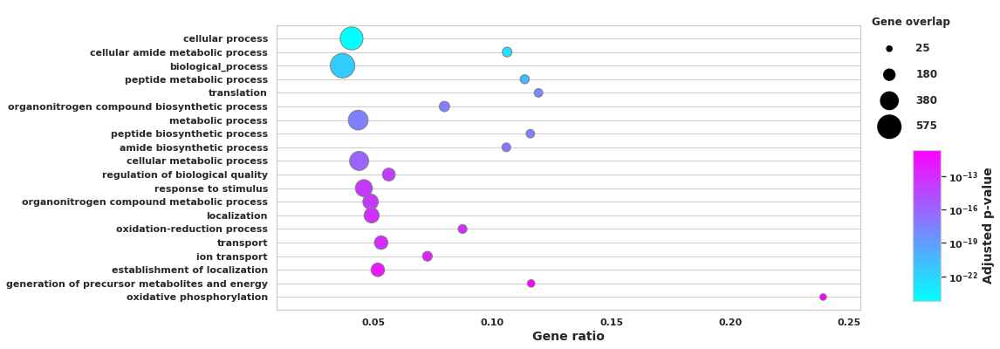

Cluster: 191202_Ctrl_ELS_vs_BL_6


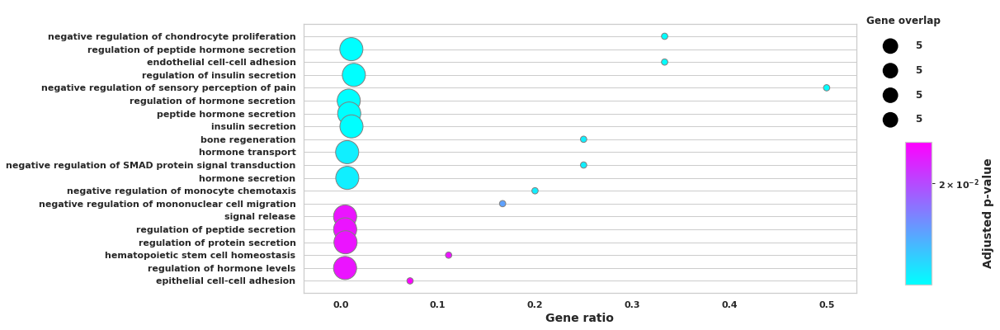

Cluster: 191129_Stress_ELS_vs_BL_Neurons_GABA


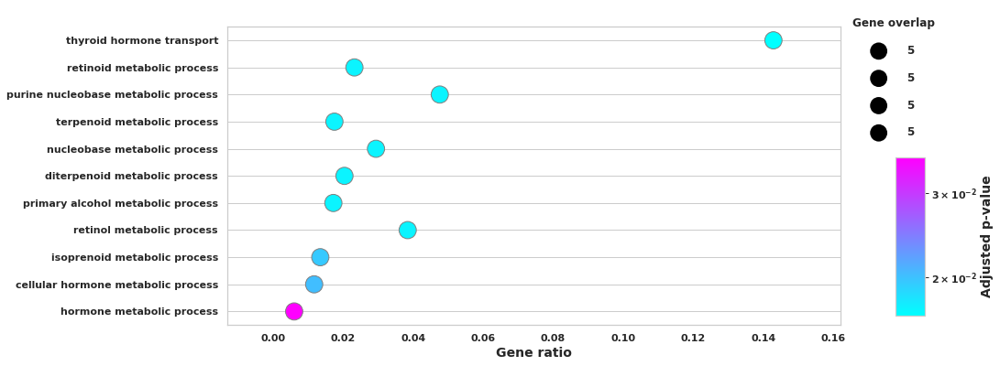

Cluster: 191129_BL_Stress_vs_Ctrl_Microglia
Cluster: 191202_BL_Stress_vs_Ctrl_13


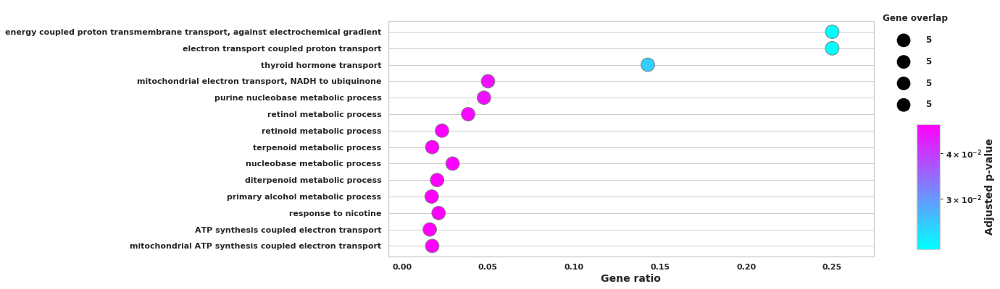

Cluster: 191129_ELS_Stress_vs_Ctrl_Neurons_GABA
Cluster: 191129_ELS_Stress_vs_Ctrl_Oligodendrocytes


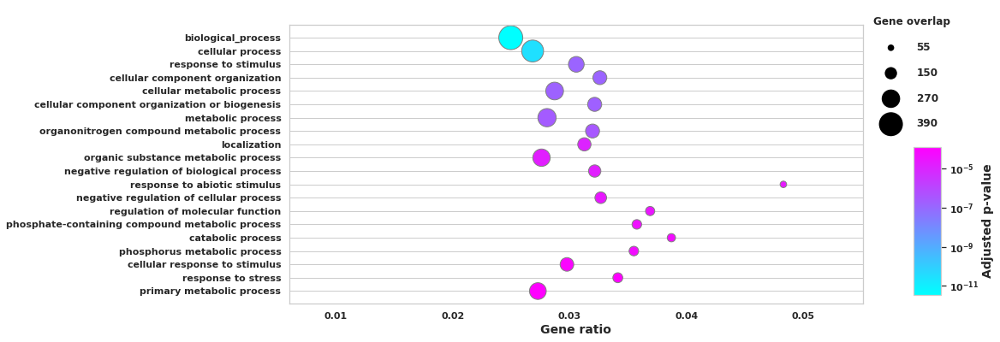

Cluster: 191129_Stress_ELS_vs_BL_Ependymal Cells
Cluster: 191202_rest_vs_12_neuron_glu


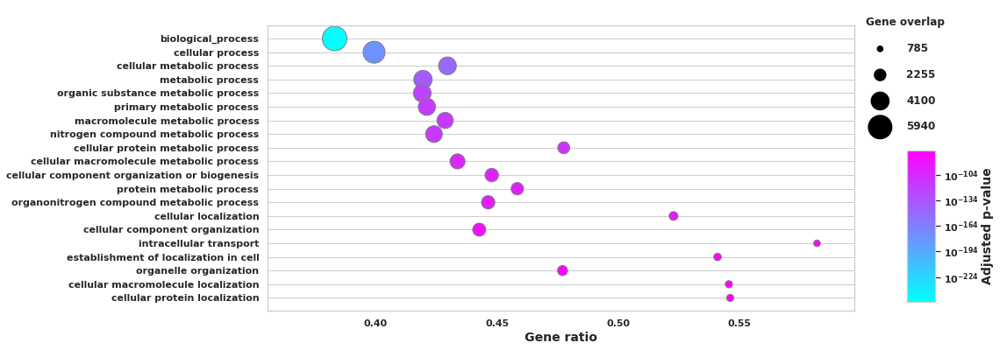

Cluster: 191202_rest_vs_4_neuron_glu


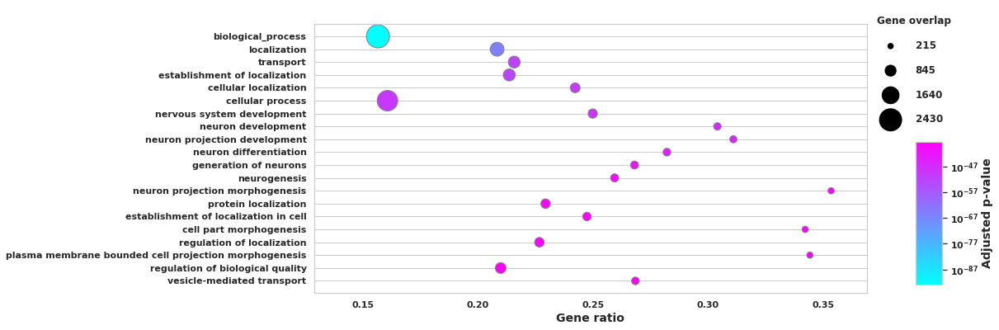

Cluster: 191129_ELS_Stress_vs_Ctrl_Pericytes


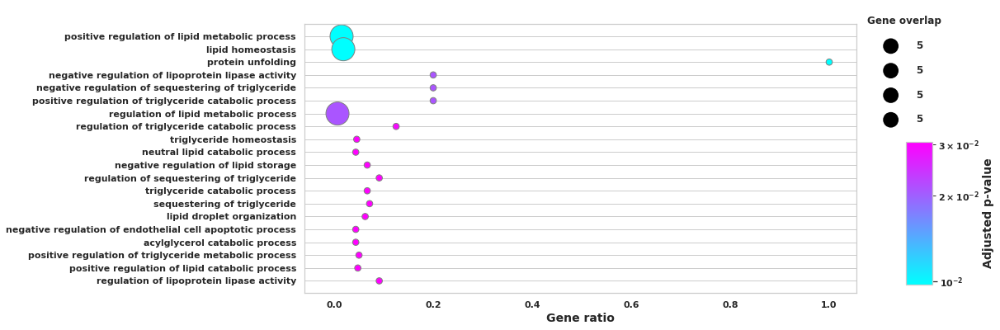

Cluster: 191129_BL_Stress_vs_Ctrl_Endothelial Cells


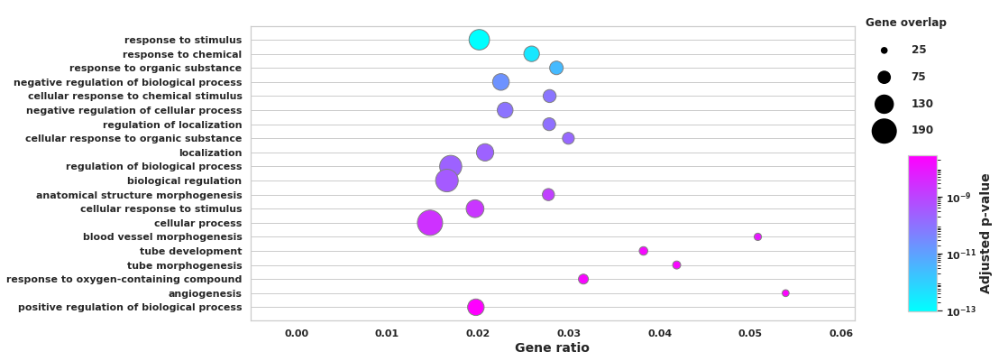

Cluster: 191202_BL_Stress_vs_Ctrl_12


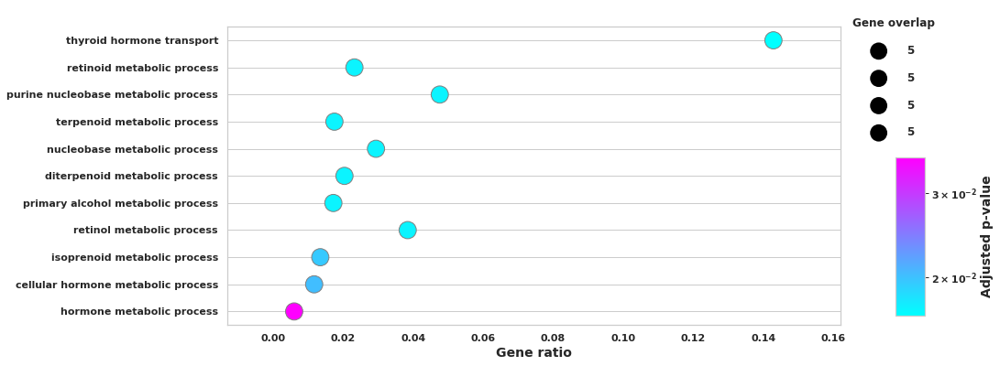

Cluster: 191129_Ctrl_ELS_vs_BL_Meningeal Cells


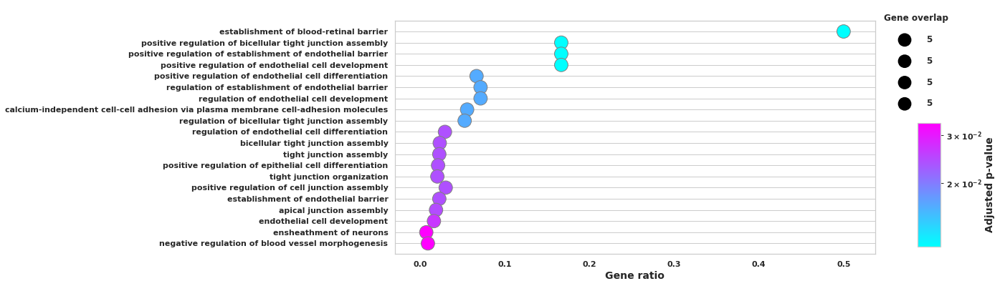

Cluster: 191202_Stress_ELS_vs_BL_6
Cluster: 191129_ELS_Stress_vs_Ctrl_Oligodendrocyte Progenitor Cells (OPCs)


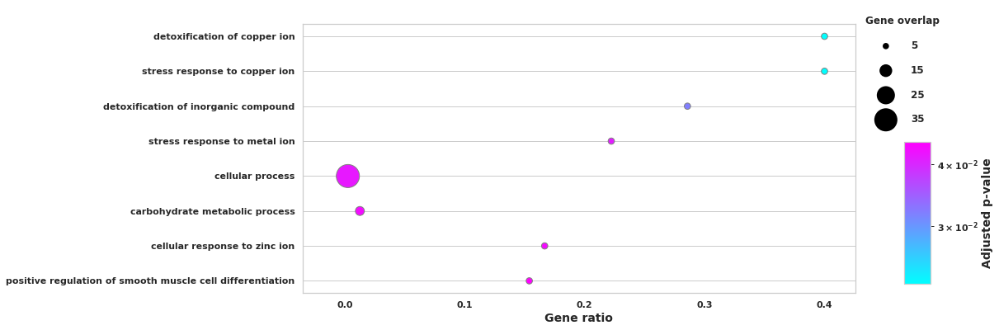

Cluster: 191202_ELS_Stress_vs_Ctrl_4


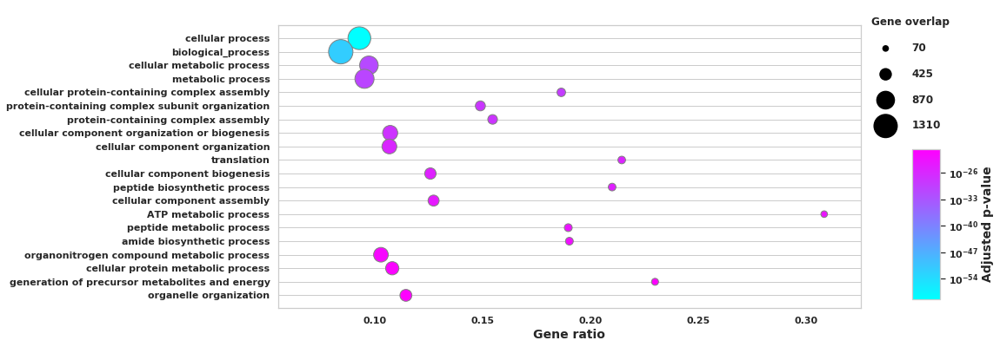

Cluster: 191202_Stress_ELS_vs_BL_12


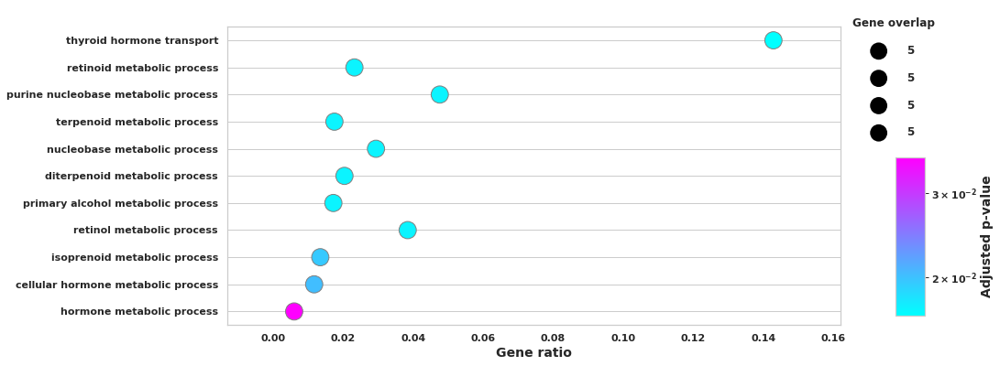

In [140]:
for clust in de_gobp_enrich:
    # Plot the results
    print(f'Cluster: {clust}')
    if len(de_gobp_enrich[clust].values) > 0:
        plot_enrich(de_gobp_enrich[clust])